In [1]:
import math as mh
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import missingno as msno
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
%matplotlib inline
# Linear Regression
from sklearn.linear_model import LinearRegression
# Cross Validate
from sklearn.model_selection import cross_validate
# Decision Tree
from sklearn.tree import DecisionTreeClassifier
# KNN
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix
# PCA
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
# Random Forest
from sklearn.ensemble import RandomForestClassifier
# SVC
from sklearn.svm import SVC
# Clustering
from sklearn.cluster import KMeans
# Logistic Regression
from sklearn.linear_model import LogisticRegression
# Naive Bayes
from sklearn.naive_bayes import GaussianNB

## ------------------------------------------> Data Collection <------------------------------------------

In [2]:
# Read dataset
dataset=pd.read_csv("water_potability.csv")

In [3]:
# Length of dataset
len(dataset)

3276

In [4]:
# Size of dataset
dataset.shape

(3276, 10)

In [5]:
dataset.keys()

Index(['ph', 'Hardness', 'Solids', 'Chloramines', 'Sulfate', 'Conductivity',
       'Organic_carbon', 'Trihalomethanes', 'Turbidity', 'Potability'],
      dtype='object')

In [6]:
dataset.columns.values.tolist()

['ph',
 'Hardness',
 'Solids',
 'Chloramines',
 'Sulfate',
 'Conductivity',
 'Organic_carbon',
 'Trihalomethanes',
 'Turbidity',
 'Potability']

In [7]:
dataset.dtypes

ph                 float64
Hardness           float64
Solids             float64
Chloramines        float64
Sulfate            float64
Conductivity       float64
Organic_carbon     float64
Trihalomethanes    float64
Turbidity          float64
Potability           int64
dtype: object

In [8]:
dataset.head(10)

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,NaN,204.890455,20791.318981,7.300212,368.516441,564.308654,10.379783,86.990970,2.963135,0
1,3.716080,129.422921,18630.057858,6.635246,NaN,592.885359,15.180013,56.329076,4.500656,0
2,8.099124,224.236259,19909.541732,9.275884,NaN,418.606213,16.868637,66.420093,3.055934,0
3,8.316766,214.373394,22018.417441,8.059332,356.886136,363.266516,18.436524,100.341674,4.628771,0
4,9.092223,181.101509,17978.986339,6.546600,310.135738,398.410813,11.558279,31.997993,4.075075,0
5,5.584087,188.313324,28748.687739,7.544869,326.678363,280.467916,8.399735,54.917862,2.559708,0
6,10.223862,248.071735,28749.716544,7.513408,393.663396,283.651634,13.789695,84.603556,2.672989,0
7,8.635849,203.361523,13672.091764,4.563009,303.309771,474.607645,12.363817,62.798309,4.401425,0
8,NaN,118.988579,14285.583854,7.804174,268.646941,389.375566,12.706049,53.928846,3.595017,0
9,11.180284,227.231469,25484.508491,9.077200,404.041635,563.885481,17.927806,71.976601,4.370562,0


1. pH Value: pH is a crucial parameter for assessing the acid-base balance of water and determining its acidic or alkaline nature. The World Health Organization (WHO) recommends a maximum permissible pH range of 6.5 to 8.5 for water. The investigation results fall within the WHO standards, with values ranging from 6.52 to 6.83.

2. Hardness: Hardness in water is primarily caused by the presence of calcium and magnesium salts, which dissolve from geological deposits as water travels through them. The duration of contact between water and hardness-producing materials determines the level of hardness in the water. Hardness was originally defined based on the water's capacity to precipitate soap due to the presence of calcium and magnesium.

3. Total Dissolved Solids (TDS): Water has the ability to dissolve various inorganic and organic minerals or salts such as potassium, calcium, sodium, bicarbonates, chlorides, magnesium, and sulfates. These minerals can impart an undesirable taste and diluted appearance to water. TDS is an important parameter for water use. The desirable limit for TDS in drinking water is 500 mg/L, with a maximum limit of 1000 mg/L.

4. Chloramines: Chlorine and chloramine are commonly used disinfectants in public water systems. Chloramines are formed when ammonia is added to chlorine for treating drinking water. Chlorine levels up to 4 milligrams per liter (mg/L) or 4 parts per million (ppm) are considered safe in drinking water.

5. Sulfate: Sulfates are naturally occurring substances found in minerals, soil, rocks, ambient air, groundwater, plants, and food. They are widely used in the chemical industry. In seawater, sulfate concentration is approximately 2,700 mg/L, while in most freshwater supplies, it ranges from 3 to 30 mg/L. Some locations may have higher concentrations of up to 1000 mg/L.

6. Conductivity: Pure water is a poor conductor of electric current and acts as an insulator. However, the presence of ions in water increases its electrical conductivity. The amount of dissolved solids in water determines its electrical conductivity. According to WHO standards, the electrical conductivity (EC) value should not exceed 400 μS/cm.

7. Organic Carbon: Total Organic Carbon (TOC) in water sources originates from decaying natural organic matter (NOM) as well as synthetic sources. TOC measures the overall carbon content in organic compounds present in pure water. The US Environmental Protection Agency (EPA) recommends a TOC level of less than 2 mg/L in treated/drinking water and less than 4 mg/L in source water used for treatment.

8. Trihalomethanes: Trihalomethanes (THMs) are chemicals that may be found in water treated with chlorine. The concentration of THMs in drinking water varies based on the organic material content, the amount of chlorine used for treatment, and the water temperature. THM levels up to 80 ppb (parts per billion) are considered safe in drinking water.

9. Turbidity: Turbidity is a measure of the solid particles present in water in a suspended state. It indicates the light-emitting properties of water and is used to assess the quality of waste discharge concerning colloidal matter. The mean turbidity value obtained for the Wondo Genet Campus is 0.98 NTU (Nephelometric Turbidity Units), which is lower than the WHO recommended value of 5.00 NTU.

10. Potability: Potability refers to whether water is safe for human consumption. A value of 1 indicates potable (safe for drinking), while a value of 0 indicates non-potable (not safe for drinking).

In [9]:
dataset.describe()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
count,2785.000000,3276.000000,3276.000000,3276.000000,2495.000000,3276.000000,3276.000000,3114.000000,3276.000000,3276.000000
mean,7.080795,196.369496,22014.092526,7.122277,333.775777,426.205111,14.284970,66.396293,3.966786,0.390110
std,1.594320,32.879761,8768.570828,1.583085,41.416840,80.824064,3.308162,16.175008,0.780382,0.487849
min,0.000000,47.432000,320.942611,0.352000,129.000000,181.483754,2.200000,0.738000,1.450000,0.000000
25%,6.093092,176.850538,15666.690297,6.127421,307.699498,365.734414,12.065801,55.844536,3.439711,0.000000
50%,7.036752,196.967627,20927.833607,7.130299,333.073546,421.884968,14.218338,66.622485,3.955028,0.000000
75%,8.062066,216.667456,27332.762127,8.114887,359.950170,481.792304,16.557652,77.337473,4.500320,1.000000
max,14.000000,323.124000,61227.196008,13.127000,481.030642,753.342620,28.300000,124.000000,6.739000,1.000000


In [10]:
dataset.describe().T

,count,mean,std,min,25%,50%,75%,max
ph,2785.0,7.080795,1.594320,0.000000,6.093092,7.036752,8.062066,14.000000
Hardness,3276.0,196.369496,32.879761,47.432000,176.850538,196.967627,216.667456,323.124000
Solids,3276.0,22014.092526,8768.570828,320.942611,15666.690297,20927.833607,27332.762127,61227.196008
Chloramines,3276.0,7.122277,1.583085,0.352000,6.127421,7.130299,8.114887,13.127000
Sulfate,2495.0,333.775777,41.416840,129.000000,307.699498,333.073546,359.950170,481.030642
Conductivity,3276.0,426.205111,80.824064,181.483754,365.734414,421.884968,481.792304,753.342620
Organic_carbon,3276.0,14.284970,3.308162,2.200000,12.065801,14.218338,16.557652,28.300000
Trihalomethanes,3114.0,66.396293,16.175008,0.738000,55.844536,66.622485,77.337473,124.000000
Turbidity,3276.0,3.966786,0.780382,1.450000,3.439711,3.955028,4.500320,6.739000
Potability,3276.0,0.390110,0.487849,0.000000,0.000000,0.000000,1.000000,1.000000


In [11]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3276 entries, 0 to 3275
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ph               2785 non-null   float64
 1   Hardness         3276 non-null   float64
 2   Solids           3276 non-null   float64
 3   Chloramines      3276 non-null   float64
 4   Sulfate          2495 non-null   float64
 5   Conductivity     3276 non-null   float64
 6   Organic_carbon   3276 non-null   float64
 7   Trihalomethanes  3114 non-null   float64
 8   Turbidity        3276 non-null   float64
 9   Potability       3276 non-null   int64  
dtypes: float64(9), int64(1)
memory usage: 256.1 KB


## ------------------------------------------> Select Target Value <------------------------------------------

In [12]:
# Finding the unique values of the Potability variable in the dataset
dataset.Potability.unique()

array([0, 1], dtype=int64)

In [13]:
# Counting the occurrences of each value in the Potability variable by grouping
print(dataset.groupby('Potability').size())

Potability
0    1998
1    1278
dtype: int64


<AxesSubplot:ylabel='Density'>

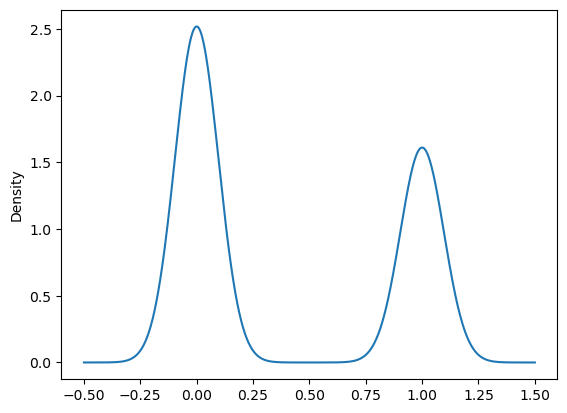

In [14]:
# Visualizing the density distribution of the Potability variable
dataset.Potability.plot.density()

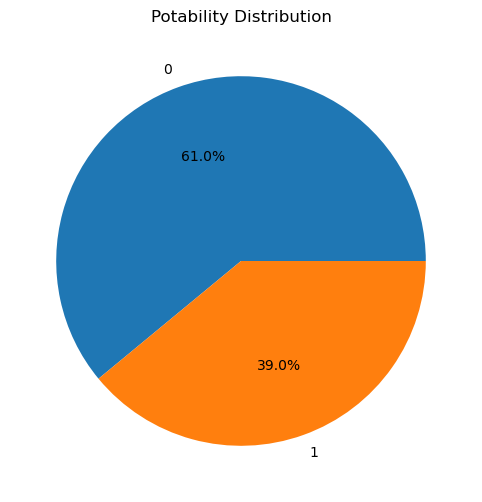

In [15]:
# Select the categorical variable
categorical_var_polability='Potability'
# Calculate the values and counts of the categorical variable in the dataset
category_counts=dataset[categorical_var_polability].value_counts()
categories=category_counts.index
counts=category_counts.values
# Draw the pie chart
plt.figure(figsize=(8, 6))
plt.pie(counts, labels=categories, autopct='%1.1f%%')
plt.title(f"{categorical_var_polability} Distribution")
plt.show()

<Figure size 900x900 with 0 Axes>

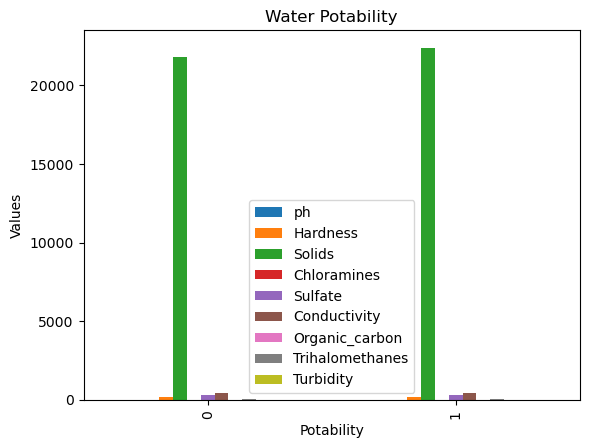

In [16]:
# Visualizing the average values of each column using histograms
plt.figure(figsize=(9, 9))
data_mean=dataset.groupby(dataset.Potability).mean()
data_mean.plot.bar()
plt.title("Water Potability")
plt.xlabel("Potability")
plt.ylabel("Values")
plt.show()

In [17]:
# We are reexamining the dataset by removing the variable 'Solids'.
tmp01_dataset=dataset.copy()
tmp01_dataset.drop('Solids', axis=1, inplace=True)

<Figure size 800x800 with 0 Axes>

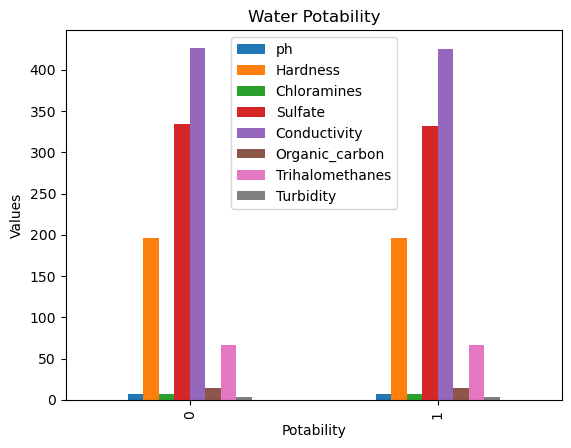

In [18]:
plt.figure(figsize = (8, 8))
data_mean=tmp01_dataset.groupby(tmp01_dataset.Potability).mean()
data_mean.plot.bar()
plt.title("Water Potability")
plt.xlabel("Potability")
plt.ylabel("Values")
plt.show()

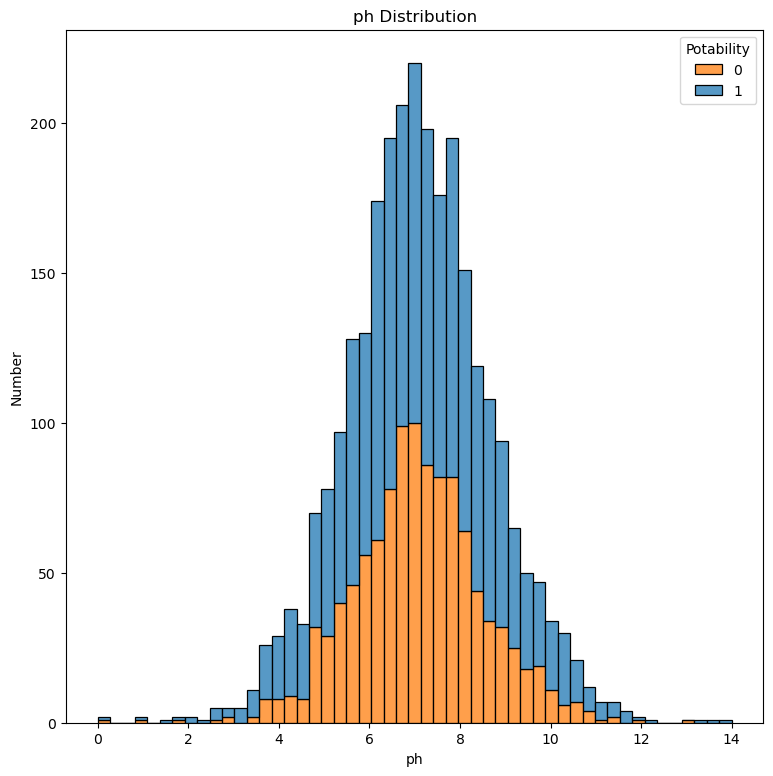

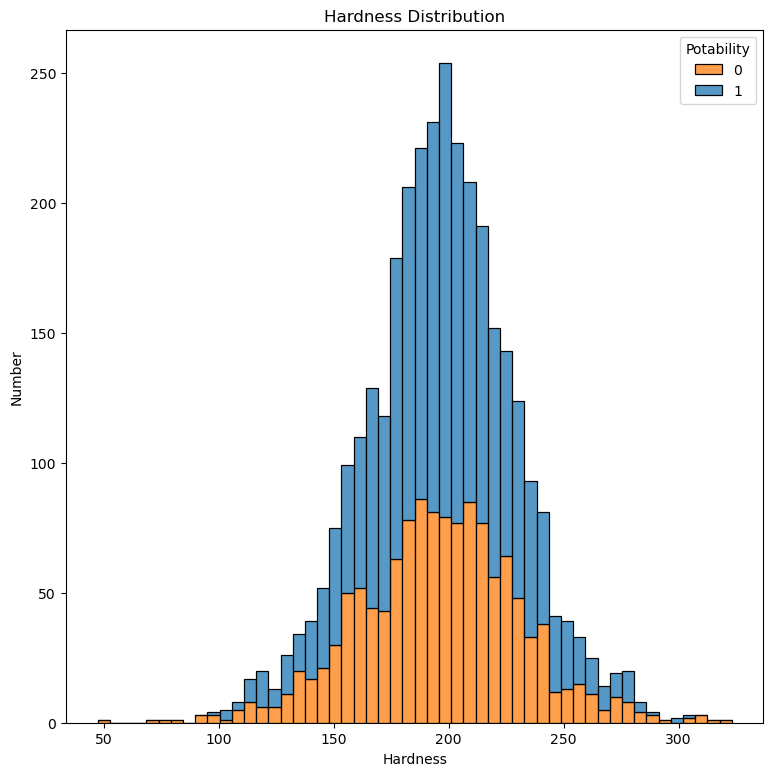

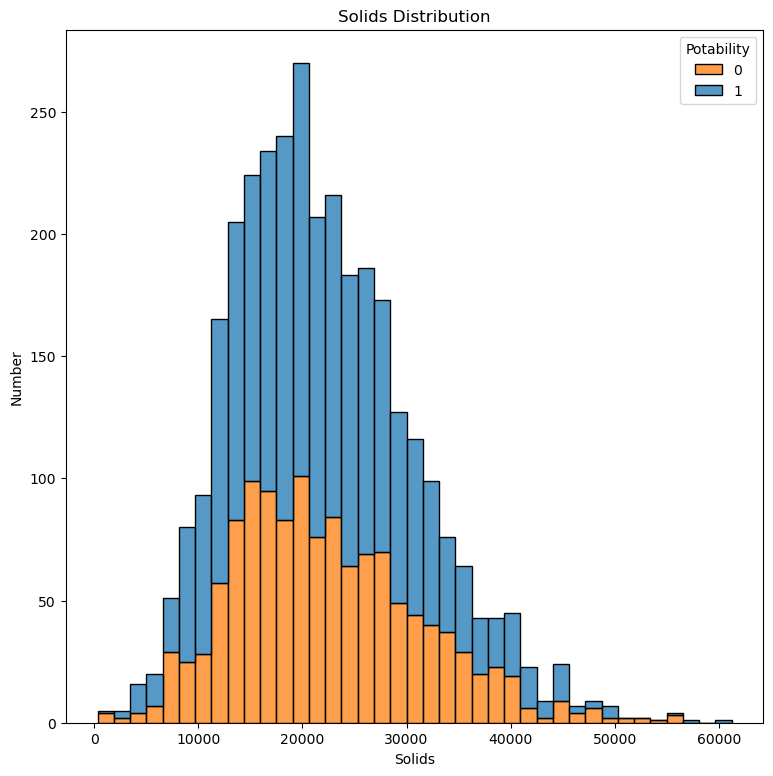

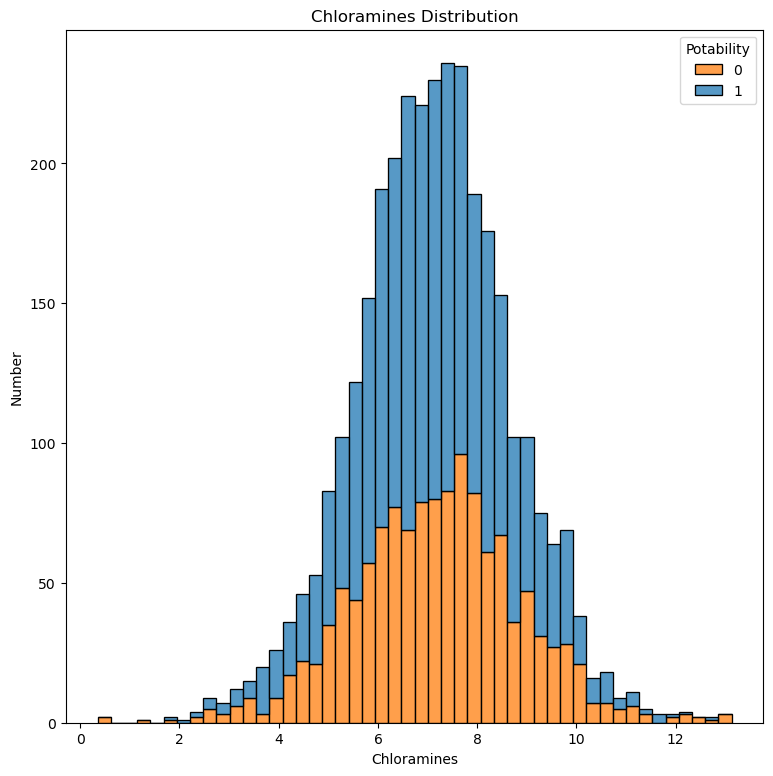

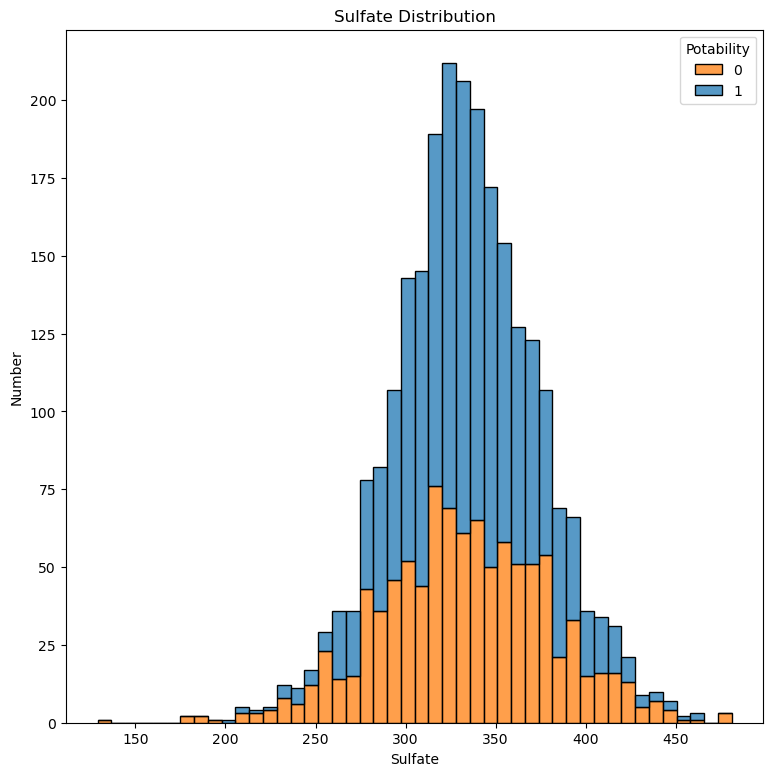

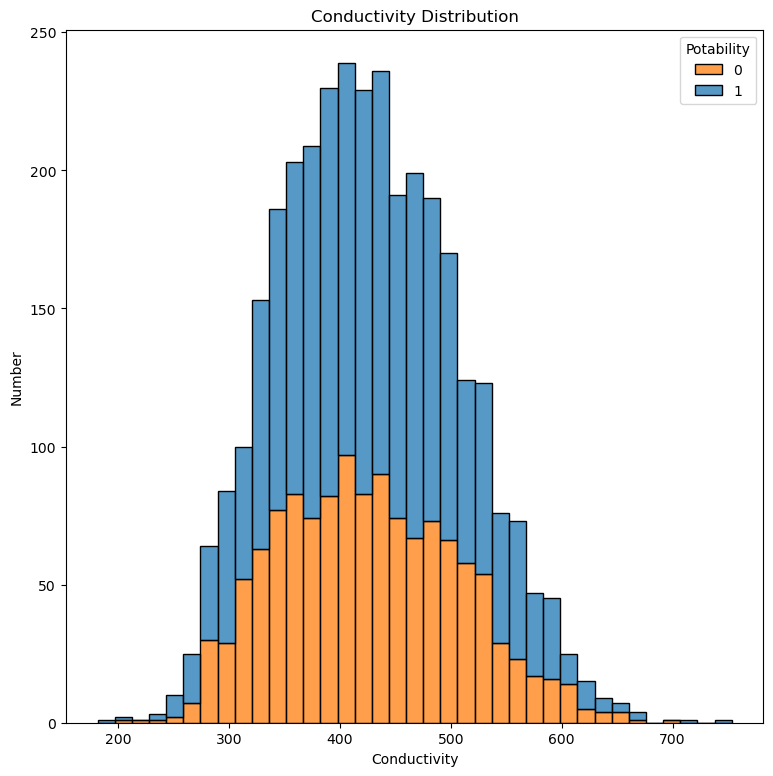

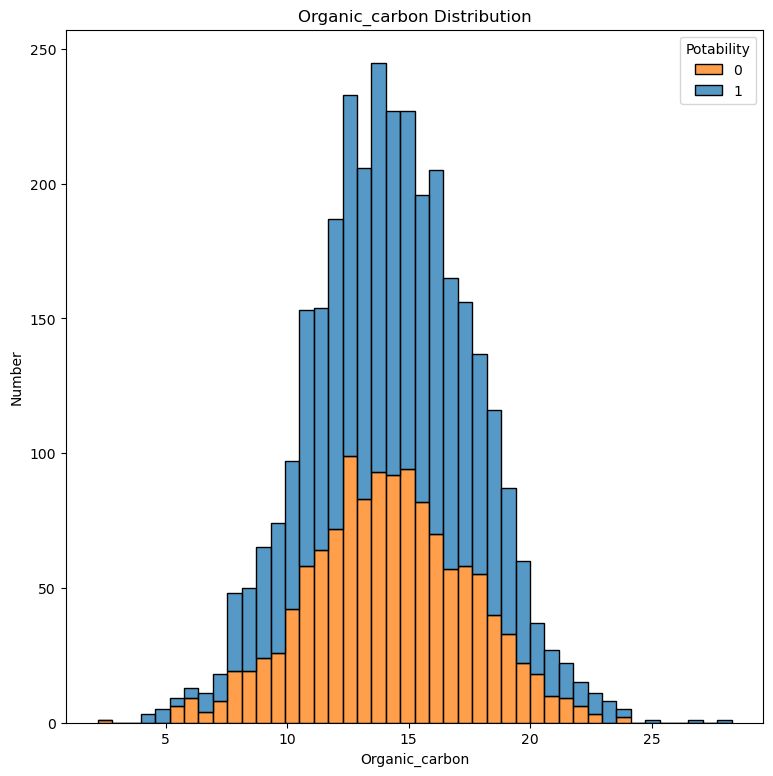

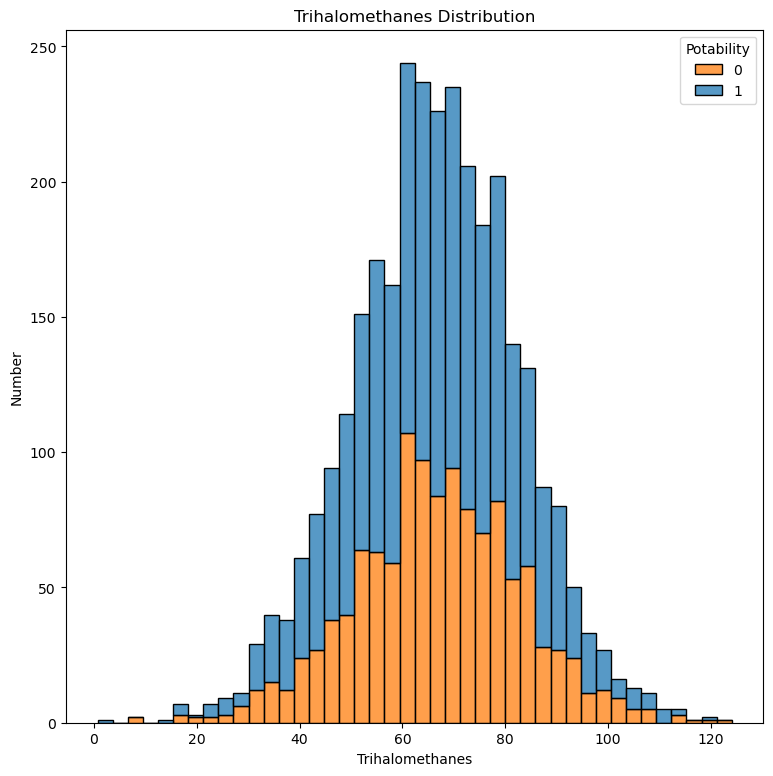

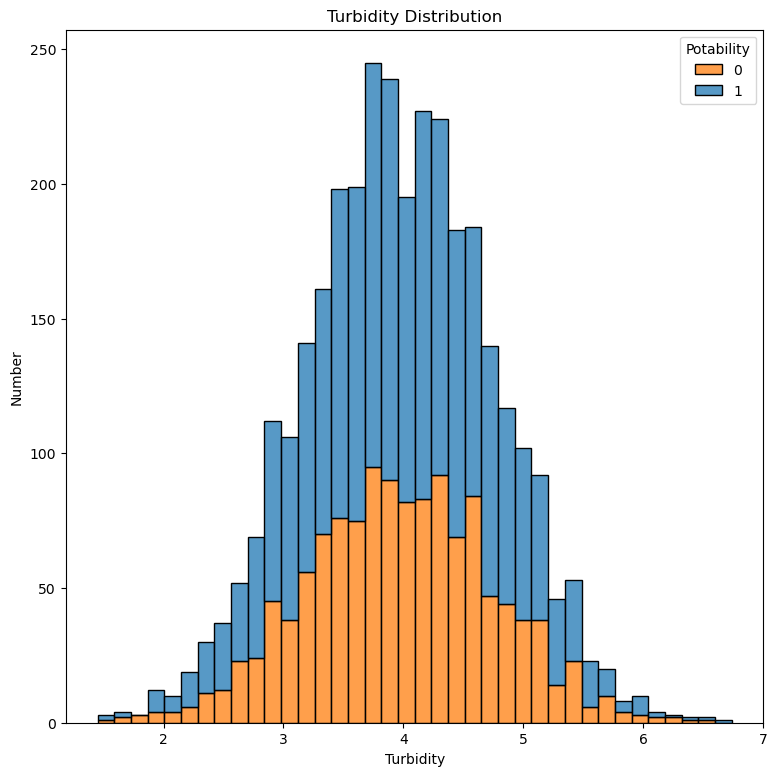

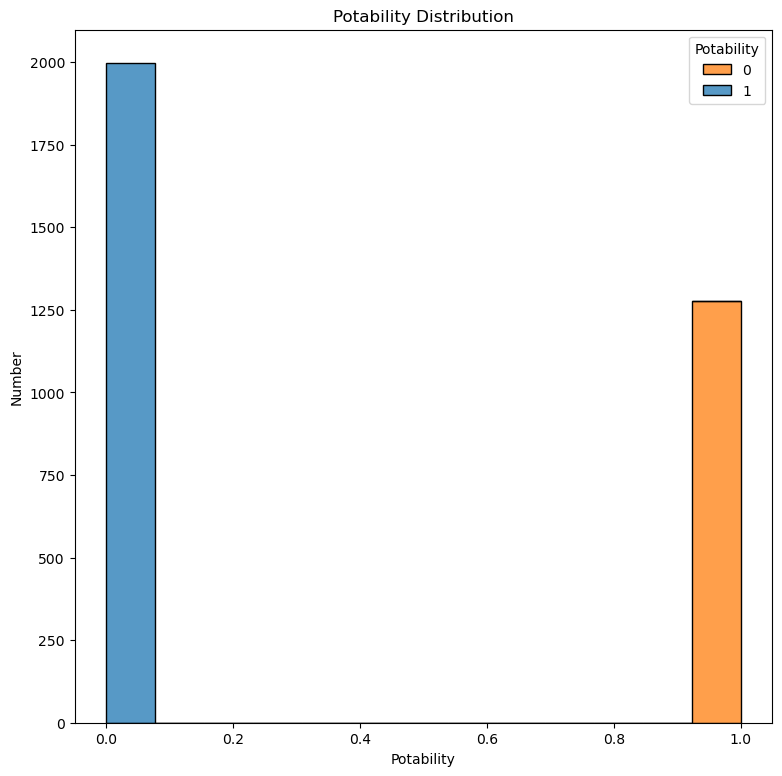

In [19]:
# Used to show the distribution or density of the data set.
# Draw a scatter plot for each categorical variable
potability_var='Potability'
for var in dataset:
    plt.figure(figsize=(9, 9))
    sns.histplot(data=dataset, x=var, hue=potability_var, multiple='stack')
    plt.title(f"{var} Distribution")
    plt.xlabel(var)
    plt.ylabel("Number")
    plt.legend(title='Potability', labels=dataset[potability_var].unique())
    plt.show()

(To demonstrate the relationship between a numerical feature and a target variable, we can utilize a box plot. A box plot visually represents the distribution of feature values across various target classes. It provides valuable insights into the variability and distribution of the feature within each target class.)

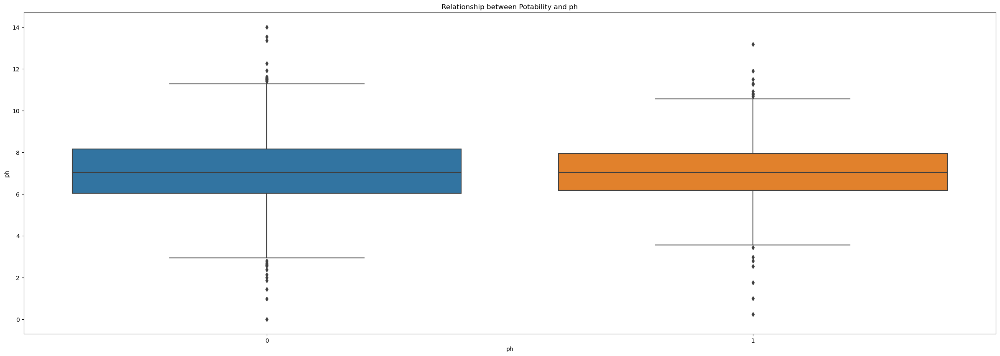

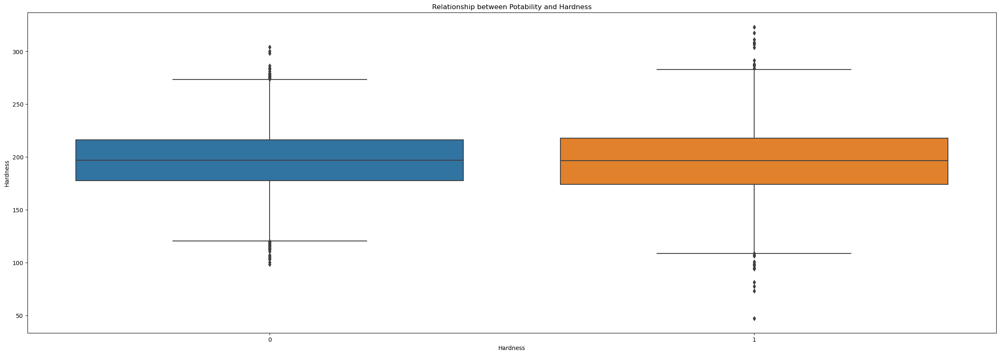

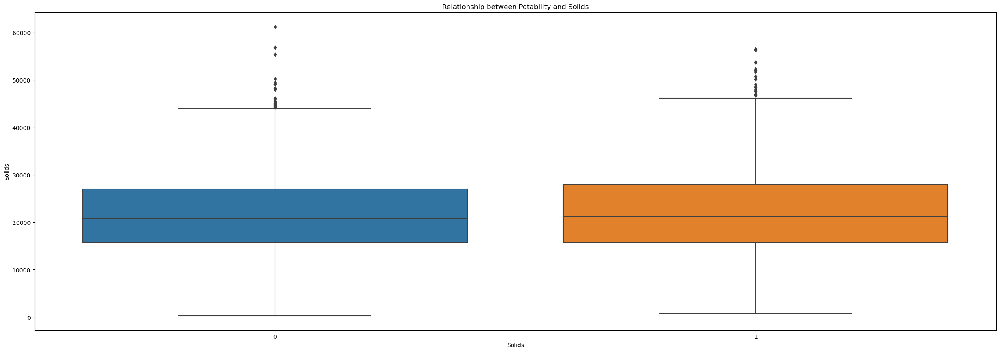

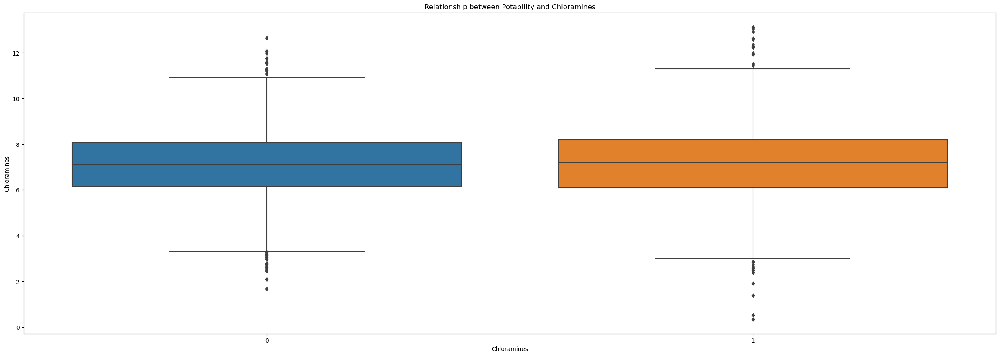

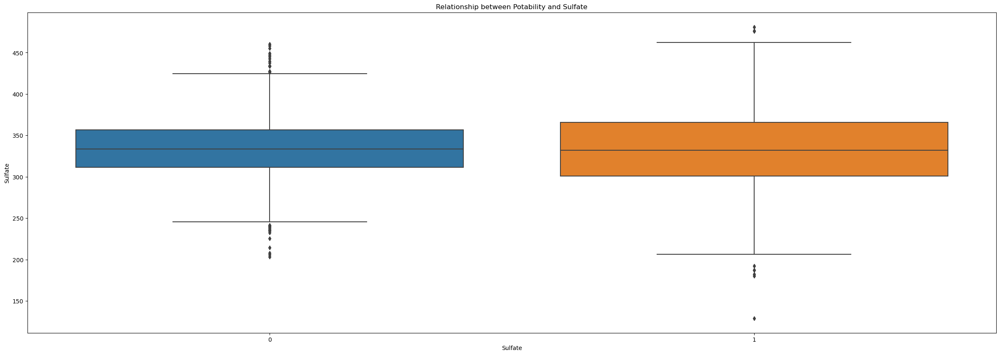

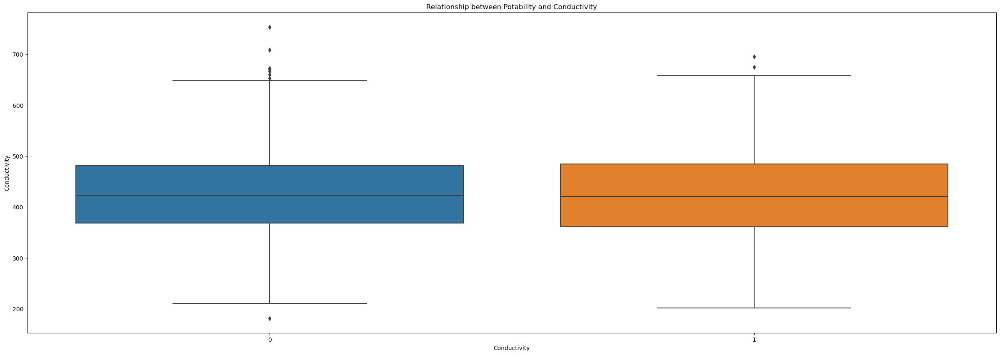

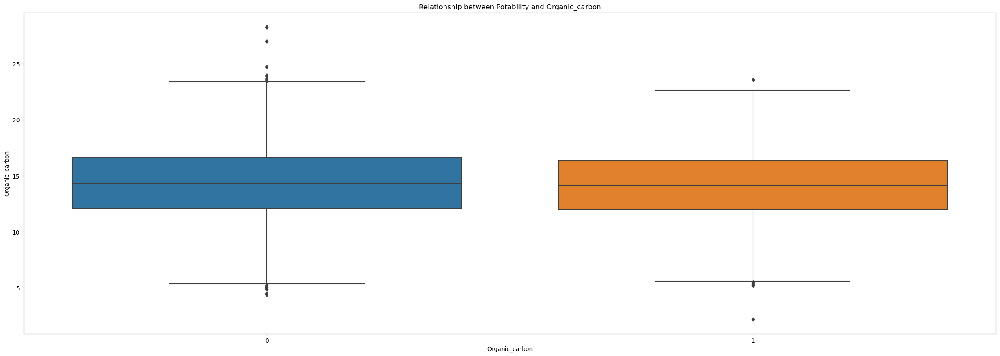

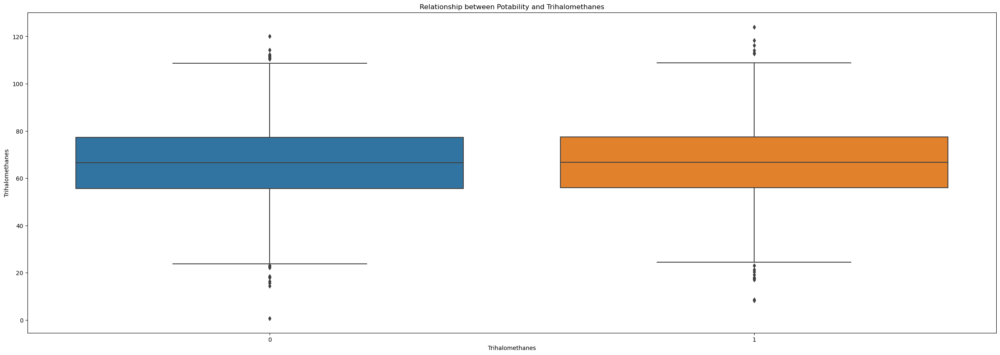

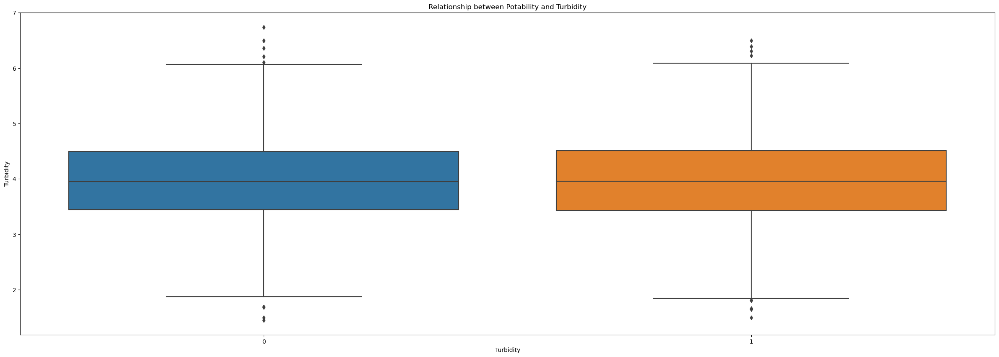

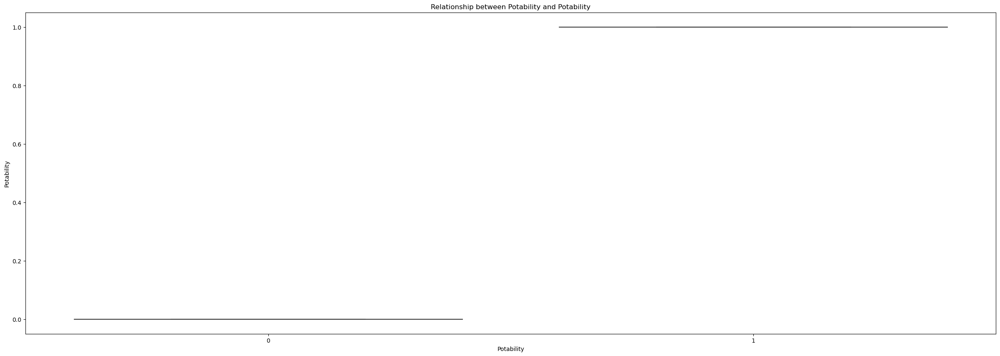

In [20]:
for var in dataset:
    plt.figure(figsize=(30,10))
    sns.boxplot(x=dataset['Potability'], y=var ,data=dataset)
    plt.title("Relationship between Potability and "+var)
    plt.xlabel(var)
    plt.show()

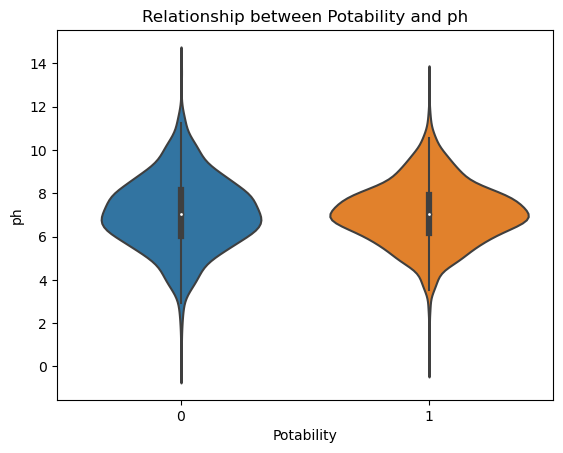

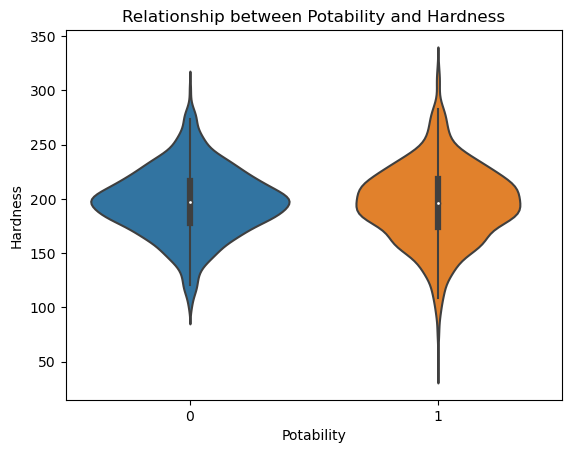

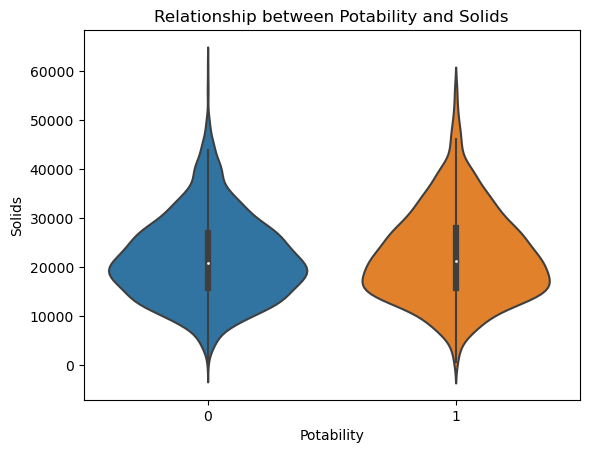

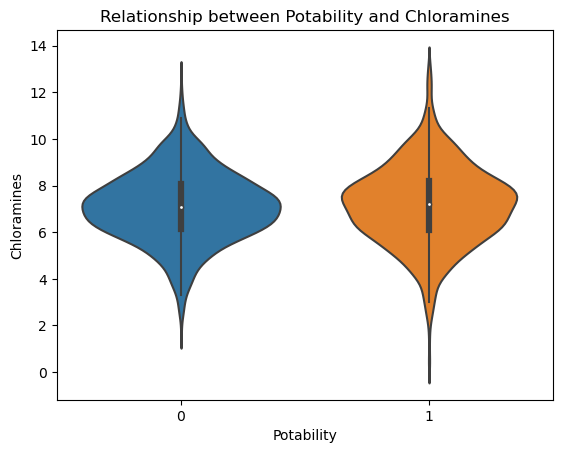

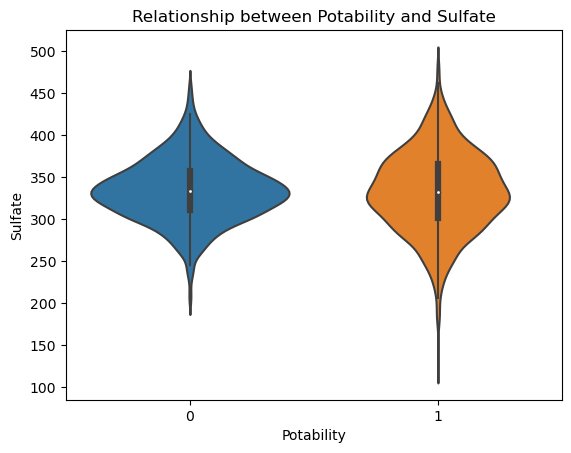

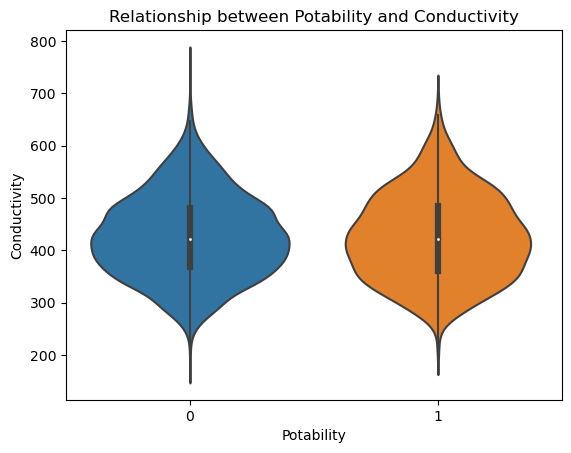

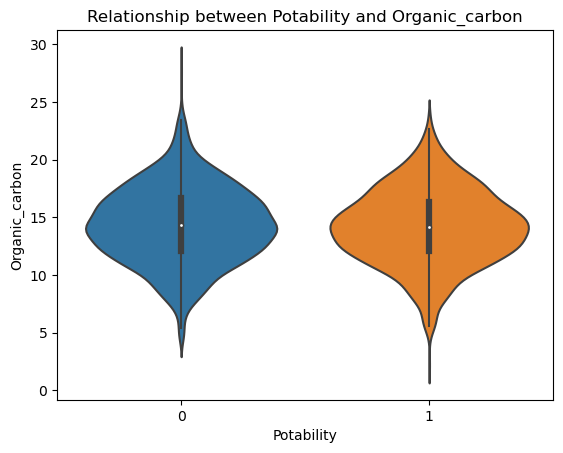

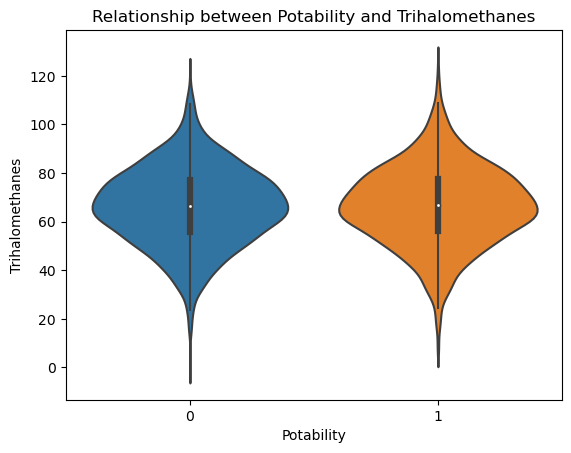

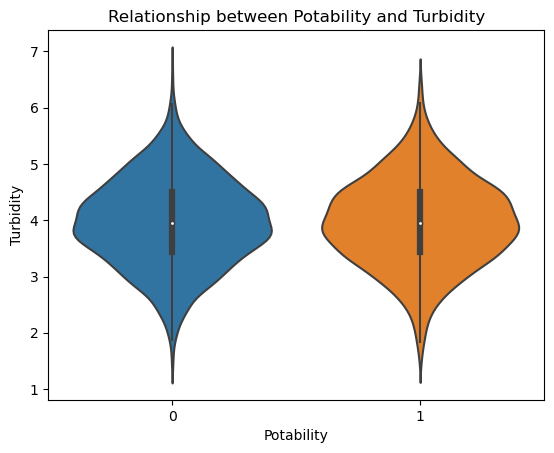

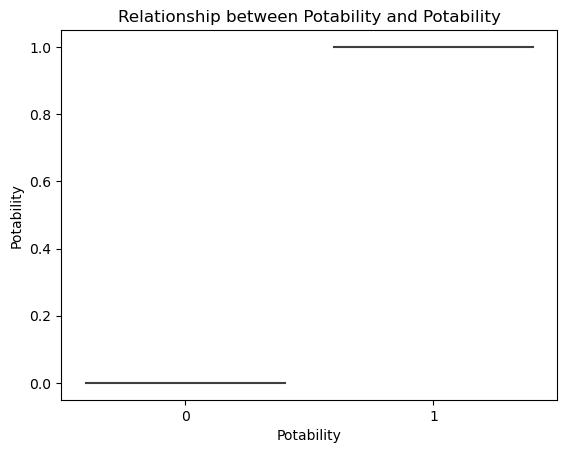

In [21]:
for column in dataset.columns:
    sns.violinplot(x=dataset['Potability'], y=dataset[column])
    plt.xlabel('Potability')
    plt.ylabel(column)
    plt.title("Relationship between Potability and "+column)
    plt.show()

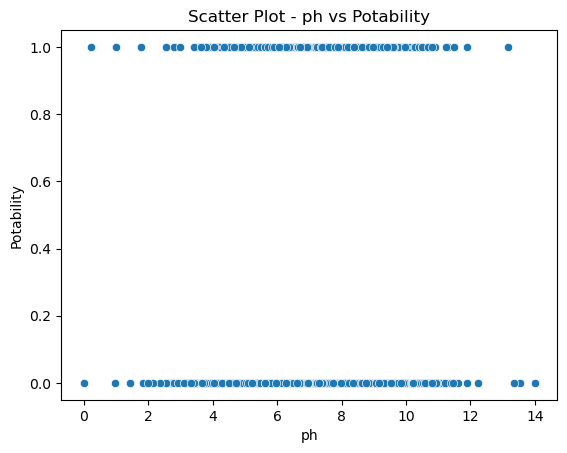

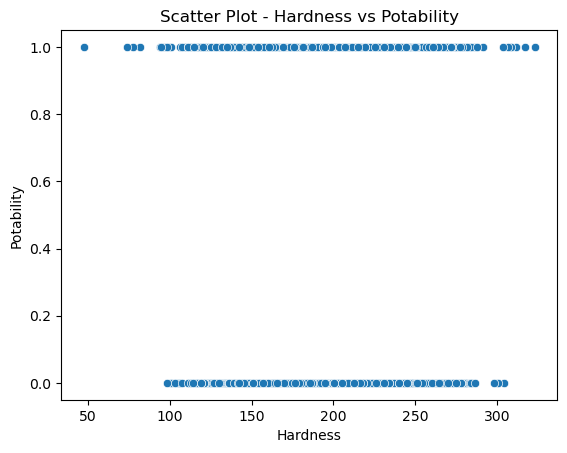

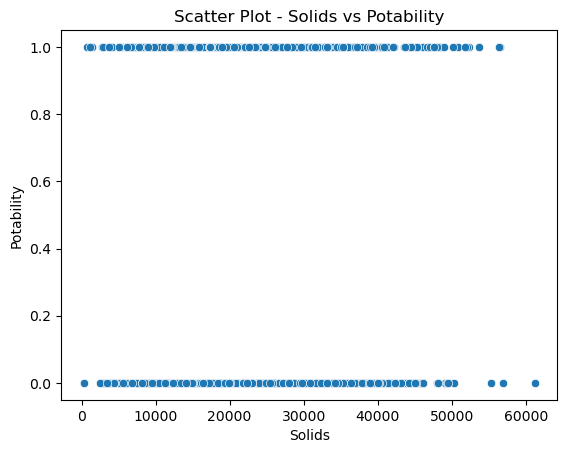

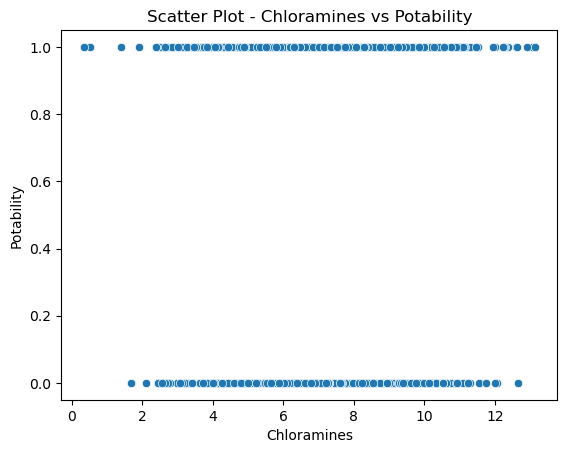

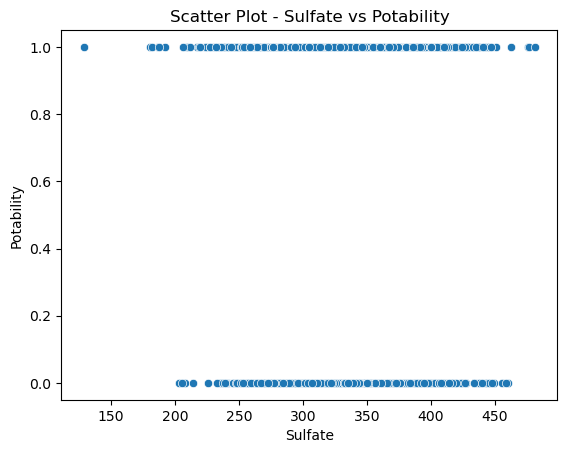

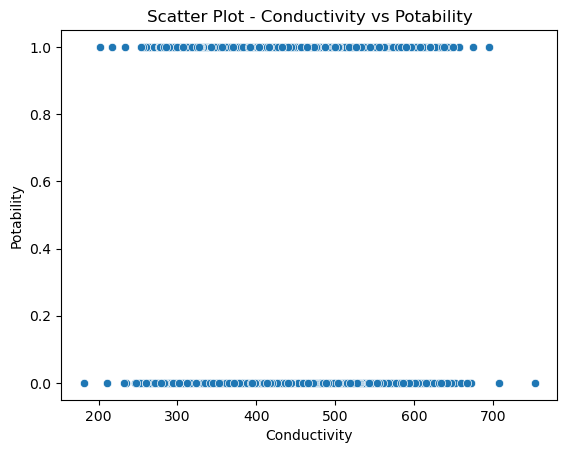

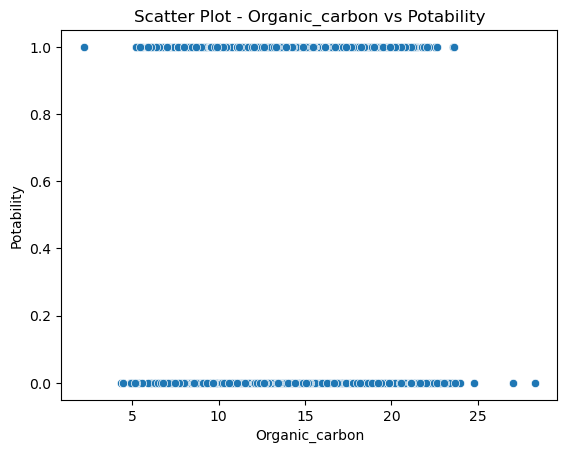

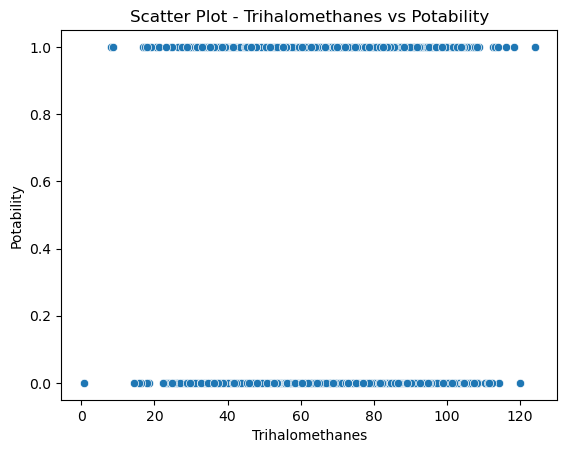

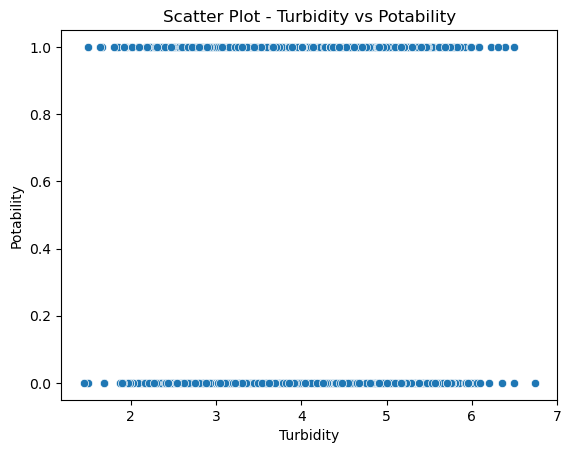

In [22]:
X=dataset.iloc[:, :9]
# Independent variables
y=dataset.iloc[:, 9]
# Target variable (Potability)
for column in X.columns:
    sns.scatterplot(x=X[column], y=y)
    plt.xlabel(column)
    plt.ylabel("Potability")
    plt.title("Scatter Plot - {} vs Potability".format(column))
    plt.show()

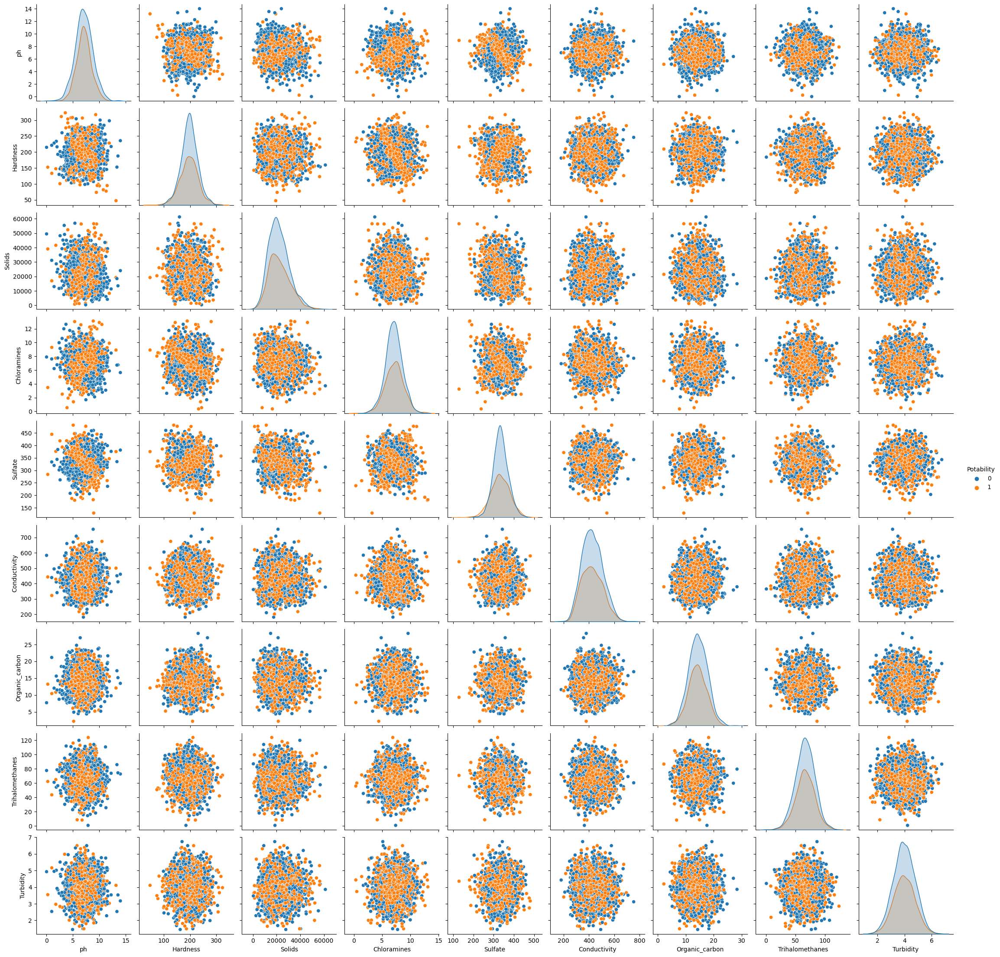

In [23]:
sns.pairplot(dataset,hue='Potability')
plt.show()

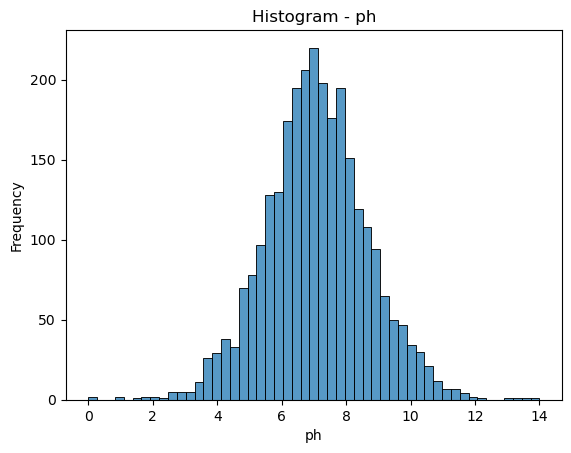

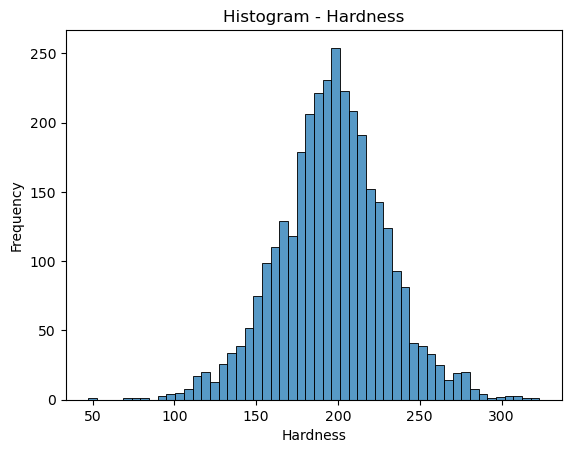

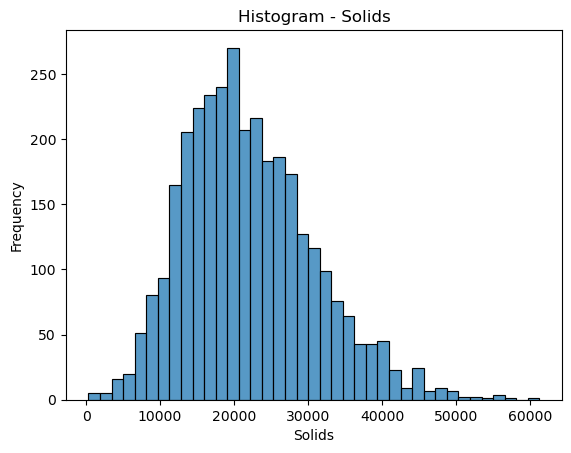

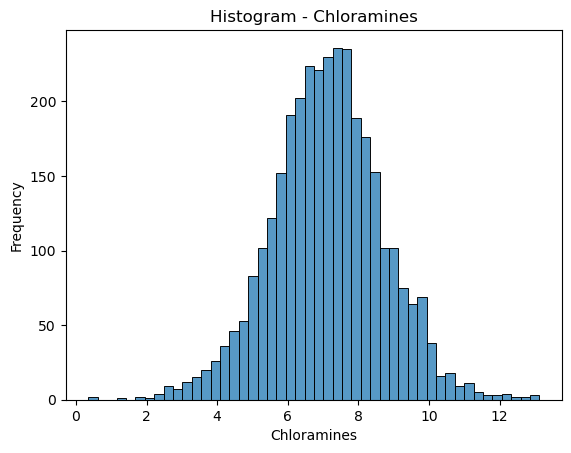

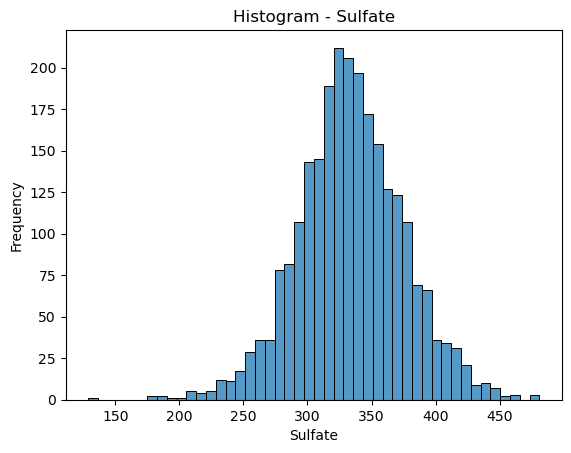

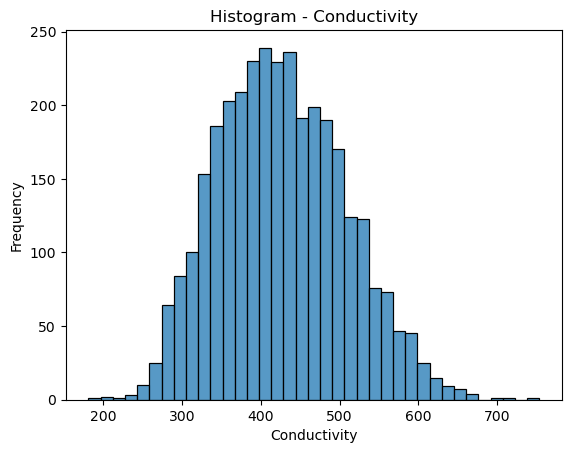

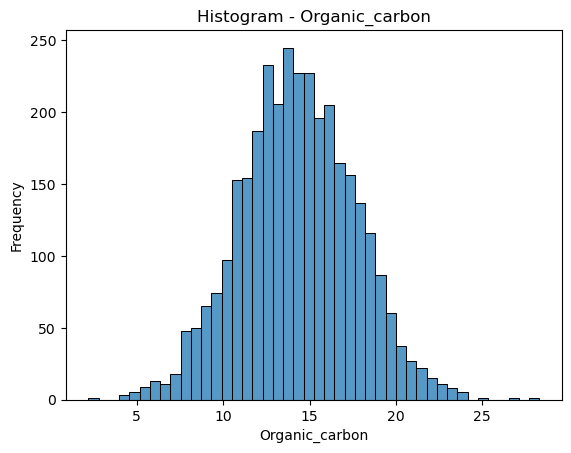

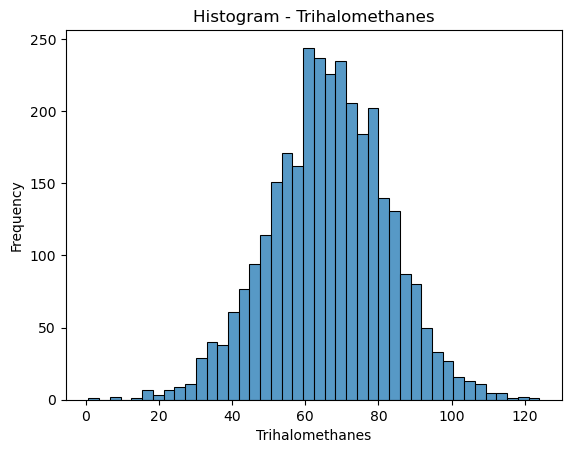

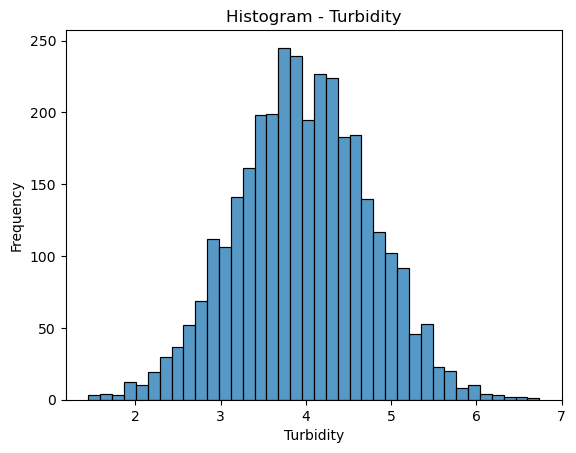

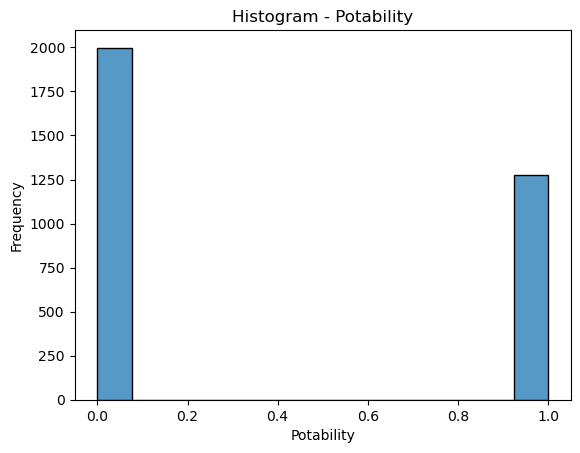

In [24]:
for column in dataset.columns:
    sns.histplot(dataset[column])
    plt.xlabel(column)
    plt.ylabel("Frequency")
    plt.title("Histogram - {}".format(column))
    plt.show()

(A bar plot is a visualization technique commonly used to display the distribution of categorical data or make comparisons between different groups.)

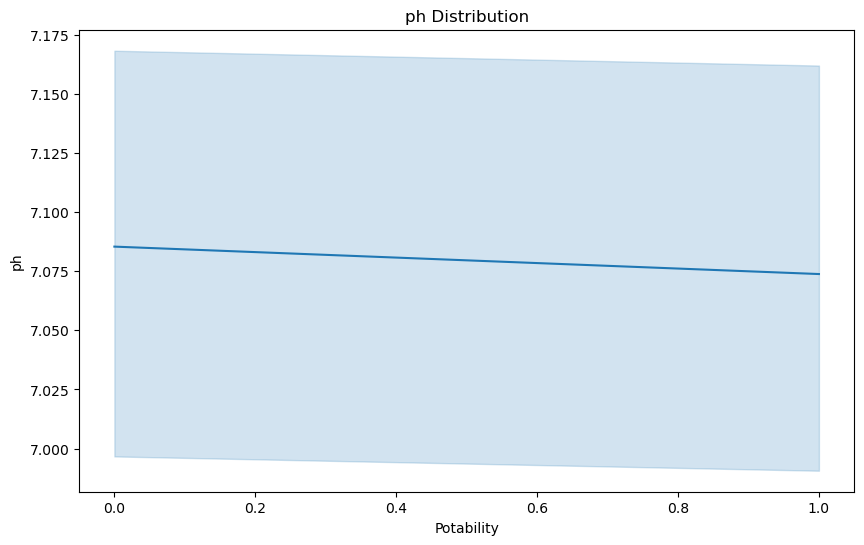

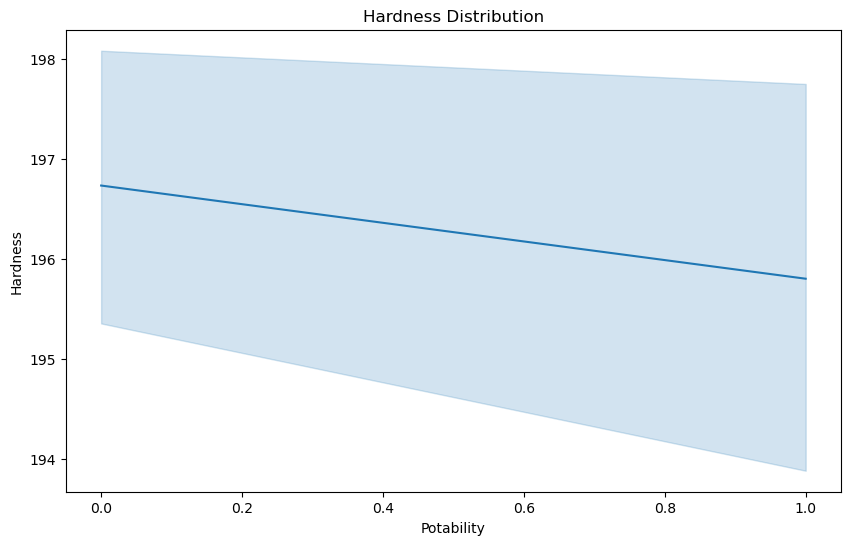

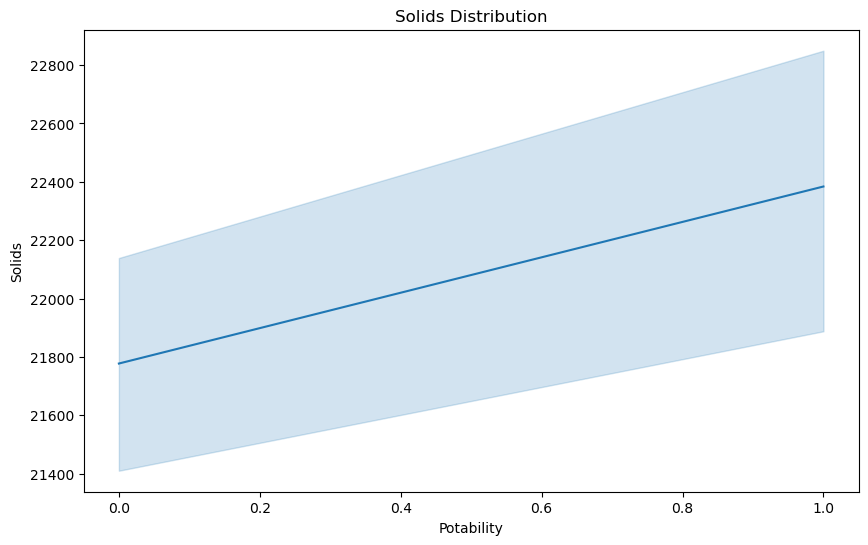

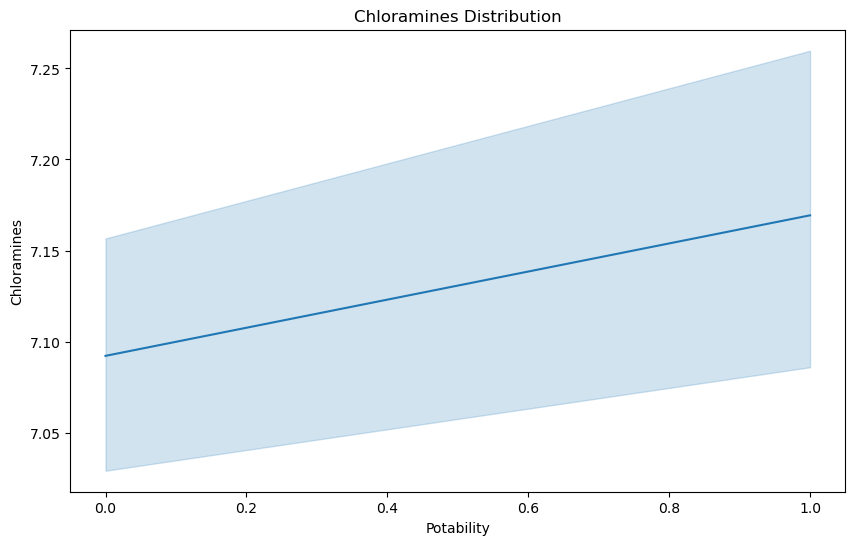

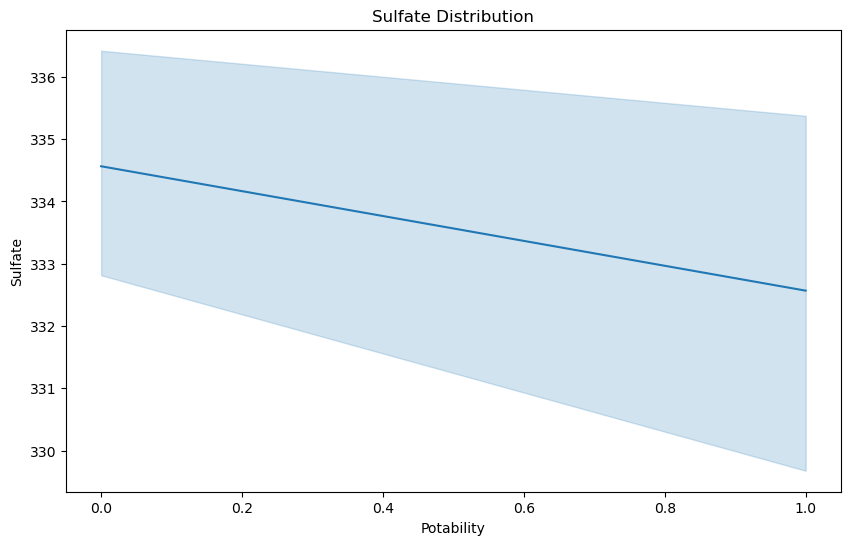

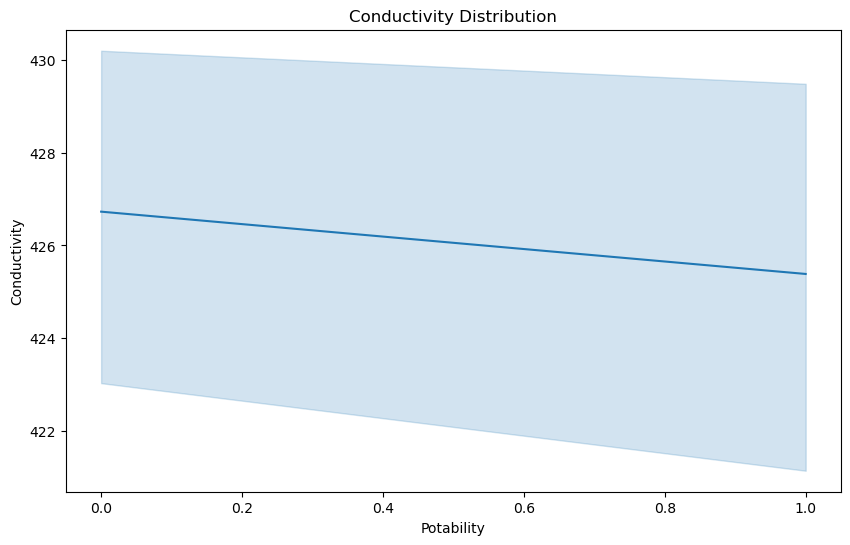

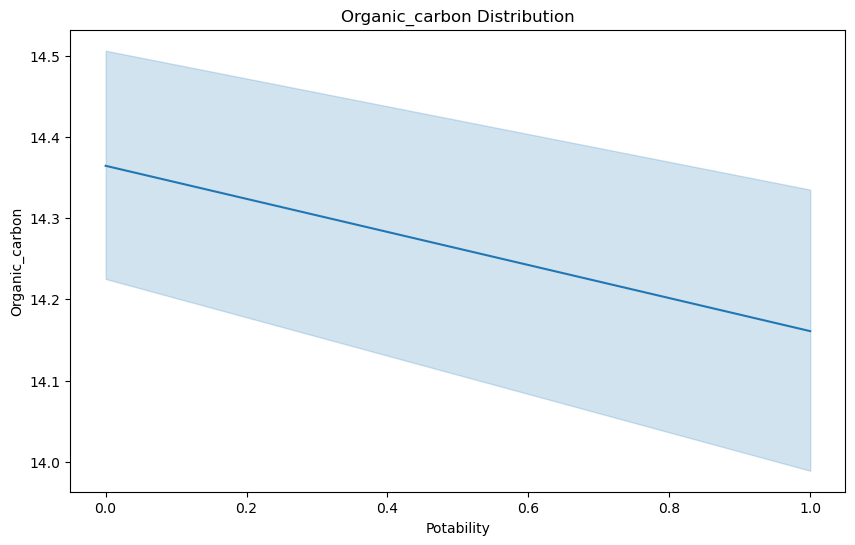

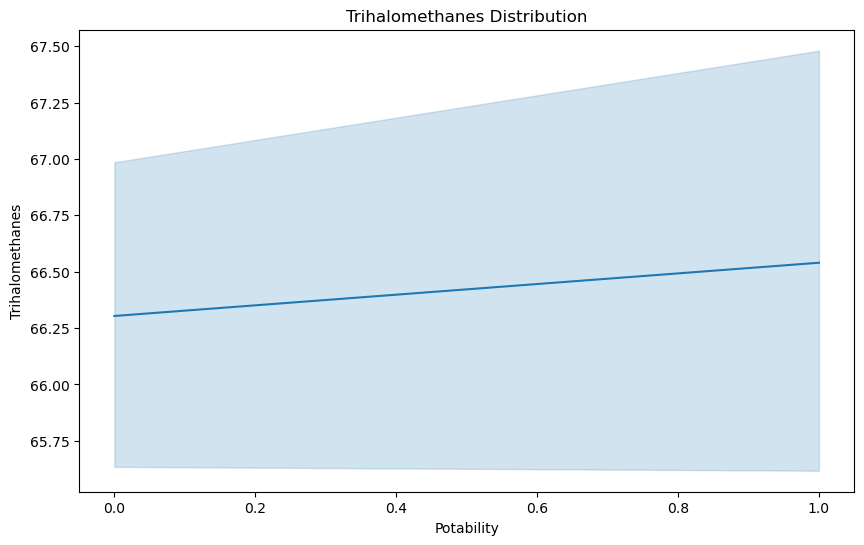

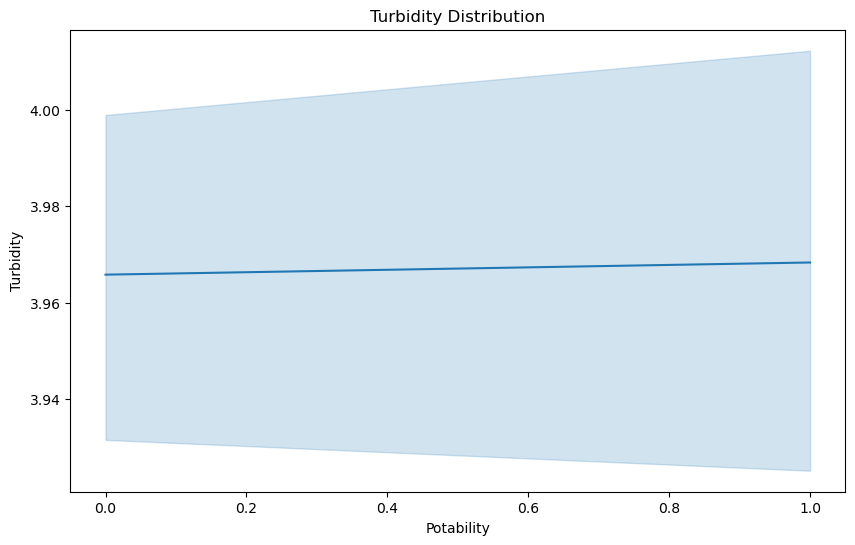

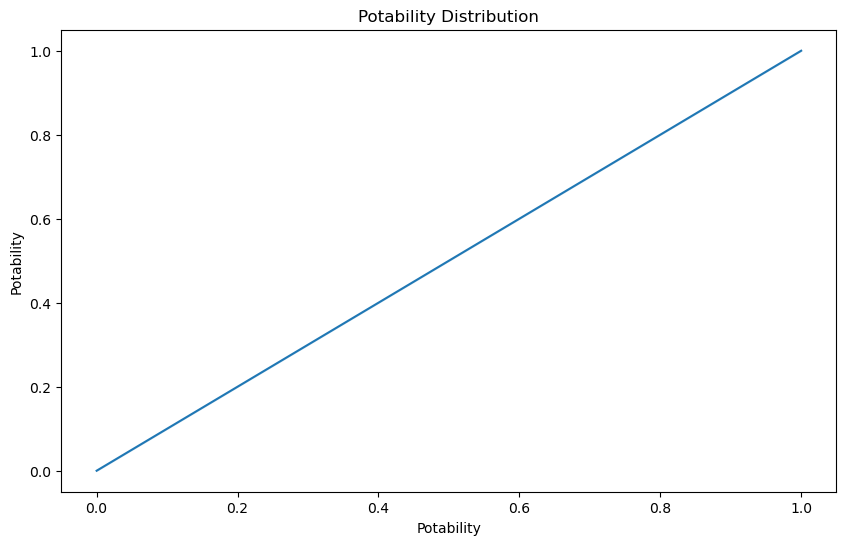

In [25]:
for var in dataset:
    plt.figure(figsize=(10, 6))
    sns.lineplot(data=dataset, x='Potability', y=var)
    plt.title(f"{var} Distribution")
    plt.xlabel("Potability")
    plt.ylabel(var)
    plt.show()

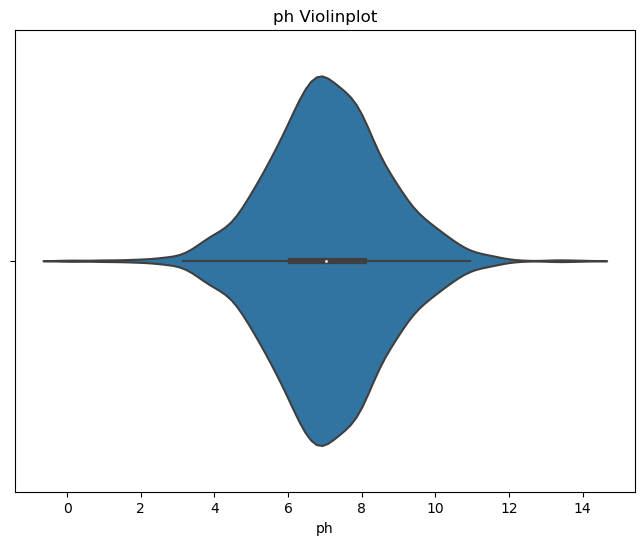

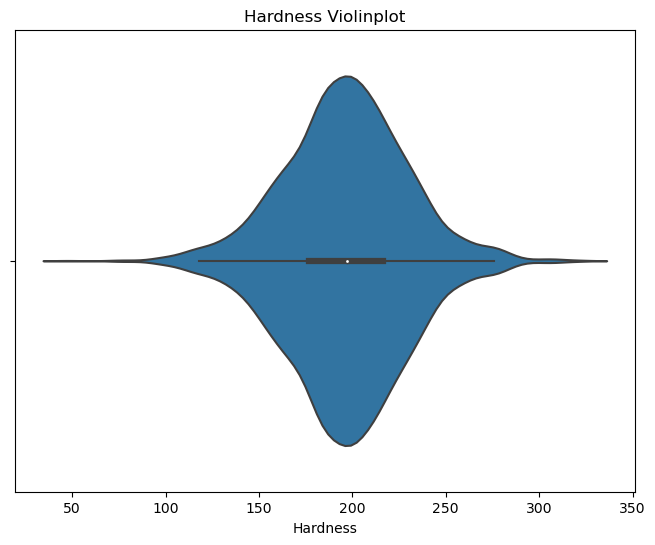

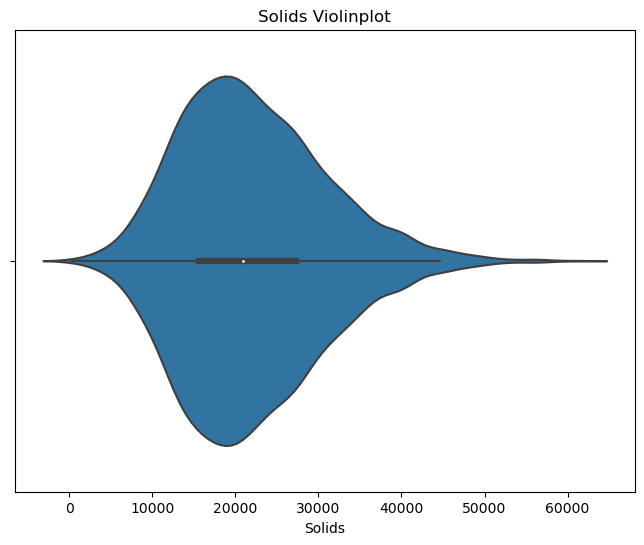

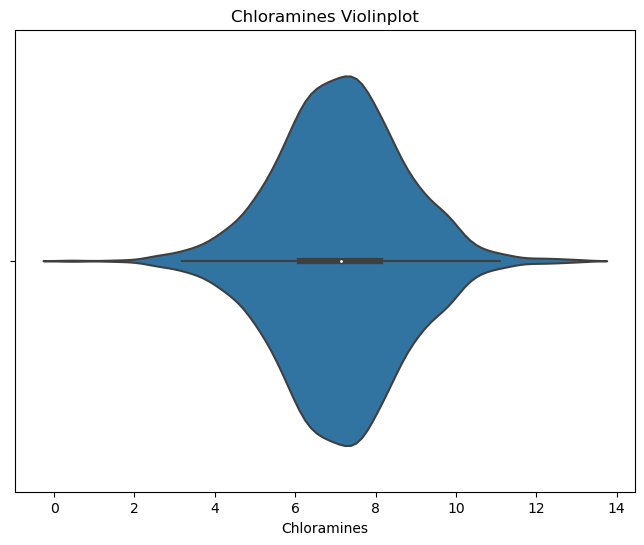

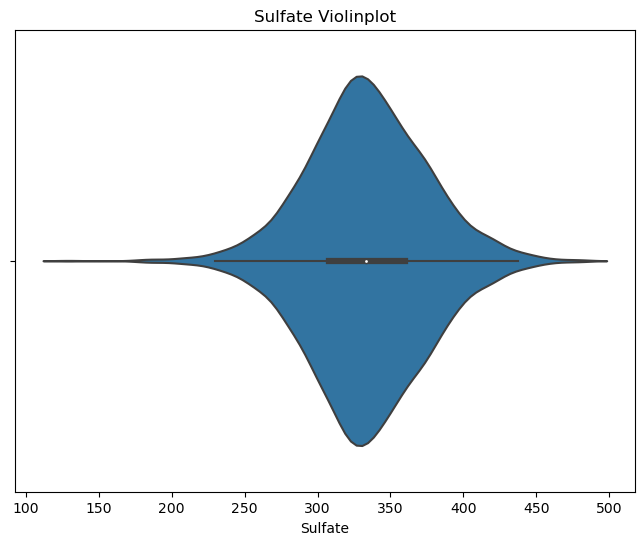

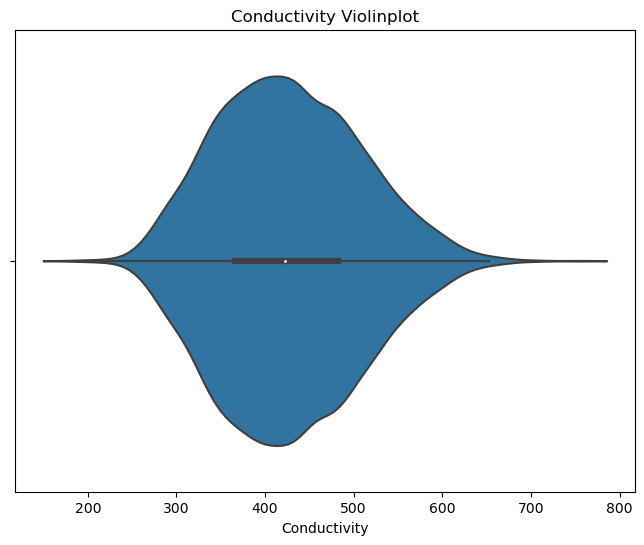

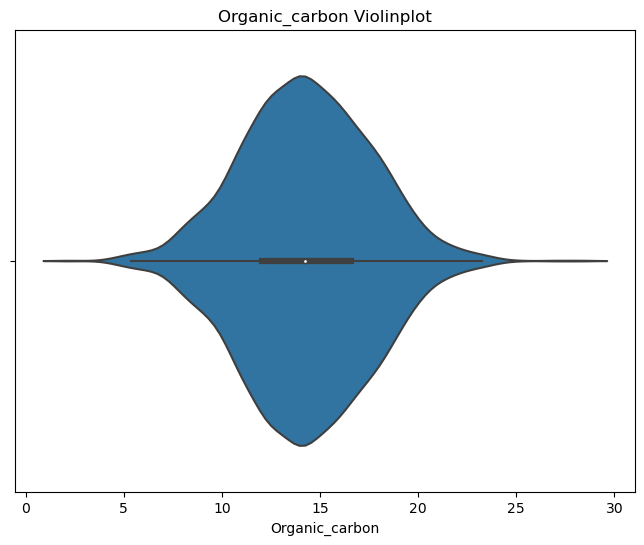

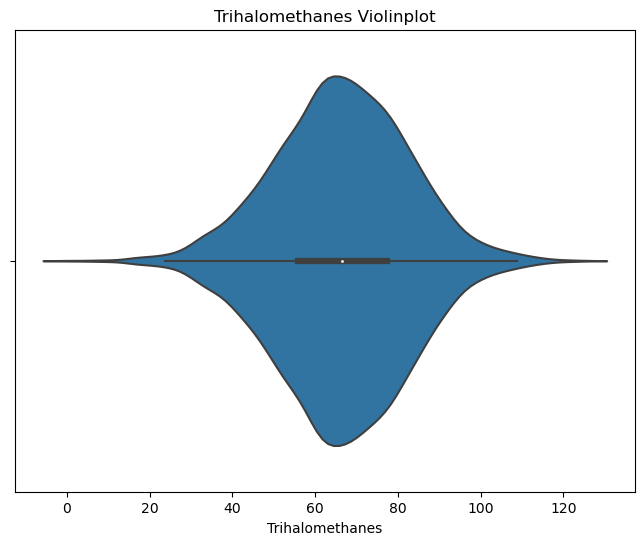

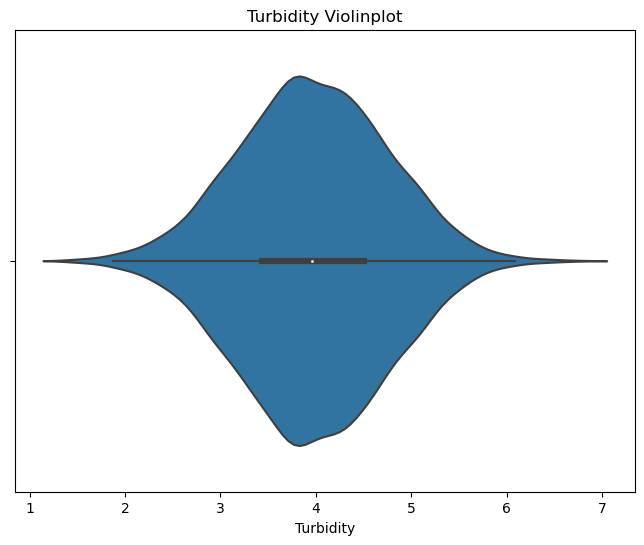

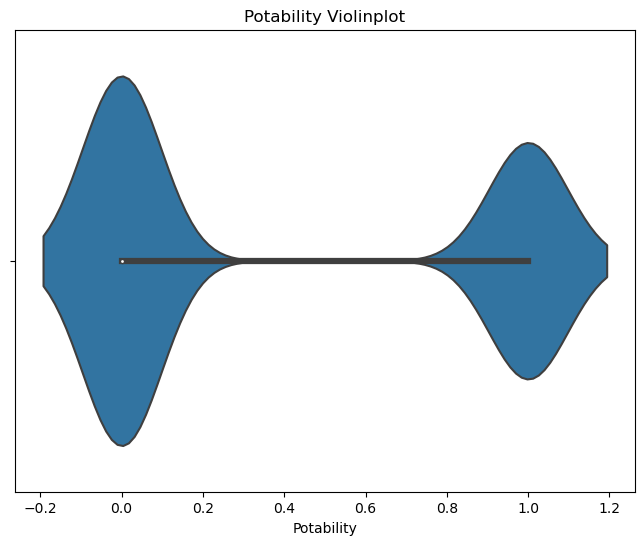

In [26]:
# To visualize the distribution, density, and median value of a dataset, you can use a violin plot.
# A violin plot combines aspects of a box plot and a kernel density plot to provide a comprehensive representation of the data.
# It displays the distribution of the data along with the median value, allowing for a more detailed understanding of the dataset's characteristics.
# Draw violinplot
for var in dataset:
    plt.figure(figsize=(8, 6))
    sns.violinplot(x=var, data=dataset)
    plt.title(f"{var} Violinplot")
    plt.show()

(A violin plot is a statistical visualization tool that is commonly used to display the distribution, density, and median value of a dataset.)

<Figure size 3000x1000 with 0 Axes>

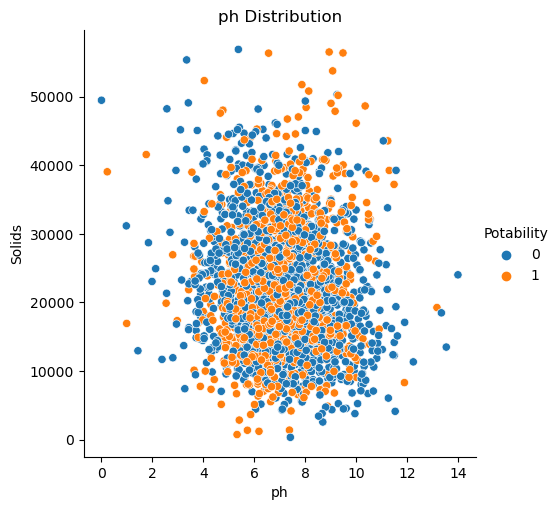

<Figure size 3000x1000 with 0 Axes>

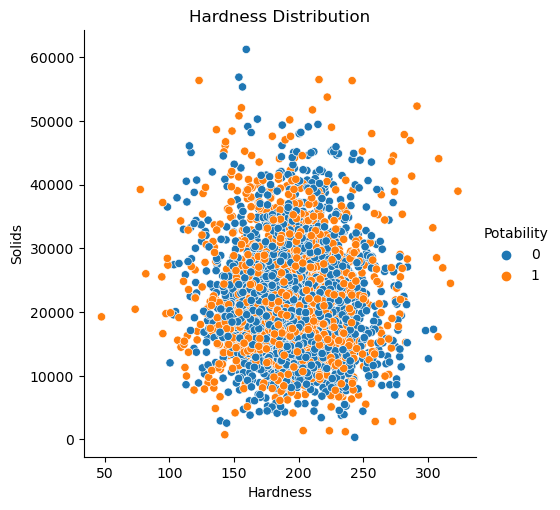

<Figure size 3000x1000 with 0 Axes>

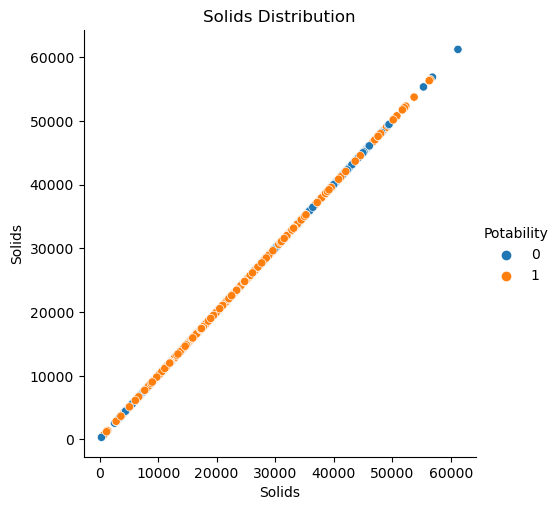

<Figure size 3000x1000 with 0 Axes>

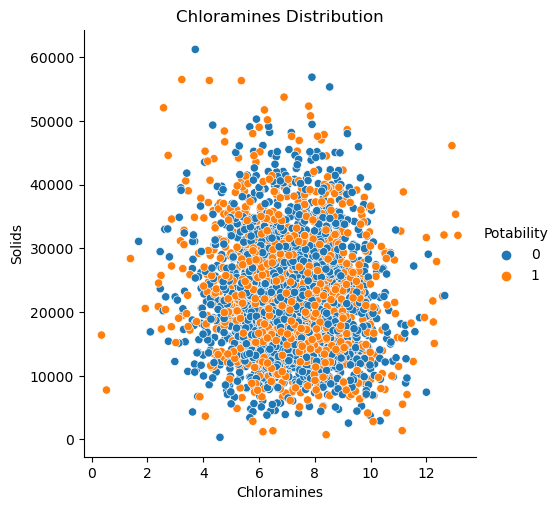

<Figure size 3000x1000 with 0 Axes>

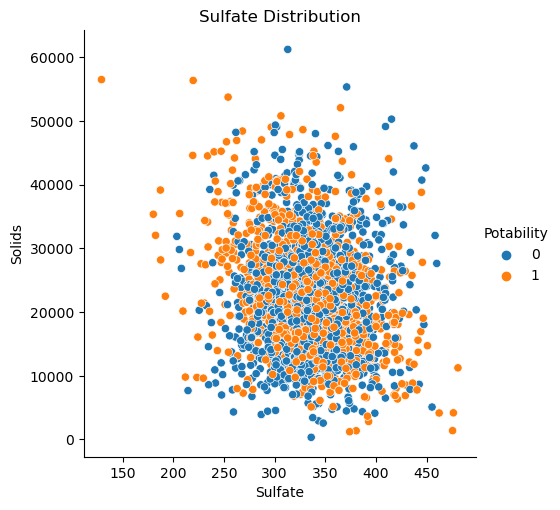

<Figure size 3000x1000 with 0 Axes>

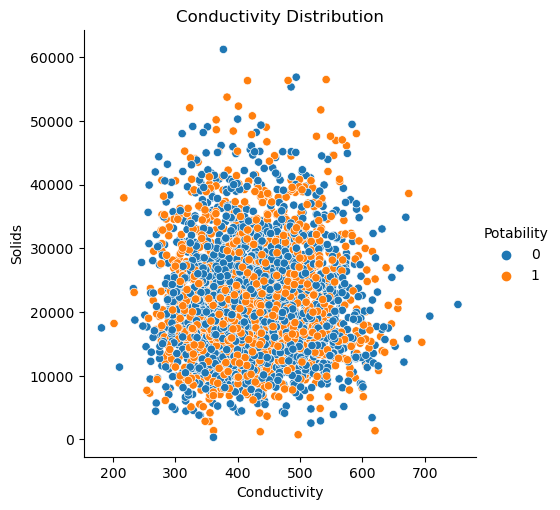

<Figure size 3000x1000 with 0 Axes>

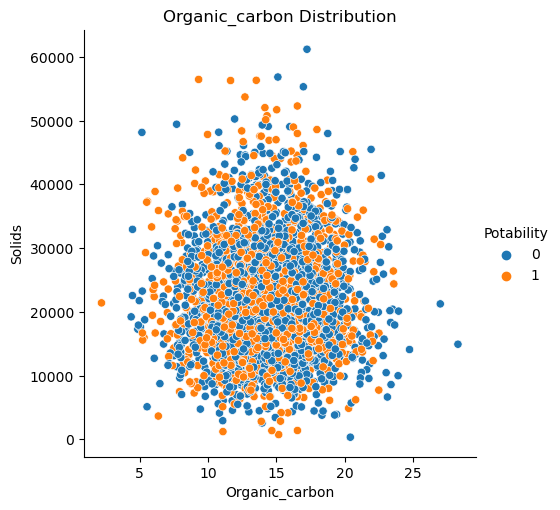

<Figure size 3000x1000 with 0 Axes>

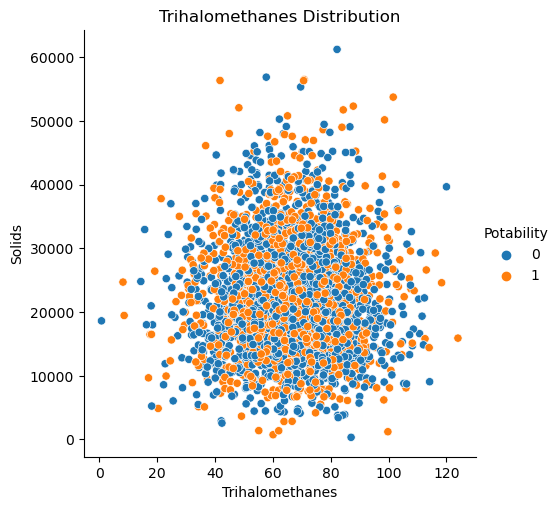

<Figure size 3000x1000 with 0 Axes>

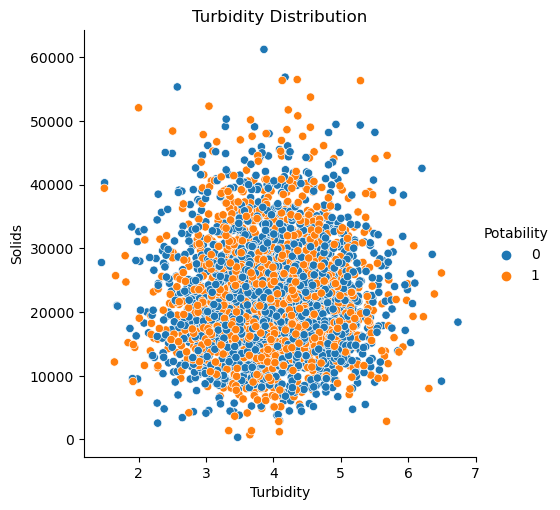

In [27]:
select_X=dataset.iloc[:, :9]
select_Y=dataset.iloc[:, 9]
for var in select_X:
    plt.figure(figsize=(30,10))
    sns.relplot(data=dataset, x=var, y=dataset['Solids'], hue=select_Y)
    plt.title(f"{var} Distribution")
    plt.xlabel(var)
    plt.show()

<Figure size 3000x1000 with 0 Axes>

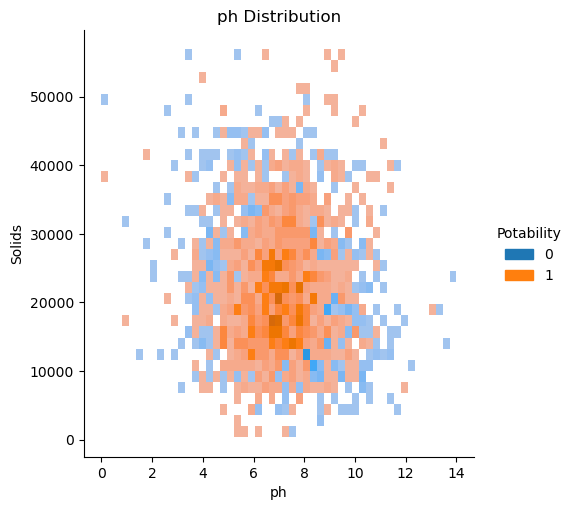

<Figure size 3000x1000 with 0 Axes>

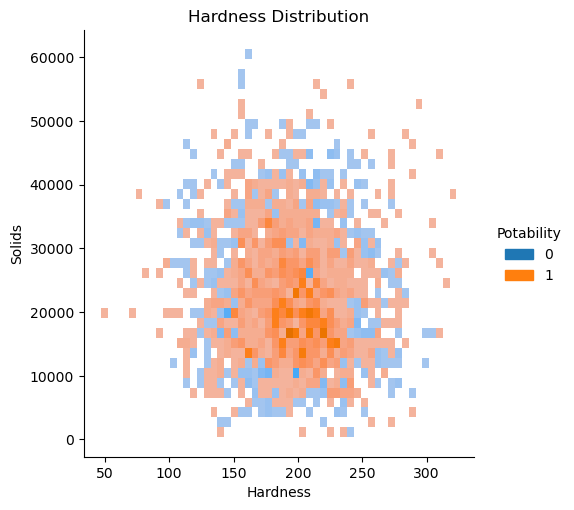

<Figure size 3000x1000 with 0 Axes>

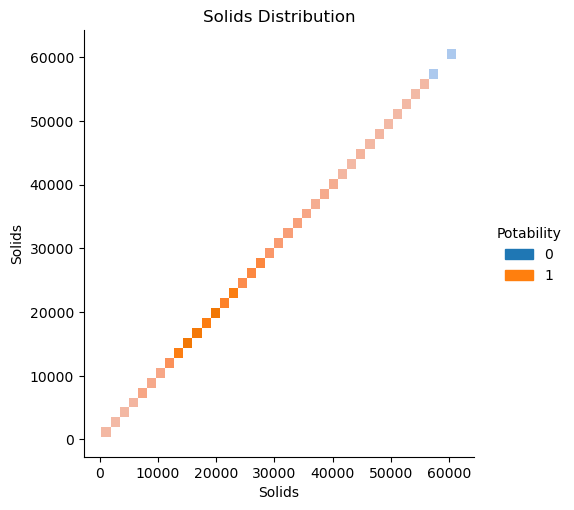

<Figure size 3000x1000 with 0 Axes>

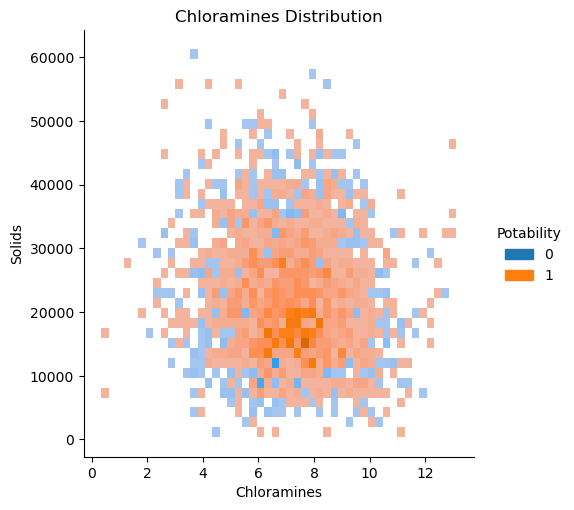

<Figure size 3000x1000 with 0 Axes>

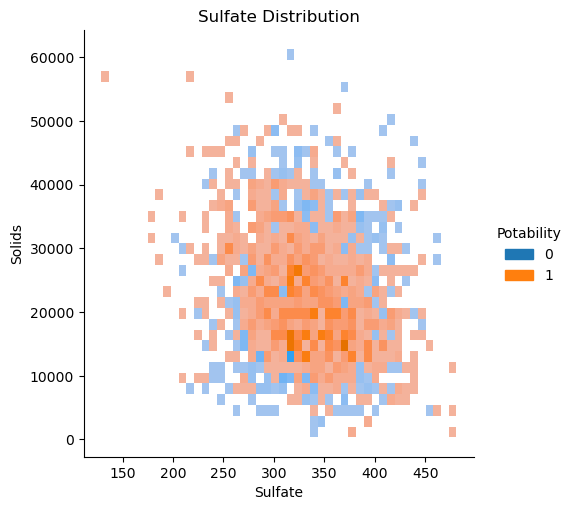

<Figure size 3000x1000 with 0 Axes>

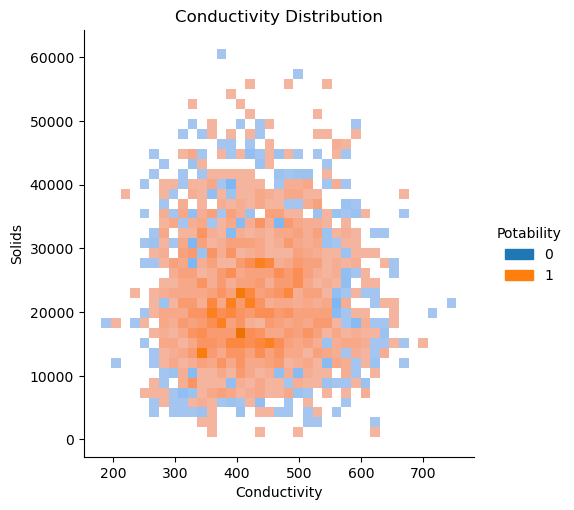

<Figure size 3000x1000 with 0 Axes>

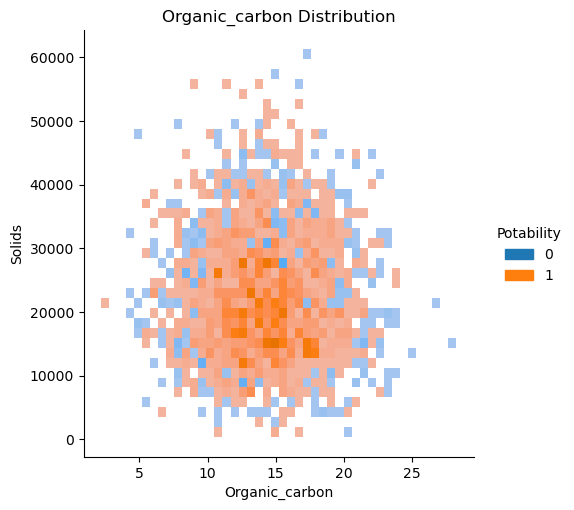

<Figure size 3000x1000 with 0 Axes>

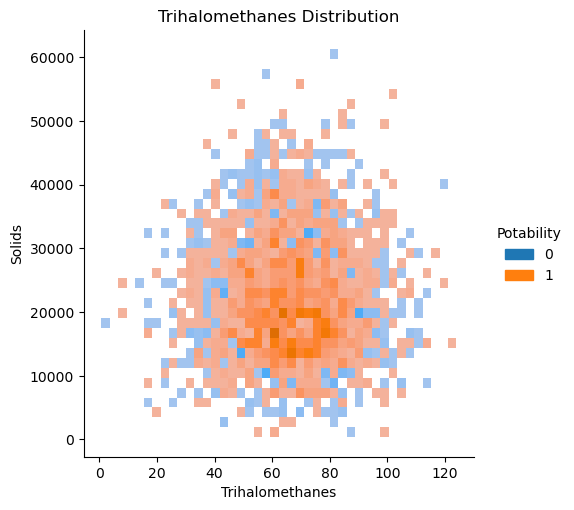

<Figure size 3000x1000 with 0 Axes>

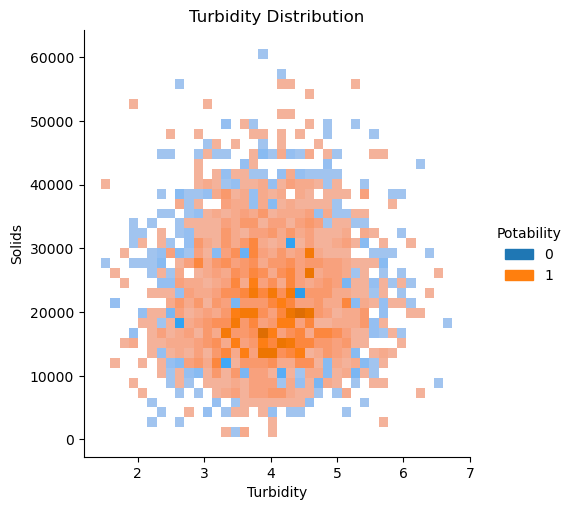

In [28]:
select_X=dataset.iloc[:, :9]
select_Y=dataset.iloc[:, 9]
for var in select_X:
    plt.figure(figsize=(30,10))
    sns.displot(data=dataset, x=var, y=dataset['Solids'], hue=select_Y)
    plt.title(f"{var} Distribution")
    plt.xlabel(var)
    plt.show()

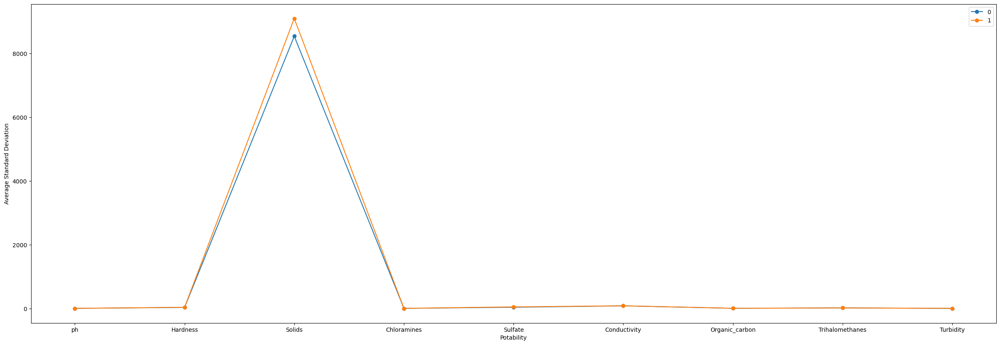

In [29]:
select_X=dataset.iloc[:, :9]
select_Y=dataset.iloc[:, 9]
stdData=dataset.groupby(select_Y).std()
stdValues=stdData.iloc[:, :9]
plt.figure(figsize=(30,10))
plt.plot(select_X.columns, stdValues.T, marker="o")
plt.xlabel('Features')
plt.ylabel('Standard Deviation')
plt.legend(stdValues.index)
plt.xlabel('Potability')
plt.ylabel('Average Standard Deviation')
plt.show()

C:\Users\dogan\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


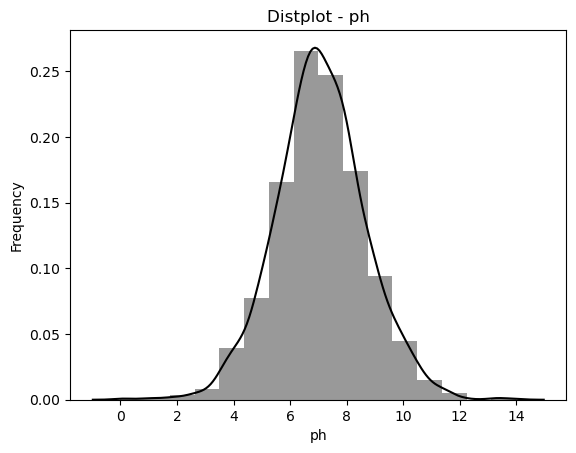

C:\Users\dogan\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


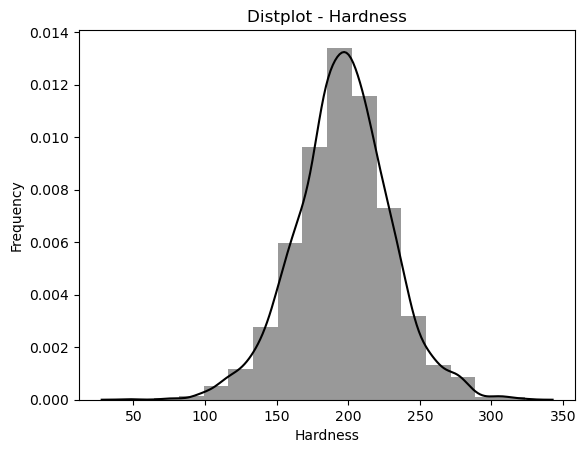

C:\Users\dogan\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


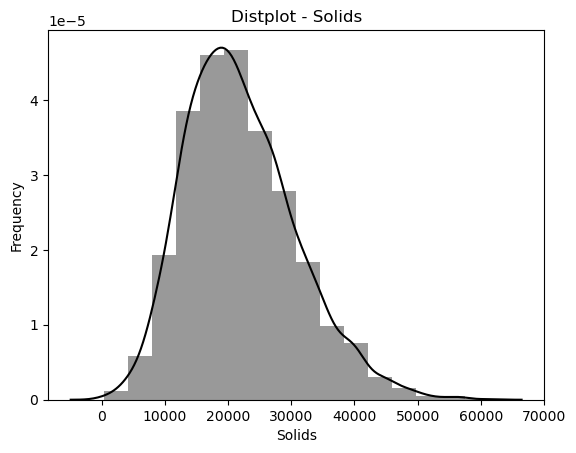

C:\Users\dogan\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


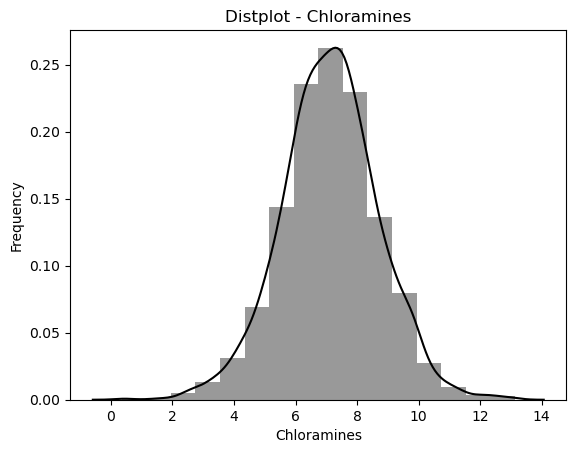

C:\Users\dogan\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


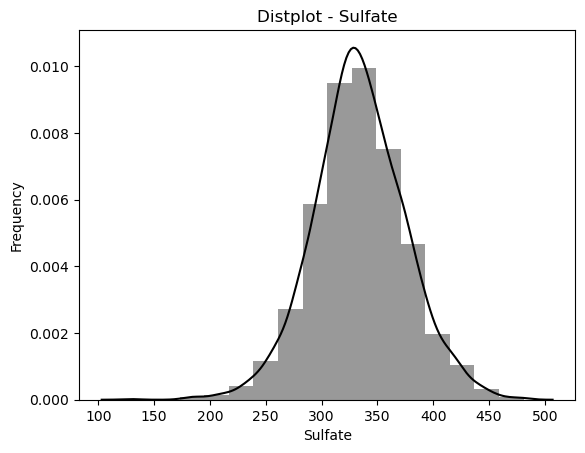

C:\Users\dogan\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


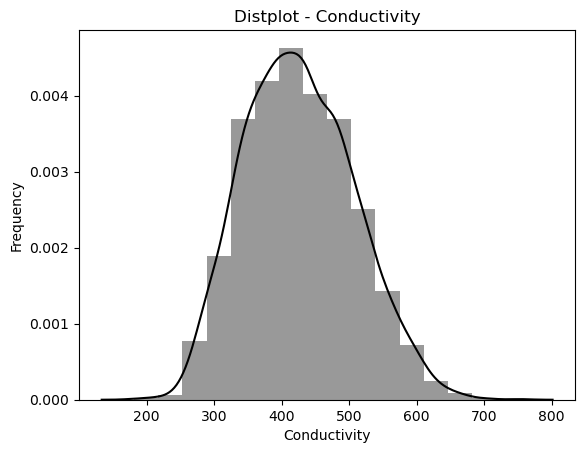

C:\Users\dogan\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


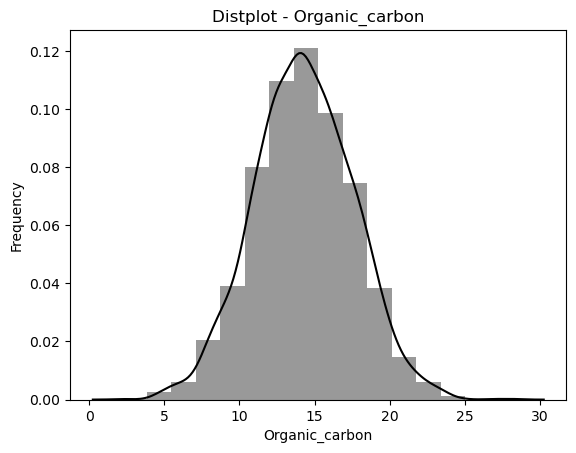

C:\Users\dogan\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


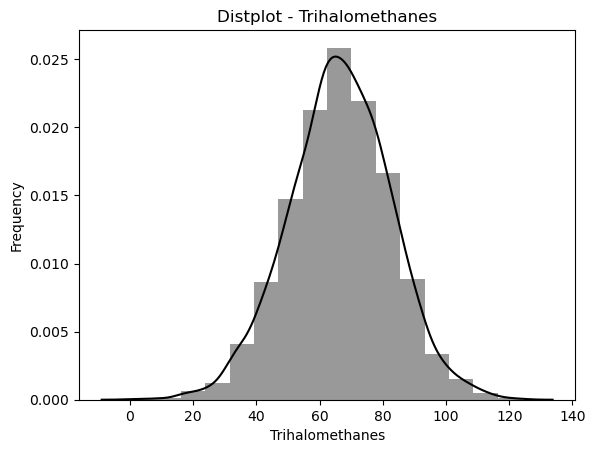

C:\Users\dogan\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


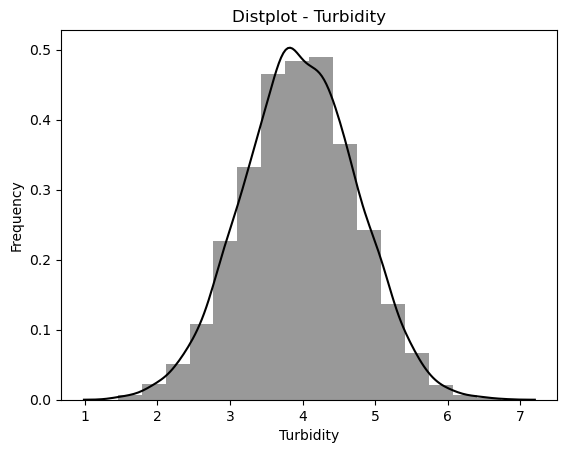

C:\Users\dogan\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


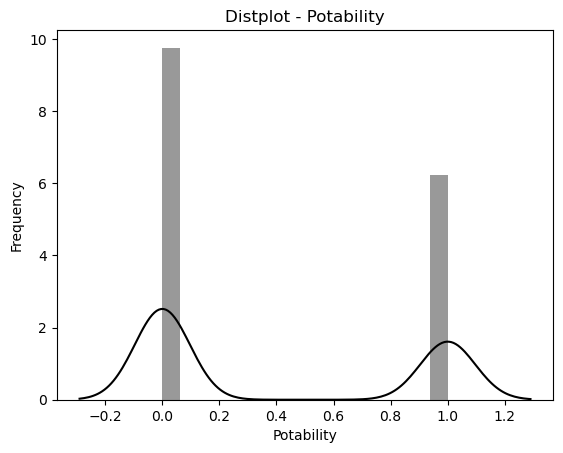

In [30]:
for column in dataset.columns:
    sns.distplot(dataset[column], bins=16, color="black");
    plt.xlabel(column)
    plt.ylabel("Frequency")
    plt.title("Distplot - {}".format(column))
    plt.show()

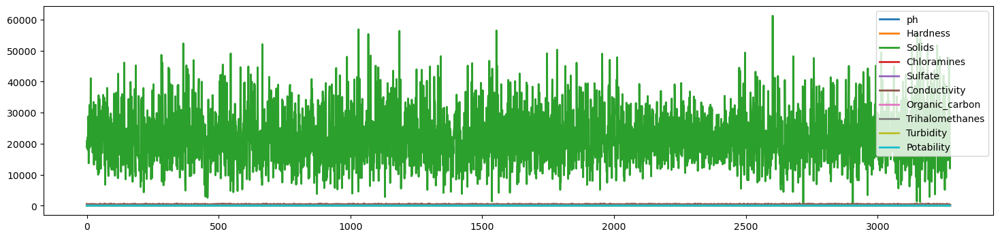

In [31]:
dataset.plot(figsize=(18,4), linewidth=2).legend(loc='upper right')

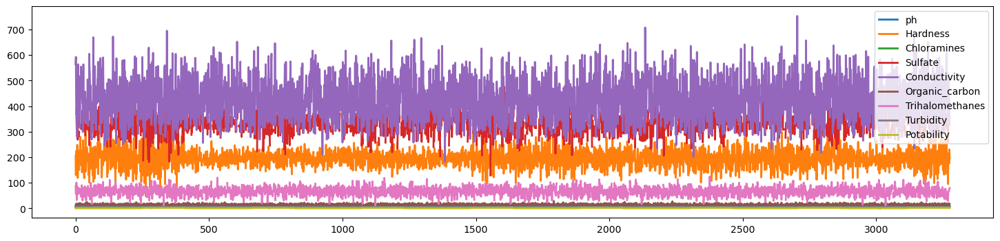

In [32]:
tmp02_dataset=dataset.copy()
tmp02_dataset.drop('Solids', axis=1, inplace=True)
tmp02_dataset.plot(figsize=(18, 4), linewidth=2).legend(loc='upper right')

##  ------------------------------------------> Pre-Processing <------------------------------------------

In [33]:
# Checking for missing values
missing_values_dataset = dataset.isnull().sum()
print(missing_values_dataset)

ph                 491
Hardness             0
Solids               0
Chloramines          0
Sulfate            781
Conductivity         0
Organic_carbon       0
Trihalomethanes    162
Turbidity            0
Potability           0
dtype: int64


In [34]:
pip install missingno

Note: you may need to restart the kernel to use updated packages.


<AxesSubplot:>

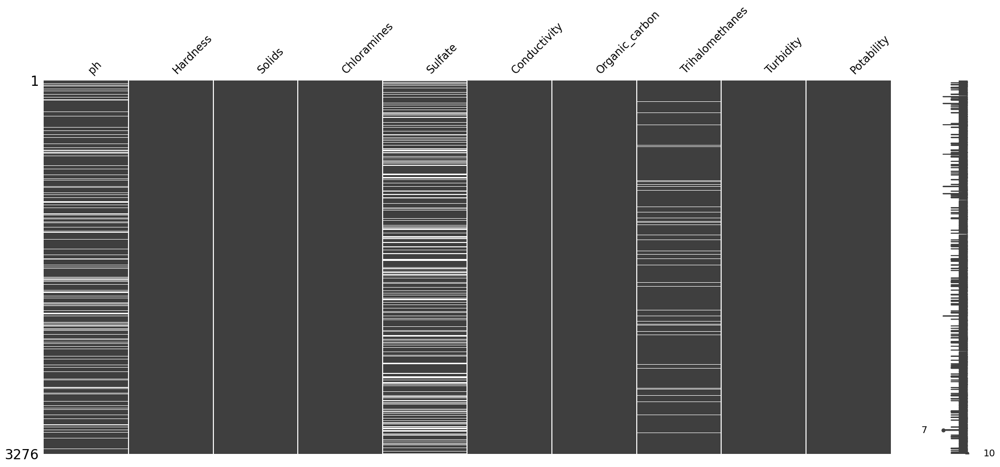

In [35]:
msno.matrix(dataset)

<AxesSubplot:>

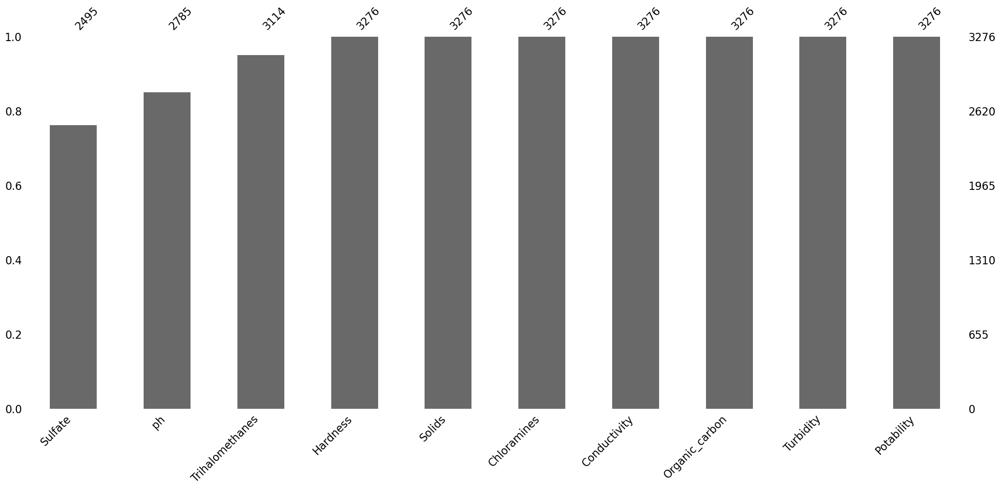

In [36]:
msno.bar(dataset, sort = 'ascending')

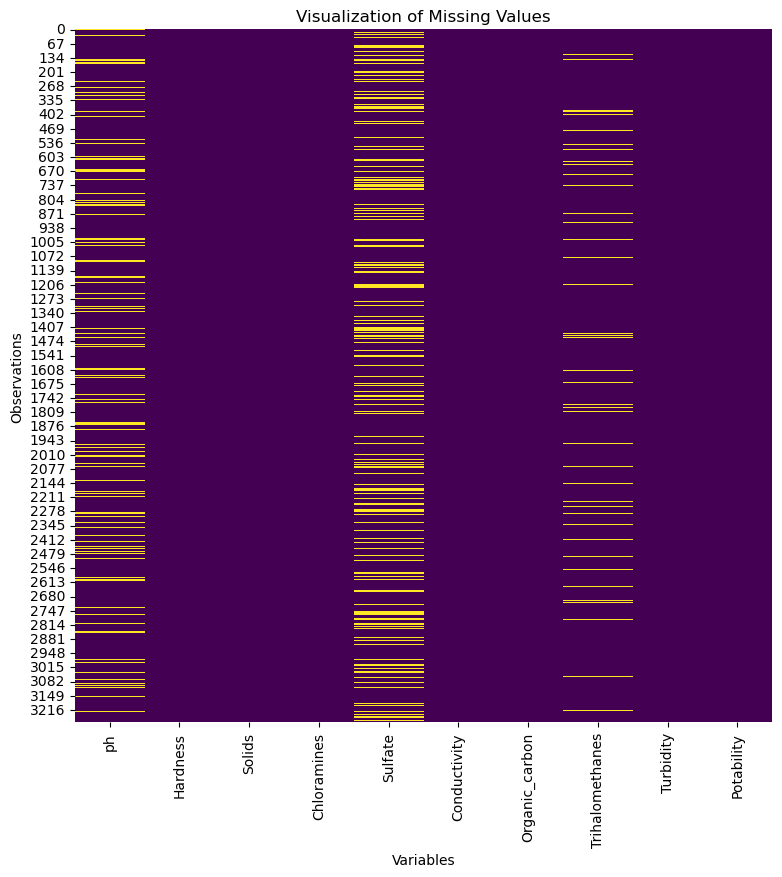

In [37]:
# Visualization of missing values
plt.figure(figsize=(9, 9))
plt.title("Visualization of Missing Values")
sns.heatmap(dataset.isnull(), cmap='viridis', cbar=False)
plt.xlabel("Variables")
plt.ylabel("Observations")
plt.show()

### Missing Values : PH Value
(Scientists measure the hardness of water using various methods, including the pH scale, which quantifies the concentration of hydrogen ions in the liquid. Water with a low pH is considered more acidic, while water with a higher pH is deemed harder or more alkaline due to its ability to neutralize acids.

The pH scale ranges from 1 to 14, with 7 representing neutrality. Substances below 7 are considered acidic, and those above 7 are alkaline. By measuring the pH level, scientists can assess the hardness or alkalinity of water.)

In [38]:
# if Potability = 0 and Hardness <= 150
ph_value_1 = dataset[(dataset['Potability'] == 0) & (dataset['Hardness'] <= 150)][['ph']].mean()
print("PH VALUE : {:.4f}".format(float(ph_value_1)))

# if Potability = 0 and Hardness > 150'
ph_value_2 = dataset[(dataset['Potability'] == 0) & (dataset['Hardness'] > 150)][['ph']].mean()
print("PH VALUE : {:.4f}".format(float(ph_value_2)))

# if Potability = 1 and Hardness <= 150'
ph_value_3 = dataset[(dataset['Potability'] == 0) & (dataset['Hardness'] <= 150)][['ph']].mean()
print("PH VALUE : {:.4f}".format(float(ph_value_3)))

# if Potability = 1 and Hardness > 150'
ph_value_4 = dataset[(dataset['Potability'] == 0) & (dataset['Hardness'] > 150)][['ph']].mean()
print("PH VALUE : {:.4f}".format(float(ph_value_4)))

PH VALUE : 6.7220
PH VALUE : 7.1125
PH VALUE : 6.7220
PH VALUE : 7.1125


In [39]:
for x in range(len(dataset)):
    if pd.isnull(dataset.loc[x, 'ph']):
        if (dataset.loc[x, 'Potability'] == 0) and (dataset.loc[x, 'Hardness'] <= 150):
            dataset.at[x, 'ph'] = ph_value_1
        elif (dataset.loc[x, 'Potability'] == 0) and (dataset.loc[x, 'Hardness'] > 150):
            dataset.at[x, 'ph'] = ph_value_2
        elif (dataset.loc[x, 'Potability'] == 1) and (dataset.loc[x, 'Hardness'] <= 150):
            dataset.at[x, 'ph'] = ph_value_3
        elif (dataset.loc[x, 'Potability'] == 1) and (dataset.loc[x, 'Hardness'] > 150):
            dataset.at[x, 'ph'] = ph_value_4

### Missing Values : Sulfate
(Sulfate is naturally occurring in various sources, including minerals, soil, rocks, and water. Seawater typically contains around 2,700 milligrams per liter (mg/L) of sulfate. In most freshwater supplies, sulfate concentrations range from 3 to 30 mg/L. However, it is important to note that the dataset provided only includes sulfate data ranging from 129 to 481 mg/L.

To address the missing values, we can calculate the mean sulfate concentration separately for the potable (safe for drinking) and non-potable (not safe for drinking) rows. The difference between these two categories is approximately 2 mg/L.)

In [40]:
# if Potability = 0
sulfate_value_1 = dataset[(dataset['Potability'] == 0)][['Sulfate']].mean()
print("Sulfate : {:.4f}".format(float(sulfate_value_1)))

# if Potability = 1
sulfate_value_2 = dataset[(dataset['Potability'] == 1)][['Sulfate']].mean()
print("Sulfate : {:.4f}".format(float(sulfate_value_2)))

Sulfate : 334.5643
Sulfate : 332.5670


In [41]:
for x in range(len(dataset)):
    if pd.isnull(dataset.loc[x, 'Sulfate']):
        if dataset.loc[x, 'Potability'] == 0:
            dataset.at[x, 'Sulfate'] = sulfate_value_1
        else:
            dataset.at[x, 'Sulfate'] = sulfate_value_2

### Missing Values : Trihalomethanes
(Trihalomethanes (THMs) are chemicals that can be present in water treated with chlorine. The concentration of THMs in drinking water can vary depending on several factors, including the level of organic material in the water, the amount of chlorine used for treatment, and the water temperature during treatment.

It is important to note that the dataset does not provide specific information regarding the THM concentrations. However, it is generally considered safe for drinking water to have THM levels up to 80 parts per million (ppm).)

In [42]:
dataset['Trihalomethanes'].fillna(value = dataset['Trihalomethanes'].mean(), inplace = True)

<AxesSubplot:>

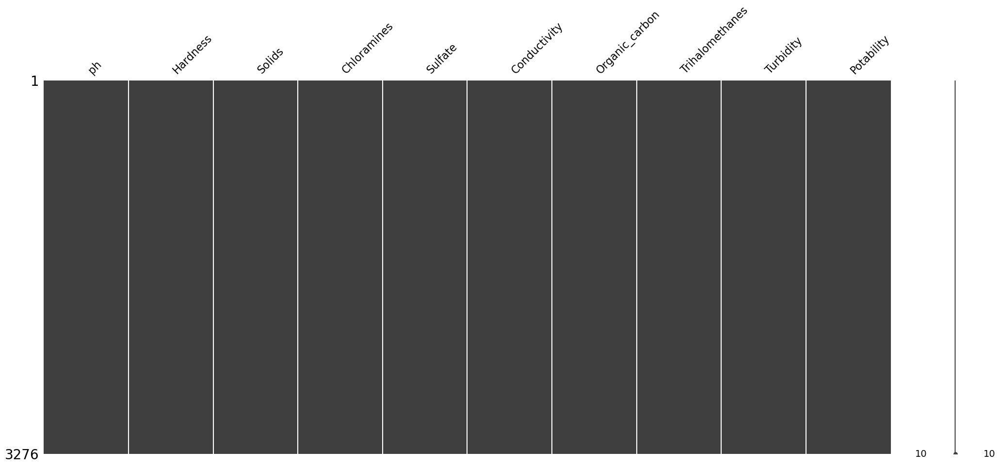

In [43]:
msno.matrix(dataset)

<AxesSubplot:>

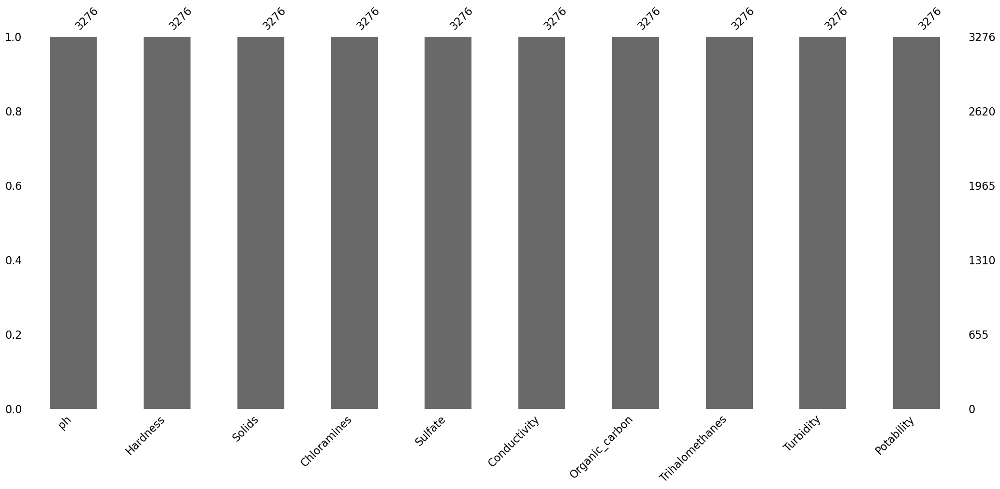

In [44]:
msno.bar(dataset, sort='ascending')

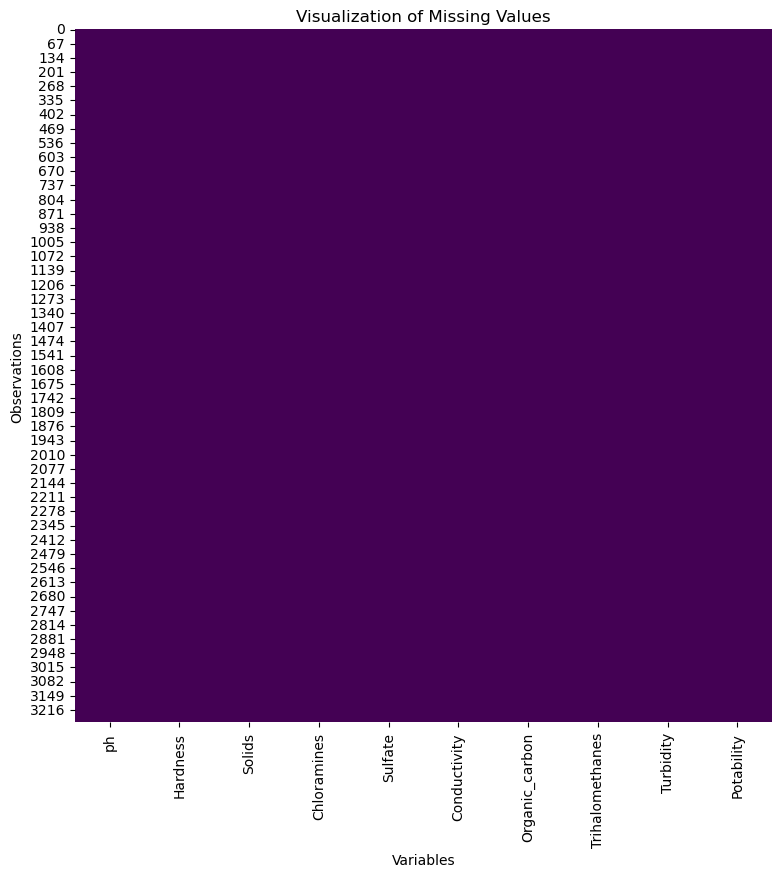

In [45]:
# Visualization of missing values
plt.figure(figsize=(9, 9))
plt.title("Visualization of Missing Values")
sns.heatmap(dataset.isnull(), cmap='viridis', cbar=False)
plt.xlabel("Variables")
plt.ylabel("Observations")
plt.show()

In [46]:
# Detecting duplicate rows
duplicated_rows = dataset.duplicated()
duplicated_count = duplicated_rows.sum()

print("Total Duplicate Rows:", duplicated_count)
dataset.duplicated(subset=None, keep='first')

Total Duplicate Rows: 0


0       False
1       False
2       False
3       False
4       False
        ...  
3271    False
3272    False
3273    False
3274    False
3275    False
Length: 3276, dtype: bool

In [47]:
# Remove duplicate rows
dataset = dataset.drop_duplicates()

(The duplicated() function in pandas is used to identify and mark duplicate values in a Dataset. It returns a boolean Series that indicates whether each row is a duplicate or not.
The duplicated() function is useful for identifying and handling duplicate values in a dataset, such as removing duplicates or performing further analysis on the unique values.)

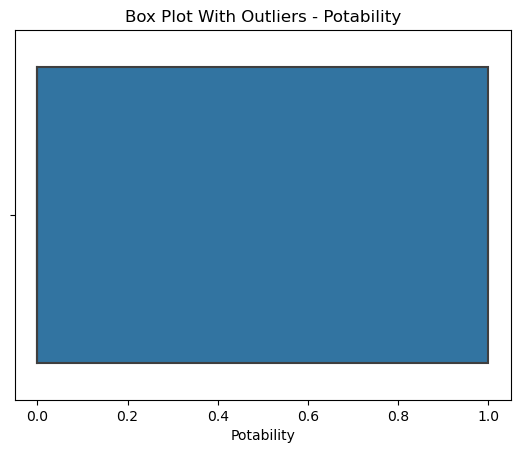

In [48]:
sns.boxplot(x=dataset['Potability'])
plt.title("Box Plot With Outliers - Potability")
plt.show()

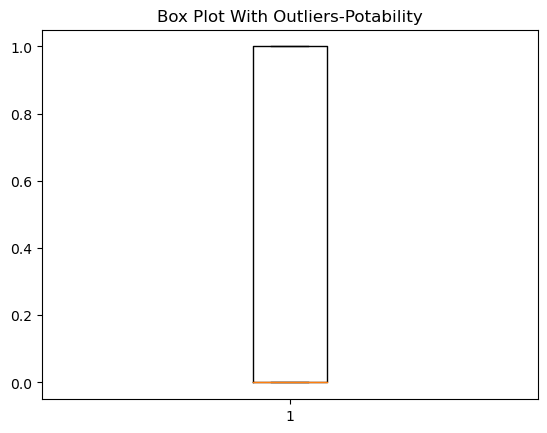

In [49]:
# Create a box plot to visualize outliers for Potability
plt.boxplot(dataset.Potability)
plt.title("Box Plot With Outliers-Potability")
plt.show()

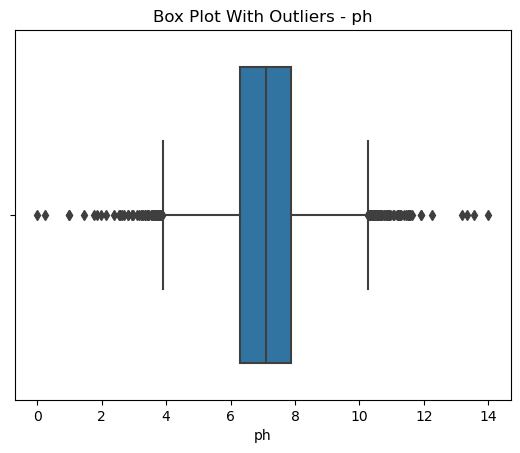

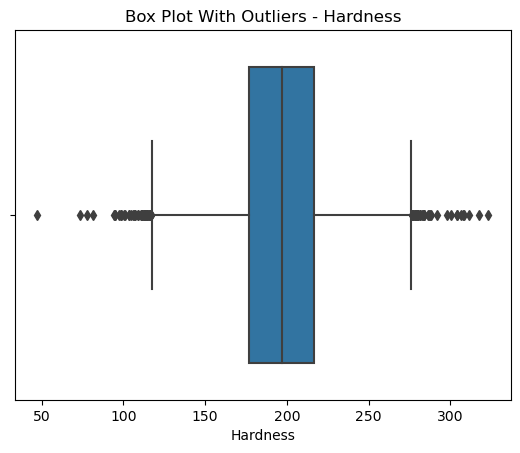

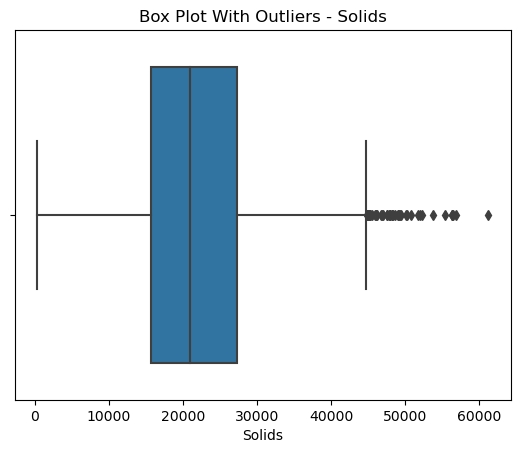

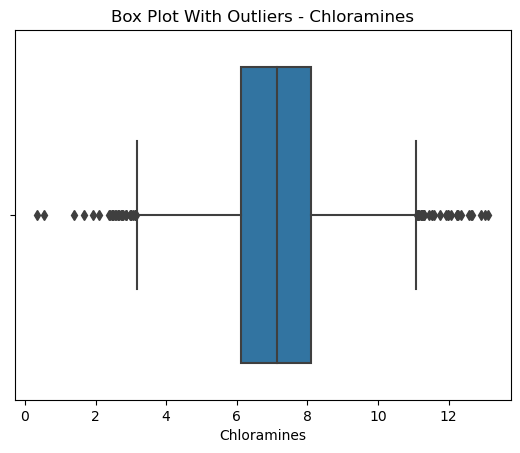

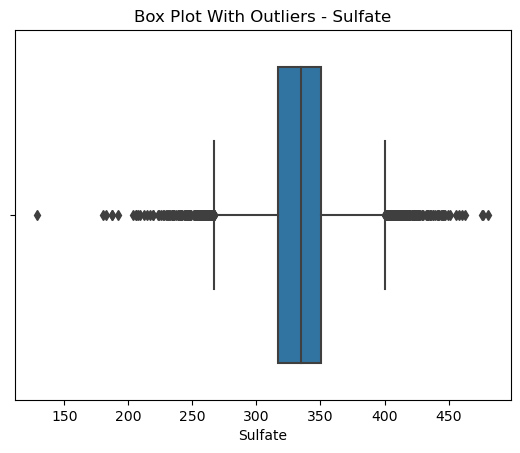

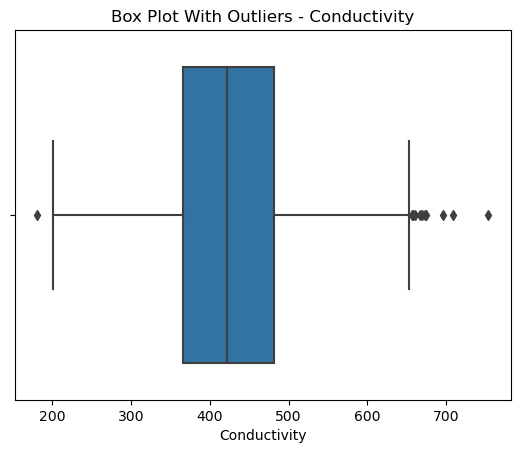

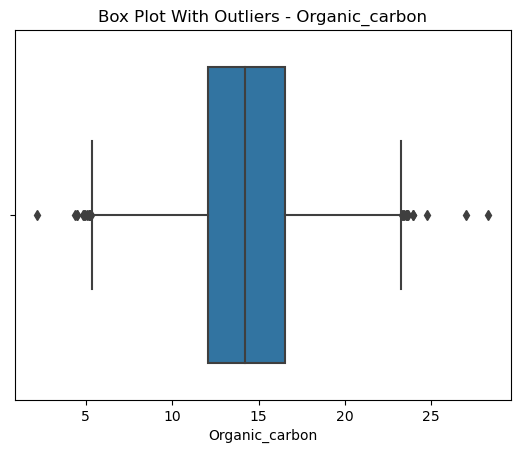

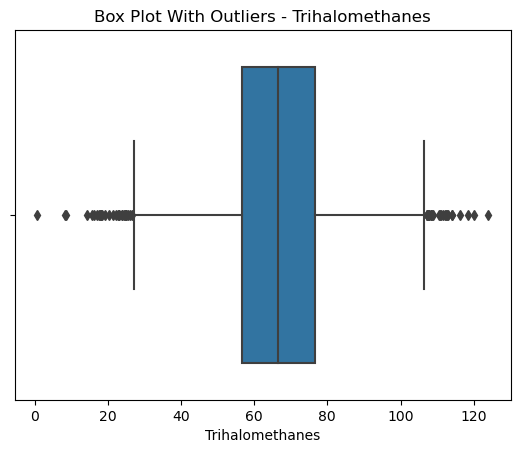

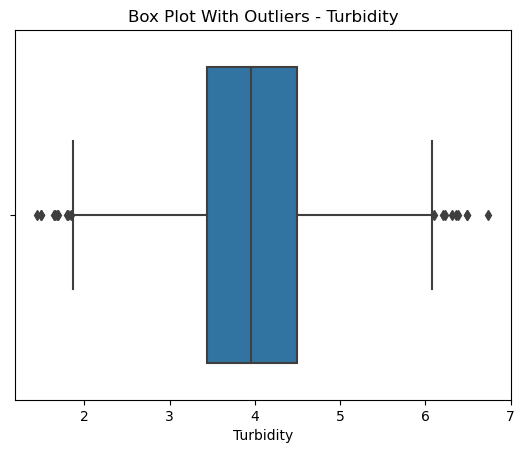

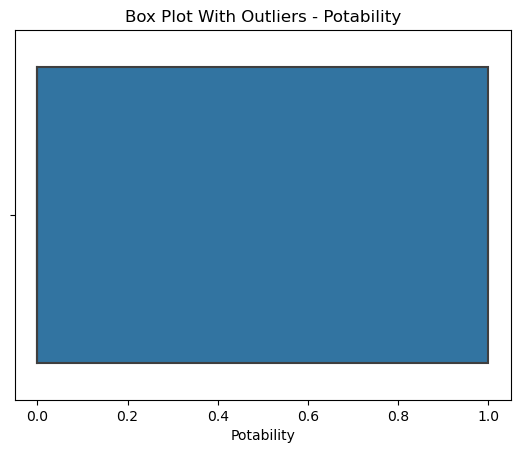

In [50]:
# Draw box plot for each column separately
for column in dataset.columns:
    sns.boxplot(x=dataset[column])
    plt.title("Box Plot With Outliers - "+column)
    plt.show()

(In order to handle categorical variables in our dataset, we can apply encoding techniques to convert them into numerical representations. There are several methods available for encoding, such as one-hot encoding or label encoding.

One-hot encoding creates binary columns for each unique category, representing the presence or absence of that category in each observation. Label encoding, on the other hand, assigns a numeric label to each unique category.

However, in the current dataset, there is no need to perform any encoding because the variables are already in numeric format and do not contain categorical data. Therefore, there is no requirement for applying encoding techniques in this particular dataset.)

## ------------------------------------------> Correlation <------------------------------------------
(Heatmaps are a popular visualization method for displaying the correlation matrix, which depicts the relationships between variables using a color scale. Darker colors represent higher positive correlations, while lighter colors indicate higher negative correlations.)

In [51]:
data_corr=dataset.corr()
data_corr

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
ph,1.000000,0.081670,-0.081452,-0.032146,0.014866,0.016456,0.039502,0.003717,-0.036686,-0.003909
Hardness,0.081670,1.000000,-0.046899,-0.030054,-0.092718,-0.023915,0.003610,-0.012690,-0.014449,-0.013837
Solids,-0.081452,-0.046899,1.000000,-0.070148,-0.149809,0.013831,0.010242,-0.008875,0.019546,0.033743
Chloramines,-0.032146,-0.030054,-0.070148,1.000000,0.023490,-0.020486,-0.012653,0.016627,0.002363,0.023779
Sulfate,0.014866,-0.092718,-0.149809,0.023490,1.000000,-0.014196,0.027403,-0.025759,-0.009523,-0.026957
Conductivity,0.016456,-0.023915,0.013831,-0.020486,-0.014196,1.000000,0.020966,0.001255,0.005798,-0.008128
Organic_carbon,0.039502,0.003610,0.010242,-0.012653,0.027403,0.020966,1.000000,-0.012976,-0.027308,-0.030001
Trihalomethanes,0.003717,-0.012690,-0.008875,0.016627,-0.025759,0.001255,-0.012976,1.000000,-0.021502,0.006960
Turbidity,-0.036686,-0.014449,0.019546,0.002363,-0.009523,0.005798,-0.027308,-0.021502,1.000000,0.001581
Potability,-0.003909,-0.013837,0.033743,0.023779,-0.026957,-0.008128,-0.030001,0.006960,0.001581,1.000000


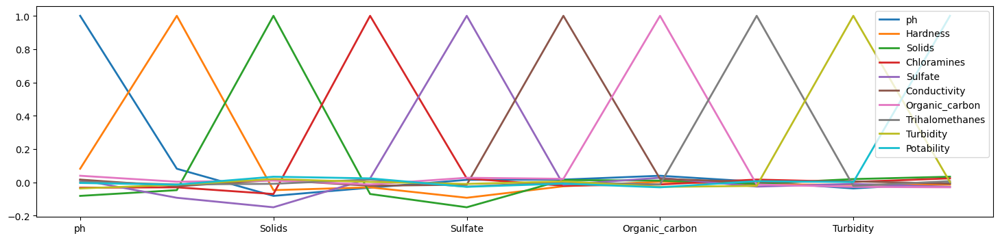

In [52]:
data_corr.plot(figsize=(18,4), linewidth=2).legend(loc='upper right')

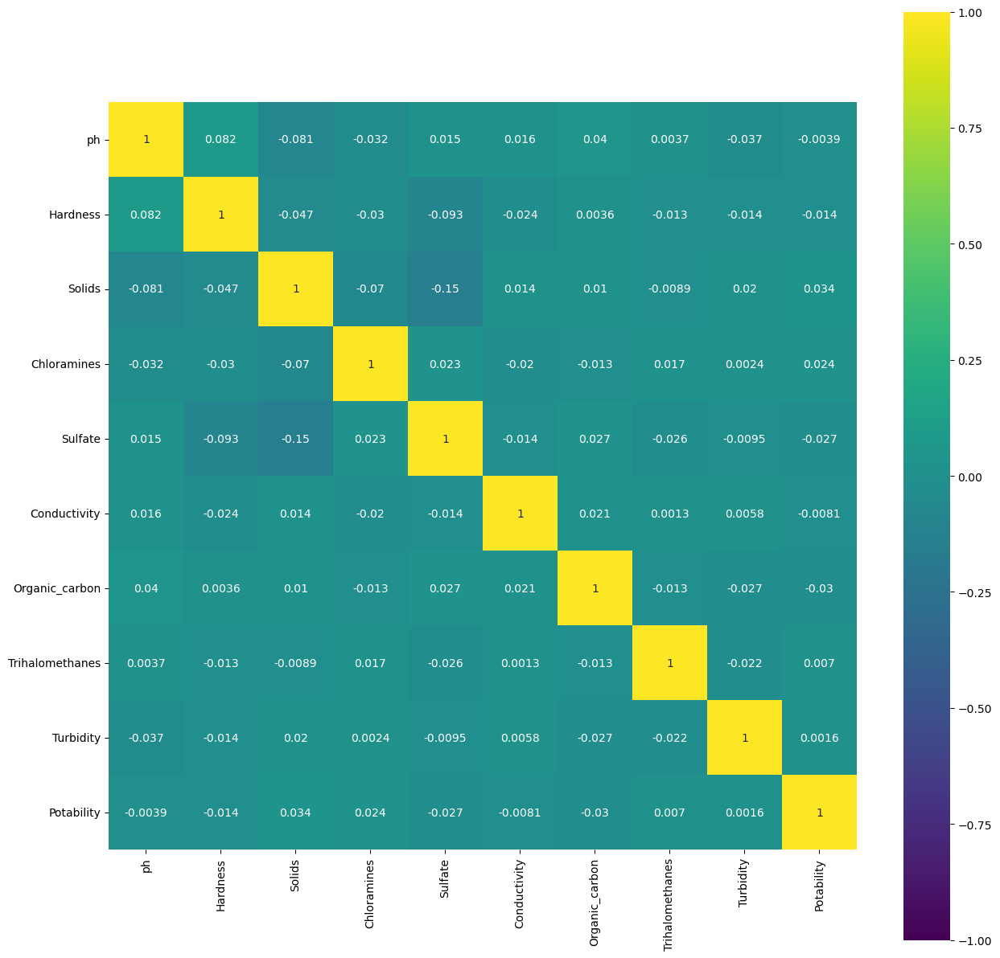

In [53]:
# Set the figure size
plt.figure(figsize = (15, 15))

# Calculate the Pearson correlation coefficients
correlation_matrix = dataset.corr(method='pearson')

# Create the heatmap
sns.heatmap(correlation_matrix, vmin=-1, vmax=1, cmap='viridis', annot=True, square=True)

# Show the plot
plt.show()

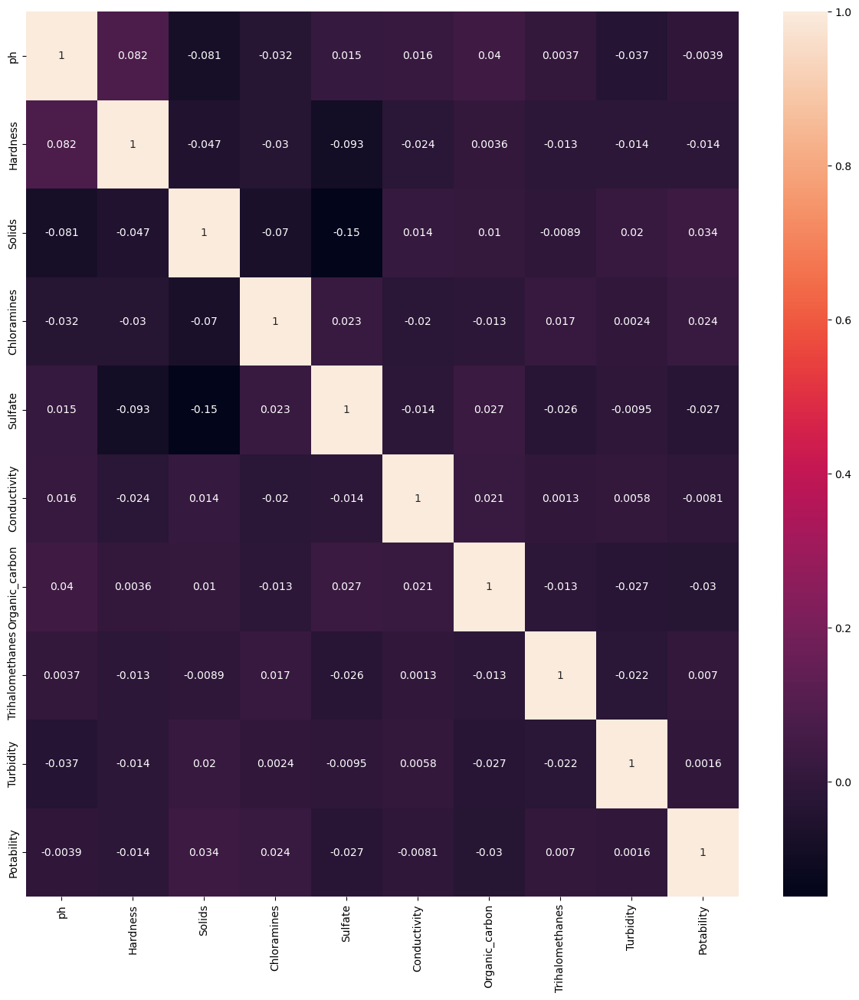

In [54]:
plt.figure(figsize = (15,15))
sns.heatmap(data_corr, annot=True)
plt.show()

##  -----------------------------------------> Machine Learning Algorithms <-----------------------------------------

In [55]:
X=dataset.iloc[:, :9]
# Independent variables
y=dataset.iloc[:, 9]
# Target variable (Potability)

In [56]:
print(y)

0       0
1       0
2       0
3       0
4       0
       ..
3271    1
3272    1
3273    1
3274    1
3275    1
Name: Potability, Length: 3276, dtype: int64


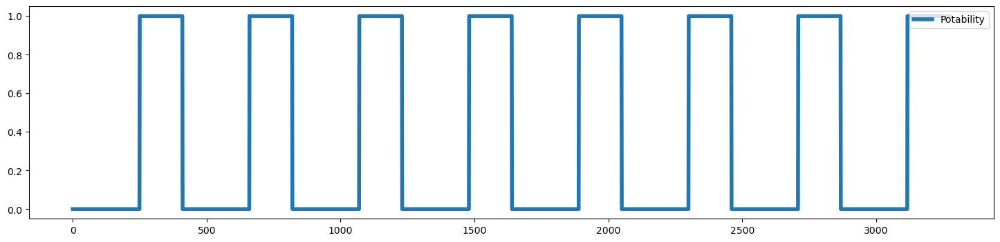

In [57]:
y.plot(figsize=(18,4), linewidth=4).legend(loc='upper right')

In [58]:
X.corr()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity
ph,1.000000,0.081670,-0.081452,-0.032146,0.014866,0.016456,0.039502,0.003717,-0.036686
Hardness,0.081670,1.000000,-0.046899,-0.030054,-0.092718,-0.023915,0.003610,-0.012690,-0.014449
Solids,-0.081452,-0.046899,1.000000,-0.070148,-0.149809,0.013831,0.010242,-0.008875,0.019546
Chloramines,-0.032146,-0.030054,-0.070148,1.000000,0.023490,-0.020486,-0.012653,0.016627,0.002363
Sulfate,0.014866,-0.092718,-0.149809,0.023490,1.000000,-0.014196,0.027403,-0.025759,-0.009523
Conductivity,0.016456,-0.023915,0.013831,-0.020486,-0.014196,1.000000,0.020966,0.001255,0.005798
Organic_carbon,0.039502,0.003610,0.010242,-0.012653,0.027403,0.020966,1.000000,-0.012976,-0.027308
Trihalomethanes,0.003717,-0.012690,-0.008875,0.016627,-0.025759,0.001255,-0.012976,1.000000,-0.021502
Turbidity,-0.036686,-0.014449,0.019546,0.002363,-0.009523,0.005798,-0.027308,-0.021502,1.000000


## ------------------------------------------> Linear Regression <------------------------------------------
(Linear regression is a statistical modeling technique that examines the linear relationship between a dependent variable and one or more independent variables. It is a machine learning algorithm commonly used for estimating the dependent variable based on a given set of independent variables. By fitting a linear equation to the observed data, linear regression enables the prediction or estimation of the dependent variable using the values of the independent variables. It is widely employed in various fields to analyze and understand the relationship between variables and make predictions based on that relationship.)

In [59]:
# Splitting the dataset into the Training set and Test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

In [60]:
# Fitting Simple Linear Regression for the Training set
linearRegression = LinearRegression()
linearRegression.fit(X_train, y_train)

LinearRegression()

In [61]:
print("Linear Regression Score: ", linearRegression.score(X_train, y_train))

Linear Regression Score:  0.0034230363669439656


In [62]:
# Obtaining the coefficients of the Linear Regression model
linearRegression.coef_

array([-2.35918065e-03, -2.46902475e-04,  1.95581299e-06,  5.15335103e-03,
       -2.81303728e-04, -1.66453402e-05, -3.98310454e-03,  3.54871669e-04,
       -3.93534160e-03])

In [63]:
coefficientDataframe=pd.DataFrame(linearRegression.coef_, X.columns, columns=['Coefficient'])
coefficientDataframe.sort_values(by="Coefficient")

,Coefficient
Organic_carbon,-0.003983
Turbidity,-0.003935
ph,-0.002359
Sulfate,-0.000281
Hardness,-0.000247
Conductivity,-0.000017
Solids,0.000002
Trihalomethanes,0.000355
Chloramines,0.005153


In [64]:
# Making predictions on the training dataset
y_train_pred=linearRegression.predict(X_train)

# Making predictions on the test dataset
y_test_pred=linearRegression.predict(X_test)

# Calculating training and test error values
train_error=y_train-y_train_pred
test_error=y_test-y_test_pred

(The given code snippet performs the following steps:
1. Predictions are made on the training dataset (`X_train`) using the trained linear regression model (`linearRegression`). The predicted values are assigned to the variable `y_train_pred`.
2. Predictions are made on the test dataset (`X_test`) using the same linear regression model. The predicted values are assigned to the variable `y_test_pred`.
3. The training error is calculated by subtracting the predicted values (`y_train_pred`) from the actual values (`y_train`). The resulting error values are stored in the variable `train_error`.
4. Similarly, the test error is calculated by subtracting the predicted values (`y_test_pred`) from the actual values (`y_test`). The test error values are stored in the variable `test_error`.
In summary, the code computes the predicted values for the dependent variable based on the independent variables for both the training and test datasets. It then calculates the error values by comparing the predicted values with the actual values for evaluation purposes.)

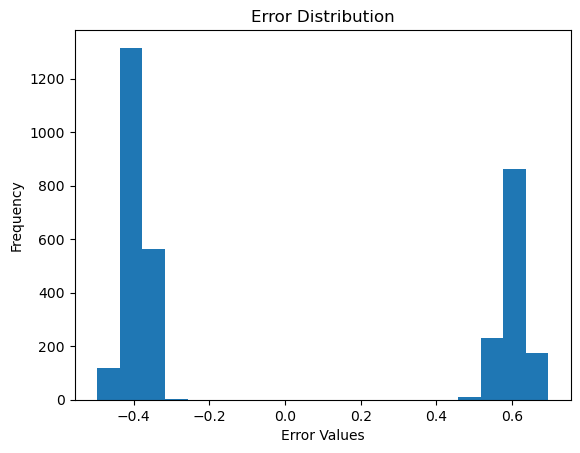

In [65]:
# Combining training and test error values
all_errors=pd.concat([train_error, test_error])

# Visualizing the error distribution with a histogram
plt.hist(all_errors, bins=20)
plt.xlabel("Error Values")
plt.ylabel("Frequency")
plt.title("Error Distribution")
plt.show()

(In the given code, the training and test error values (`train_error` and `test_error`) are combined into a single DataFrame called `all_errors` using the `pd.concat()` function. This allows for a comprehensive analysis of the error distribution across both datasets.
Next, the error distribution is visualized using a histogram. The `plt.hist()` function is used to create the histogram, with `all_errors` as the input data and `bins=20` specifying the number of bins or intervals to divide the data. 
Additional plotting functions (`plt.xlabel()`, `plt.ylabel()`, `plt.title()`) are used to set the labels and title for the plot, providing clarity and context to the visualization.
Finally, `plt.show()` is called to display the histogram plot.
The histogram allows for a visual assessment of the frequency or count of error values within each bin, enabling an understanding of the error distribution and potential patterns or outliers. This can provide insights into the performance and accuracy of the predictive model.)

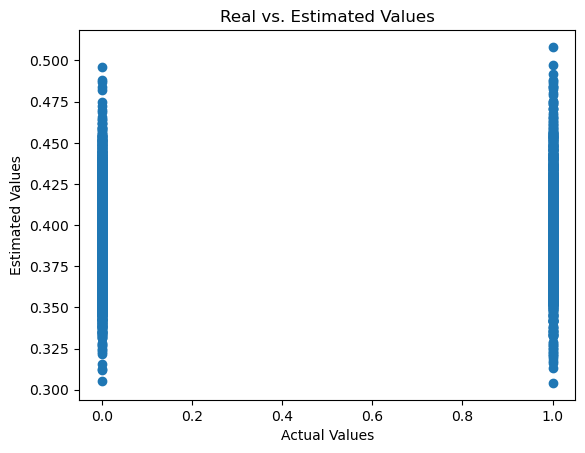

In [66]:
# Combining actual and predicted values
y_combined=np.concatenate([y_train, y_test])
y_pred_combined=np.concatenate([y_train_pred, y_test_pred])

# Comparing actual and predicted values
plt.scatter(y_combined, y_pred_combined)
plt.xlabel("Actual Values")
plt.ylabel("Estimated Values")
plt.title("Real vs. Estimated Values")
plt.show()

(In the given code, the actual values of the dependent variable from both the training and test datasets (`y_train` and `y_test`) are combined into a single array called `y_combined` using the `np.concatenate()` function. Similarly, the predicted values of the dependent variable from both datasets (`y_train_pred` and `y_test_pred`) are combined into `y_pred_combined`.
A scatter plot is then created using `plt.scatter()` to visualize the relationship between the actual values and the estimated values. The `y_combined` array represents the actual values, while the `y_pred_combined` array represents the estimated values.
The `plt.xlabel()`, `plt.ylabel()`, and `plt.title()` functions are used to set the labels for the x-axis, y-axis, and the title of the plot, respectively. This provides clear and informative labeling for the scatter plot.
Finally, `plt.show()` is called to display the scatter plot, allowing for a visual comparison between the actual values and the estimated values. This plot can help assess the accuracy and performance of the linear regression model by examining how closely the estimated values align with the actual values.)

In [67]:
# Calculating error metrics
maerror=mean_absolute_error(y_test, y_test_pred)
mserror=mean_squared_error(y_test, y_test_pred)
r2=r2_score(y_test, y_test_pred)

print("Mean Absolute Error (MAE):", maerror)
print("Mean Squared Error (MSE):", mserror)
print("R^2 Score:", r2)

Mean Absolute Error (MAE): 0.4715224914622844
Mean Squared Error (MSE): 0.23359155716058233
R^2 Score: 5.116641874547412e-05


In the provided code, the following metrics are calculated to evaluate the performance of the linear regression model:
- `mean_absolute_error(y_test, y_test_pred)`: This function computes the mean absolute error (MAE) by taking the absolute difference between the actual values (`y_test`) and the predicted values (`y_test_pred`) for the test dataset.
- `mean_squared_error(y_test, y_test_pred)`: This function calculates the mean squared error (MSE) by computing the squared difference between the actual values (`y_test`) and the predicted values (`y_test_pred`) for the test dataset, and then taking the average.
- `r2_score(y_test, y_test_pred)`: This function calculates the R-squared score, also known as the coefficient of determination, which measures the proportion of the variance in the dependent variable (`y_test`) that can be explained by the independent variables (`y_test_pred`). It provides an indication of how well the linear regression model fits the data.
The computed metrics are then printed using `print()` statements, displaying the MAE, MSE, and R-squared score for the model's predictions on the test dataset.

### Linear Regression with Standard deviations

In [68]:
standard_scaler_X=StandardScaler()
X_train=standard_scaler_X.fit_transform(X_train)
X_test=standard_scaler_X.transform(X_test)

# Fitting Simple Linear Regression for the Training set
linearRegression=LinearRegression()
linearRegression.fit(X_train, y_train)

print("Linear Regression Score with Standard Scaler: ", linearRegression.score(X_train, y_train))

Linear Regression Score with Standard Scaler:  0.0034230363669439656


### Linear Regression with Polinomiyal Regression

In [69]:
# Polinomiyal Regression
polynomial_features=PolynomialFeatures(degree=2)
X_polynomial_features_train=polynomial_features.fit_transform(X_train)
linearRegression.fit(X_polynomial_features_train, y_train)
print("Linear Regression Score with Polinomiyal Regresyon: ", linearRegression.score(X_polynomial_features_train, y_train))

Linear Regression Score with Polinomiyal Regresyon:  0.11794309032068984


## ------------------------------------------> Cross Validate <------------------------------------------
(Cross-validation is a technique employed to assess and evaluate the performance of a model.)

In [70]:
result=cross_validate(linearRegression, X, y, cv=10, scoring="neg_mean_absolute_error", return_train_score=True)
print(result["test_score"])
print(result["train_score"])

[-0.44923136 -0.45199066 -0.49691725 -0.49728141 -0.49430072 -0.45175833
 -0.45374436 -0.49961271 -0.49731337 -0.49672855]
[-0.48145367 -0.48036006 -0.46896078 -0.46900845 -0.46963679 -0.4809636
 -0.4800053  -0.46826489 -0.46883734 -0.46910379]


In [71]:
result

{'fit_time': array([0.00447965, 0.00200963, 0.00199986, 0.00099993, 0.00199914,
        0.00200129, 0.00199866, 0.0010004 , 0.0009985 , 0.00099969]),
 'score_time': array([0.00100303, 0.00100422, 0.0010004 , 0.00099969, 0.        ,
        0.00099993, 0.00099993, 0.00100112, 0.0010004 , 0.00099993]),
 'test_score': array([-0.44923136, -0.45199066, -0.49691725, -0.49728141, -0.49430072,
        -0.45175833, -0.45374436, -0.49961271, -0.49731337, -0.49672855]),
 'train_score': array([-0.48145367, -0.48036006, -0.46896078, -0.46900845, -0.46963679,
        -0.4809636 , -0.4800053 , -0.46826489, -0.46883734, -0.46910379])}

In [72]:
# r-Square error
result1=cross_validate(linearRegression, X, y, cv=10, scoring="r2", return_train_score=True)
print(result1["test_score"])
print(result1["train_score"])

[-0.14870088 -0.13268259 -0.05013749 -0.05036406 -0.04076338 -0.16369954
 -0.13784013 -0.06656866 -0.05457853 -0.04869854]
[0.00262888 0.00384579 0.00397878 0.00387754 0.00254301 0.0036441
 0.00447427 0.00532547 0.00445576 0.00388997]


In [73]:
# root mean square error
result2=cross_validate(linearRegression, X, y, cv=10, scoring="neg_root_mean_squared_error", return_train_score=True)
print(result2["test_score"])
print(result2["train_score"])

[-0.45629629 -0.46084486 -0.51222865 -0.51228391 -0.50993731 -0.45926557
 -0.46236275 -0.51625573 -0.51326886 -0.51183594]
[-0.49063921 -0.49008166 -0.48423175 -0.48425636 -0.48458064 -0.49038944
 -0.48990066 -0.48387234 -0.48416802 -0.48430558]


In [74]:
# mean square log error
result3=cross_validate(linearRegression, X, y, cv=10, scoring="neg_mean_squared_log_error", return_train_score=True)
print(result3["test_score"])
print(result3["train_score"])

[-0.11756617 -0.11826242 -0.12066847 -0.12070946 -0.11933602 -0.11887738
 -0.11893605 -0.12244162 -0.12122965 -0.12090022]
[-0.11916844 -0.11891953 -0.11608813 -0.11609889 -0.11626525 -0.11905214
 -0.11883977 -0.11593983 -0.11608599 -0.11612216]


In [75]:
# median absolute error: he MAD is resistant to outliers. The presence of outliers does not change the value of the MAD
result4=cross_validate(linearRegression, X, y, cv=10, scoring="neg_median_absolute_error", return_train_score=True)
print(result4["test_score"])
print(result4["train_score"])

[-0.4153175  -0.42085262 -0.44012097 -0.43780758 -0.42368728 -0.42058976
 -0.41999082 -0.43635799 -0.44030131 -0.43804304]
[-0.43084756 -0.43134906 -0.40218209 -0.40335158 -0.39780057 -0.43344456
 -0.43329499 -0.40536143 -0.40274153 -0.40365976]


In [76]:
# mean absoulte percentage error
result5=cross_validate(linearRegression, X, y, cv=10, scoring="neg_mean_absolute_percentage_error", return_train_score=True)
print(-1*result5["test_score"])
print(-1*result5["train_score"])

[1.39602617e+15 1.36553796e+15 8.73775372e+14 8.75405335e+14
 8.63328122e+14 1.40196026e+15 1.37074203e+15 8.68237991e+14
 8.74083975e+14 8.82150321e+14]
[1.08413729e+15 1.08167470e+15 1.05600579e+15 1.05611313e+15
 1.05752803e+15 1.08303375e+15 1.08087586e+15 1.05443879e+15
 1.05572783e+15 1.05632782e+15]


## ------------------------------------------> KNN <------------------------------------------
(K-Nearest Neighbors (KNN) is a machine learning algorithm that can be used for both classification and regression tasks. It operates based on the concept of proximity or closeness between data points.
In classification, KNN determines the class of a new data point by considering the classes of its K nearest neighbors. The class that appears most frequently among the K nearest neighbors is assigned to the new data point.
In regression, KNN estimates the value of a target variable for a new data point by averaging or taking the weighted average of the target variable values of its K nearest neighbors.
KNN relies on the assumption that similar instances or data points tend to have similar outputs or labels. It is a non-parametric algorithm, meaning it does not make explicit assumptions about the underlying data distribution. KNN is simple and intuitive, making it widely used in various domains for pattern recognition, recommendation systems, and data analysis tasks.)

In [77]:
# Splitting the dataset into the Training set and Test set
X_train, X_test, y_train, y_test=train_test_split(X, y, test_size=0.2, random_state=42)

In [78]:
print(len(X_train))
print(len(y_train))
print(len(X_test))
print(len(y_test))

2620
2620
656
656


(To ensure the proper application of the KNN algorithm, it is common practice to scale the features so that they have the same scale. This process, known as feature scaling or normalization, aims to bring each feature in the dataset to a consistent scale.
Feature scaling is important because the KNN algorithm calculates distances between data points to determine their proximity. If the features have different scales, those with larger magnitudes can dominate the distance calculation and overshadow the contribution of features with smaller scales. By normalizing the features, each feature is transformed to a comparable range, preventing any particular feature from dominating the distance calculation solely due to its scale.
Common methods for feature scaling include standardization and normalization. Standardization rescales the features to have a mean of zero and a standard deviation of one, while normalization scales the features to a specific range, such as between 0 and 1.
By scaling the features to the same scale, the KNN algorithm can more effectively measure the similarity or closeness between data points based on all the features collectively, leading to more accurate and reliable results.)

In [79]:
sqrt=mh.sqrt(2620-656)
print(sqrt)

44.31703961232068


In [80]:
# Define the model: Init K-NN
classifier=KNeighborsClassifier(n_neighbors=45, metric='euclidean')

In [81]:
# Fit Model
classifier.fit(X_train, y_train)

KNeighborsClassifier(metric='euclidean', n_neighbors=45)

In [82]:
# Predict the test set results
y_pred=classifier.predict(X_test)
y_pred

C:\Users\dogan\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


array([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,

In [83]:
from sklearn.metrics import confusion_matrix

confusion_matrix_result=confusion_matrix(y_test, y_pred)
print(confusion_matrix_result)

[[381  31]
 [220  24]]


In [84]:
# Calculating performance metrics
accuracy=accuracy_score(y_test, y_pred)
precision=precision_score(y_test, y_pred, average='micro')
recall=recall_score(y_test, y_pred, average='micro')
f1=f1_score(y_test, y_pred, average='micro')

In [85]:
print("Accuracy Score:", accuracy)
print("Precision Score:", precision)
print("Recall Score:", recall)
print("F1 Score:", f1)

Accuracy Score: 0.6173780487804879
Precision Score: 0.6173780487804879
Recall Score: 0.6173780487804879
F1 Score: 0.6173780487804879


#### Initial Results:
- Accuracy Score: 0.6173780487804879
- Precision Score: 0.6173780487804879
- Recall Score: 0.6173780487804879
- F1 Score: 0.6173780487804879

(The initial results show that the KNN model achieved an accuracy of approximately 0.62. Precision, recall, and F1 score are also around 0.62. These scores indicate that the model's performance is moderate.)

### We use the scaling feature before applying KNN to our dataset.
(To ensure the proper functioning of the KNN algorithm, it is commonly recommended to scale the features so that they have the same magnitude. This scaling process, known as feature normalization, helps standardize the features and bring them to a comparable scale. By normalizing the features, we can effectively represent each feature on an equal footing, preventing any particular feature from dominating the distance calculations in the KNN algorithm.)

In [86]:
from sklearn.metrics import confusion_matrix

# Feature scaling
standard_scaler_X = StandardScaler()
X_train = standard_scaler_X.fit_transform(X_train)
X_test = standard_scaler_X.transform(X_test)

# Fit Model
classifier.fit(X_train, y_train)

# Predict the test set results
y_pred = classifier.predict(X_test)

# Confusion Matrix
confusion_matrix_result = confusion_matrix(y_test, y_pred)
print(confusion_matrix_result)
print()

# Calculating performance metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='micro')
recall = recall_score(y_test, y_pred, average='micro')
f1 = f1_score(y_test, y_pred, average='micro')

# Print performance metrics
print("Accuracy Score:", accuracy)
print("Precision Score:", precision)
print("Recall Score:", recall)
print("F1 Score:", f1)

[[394  18]
 [197  47]]

Accuracy Score: 0.6722560975609756
Precision Score: 0.6722560975609756
Recall Score: 0.6722560975609756
F1 Score: 0.6722560975609756


C:\Users\dogan\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


#### Improved Results with Feature Scaling:

- Accuracy Score: 0.6722560975609756
- Precision Score: 0.6722560975609756
- Recall Score: 0.6722560975609756
- F1 Score: 0.6722560975609756

(After applying feature scaling to the dataset, the model's performance improved. The accuracy, precision, recall, and F1 score increased to approximately 0.67. This indicates that scaling the features helped the model to make more accurate predictions.)

### We will reduce our test size to (0.1)

In [87]:
X_train, X_test, y_train, y_test=train_test_split(X, y, test_size=0.1, random_state=42)
print(len(X_train))
print(len(y_train))
print(len(X_test))
print(len(y_test))

2948
2948
328
328


In [88]:
sqrt=mh.sqrt(2948-328)
print(sqrt)

51.18593556827891


In [89]:
from sklearn.metrics import confusion_matrix

# Feature scaling
standard_scaler_X = StandardScaler()
X_train = standard_scaler_X.fit_transform(X_train)
X_test = standard_scaler_X.transform(X_test)

# Define the model: Init K-NN
classifier=KNeighborsClassifier(n_neighbors=53, metric='euclidean')
classifier.fit(X_train, y_train)

# Predict the test set results
y_pred=classifier.predict(X_test)
y_pred

confusion_matrix_result=confusion_matrix(y_test, y_pred)
print(confusion_matrix_result)

# Calculating performance metrics
accuracy=accuracy_score(y_test, y_pred)
precision=precision_score(y_test, y_pred, average='micro')
recall=recall_score(y_test, y_pred, average='micro')
f1=f1_score(y_test, y_pred, average='micro')

print("Accuracy Score:", accuracy)
print("Precision Score:", precision)
print("Recall Score:", recall)
print("F1 Score:", f1)

[[199   5]
 [ 99  25]]
Accuracy Score: 0.6829268292682927
Precision Score: 0.6829268292682927
Recall Score: 0.6829268292682927
F1 Score: 0.6829268292682927


C:\Users\dogan\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


#### Reduced Test Size:

- Accuracy Score: 0.6829268292682927
- Precision Score: 0.6829268292682927
- Recall Score: 0.6829268292682927
- F1 Score: 0.6829268292682927

(By reducing the test size, the model's performance improved further. The accuracy, precision, recall, and F1 score increased to approximately 0.68. This suggests that reducing the test size allowed the model to generalize better and make more accurate predictions on unseen data.)

(Overall, the results show that applying feature scaling and reducing the test size had a positive impact on the model's performance. However, it's important to note that these results are specific to the given dataset and the chosen parameters for the KNN algorithm.)

## ------------------------------------------> Decision Tree <------------------------------------------
(The Decision Tree algorithm is a versatile machine learning algorithm that can be applied to both classification and regression problems. It constructs a hierarchical structure of decision rules based on the features present in the dataset. These decision rules are utilized to classify or predict the values of new, unseen data points.
In classification tasks, the Decision Tree algorithm partitions the feature space into regions by recursively splitting the data based on the values of different features. Each internal node of the tree represents a decision based on a specific feature, while the leaf nodes correspond to the class labels or categories.
In regression tasks, the Decision Tree algorithm performs a similar process by recursively splitting the data based on feature values. However, instead of class labels, the leaf nodes contain the predicted numeric values.
By employing a set of decision rules inferred from the training data, Decision Trees offer interpretable models that can handle both categorical and numerical features. They can capture complex relationships between variables and are known for their ability to handle both linear and non-linear data patterns.
Overall, the Decision Tree algorithm is a powerful tool for solving classification and regression problems by constructing a set of decision rules that guide the prediction or classification of new data points.)

In [90]:
# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test=train_test_split(X, y, test_size=0.1, random_state=0)

In [91]:
# Create a decision tree classifier
clf=DecisionTreeClassifier(criterion="gini", random_state=42)
# Train the classifier on the training data
clf.fit(X_train, y_train)

DecisionTreeClassifier(random_state=42)

In [92]:
# Make predictions on the test data
y_pred=clf.predict(X_test)

In [93]:
# Calculating performance metrics
accuracy=accuracy_score(y_test, y_pred)
precision=precision_score(y_test, y_pred, average='weighted')
recall=recall_score(y_test, y_pred, average='weighted')
f1=f1_score(y_test, y_pred, average='weighted')

In [94]:
print("Accuracy Score:", accuracy)
print("Precision Score:", precision)
print("Recall Score:", recall)
print("F1 Score:", f1)

Accuracy Score: 0.676829268292683
Precision Score: 0.683909038572251
Recall Score: 0.676829268292683
F1 Score: 0.6794729461259787


#### Test Size of 0.1:
- Accuracy Score: 0.5457317073170732
- Precision Score: 0.544992439917237
- Recall Score: 0.5457317073170732
- F1 Score: 0.5453572669943889

(The results with a test size of 0.1 show that the Decision Tree model achieved an accuracy of approximately 0.55. The precision, recall, and F1 score are also around 0.55. These scores indicate that the model's performance is moderate, but there is room for improvement.)

### We will reduce our test size to (0.2)

In [95]:
# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test=train_test_split(X, y, test_size=0.2, random_state=0)

# Create a decision tree classifier
clf=DecisionTreeClassifier(criterion="gini", random_state=42)

# Train the classifier on the training data
clf.fit(X_train, y_train)

# Make predictions on the test data
y_pred=clf.predict(X_test)

# Calculating performance metrics
accuracy=accuracy_score(y_test, y_pred)
precision=precision_score(y_test, y_pred, average='weighted')
recall=recall_score(y_test, y_pred, average='weighted')
f1=f1_score(y_test, y_pred, average='weighted')

print("Accuracy Score:", accuracy)
print("Precision Score:", precision)
print("Recall Score:", recall)
print("F1 Score:", f1)

Accuracy Score: 0.6966463414634146
Precision Score: 0.7007939644328413
Recall Score: 0.6966463414634146
F1 Score: 0.6983572051965693


#### Test Size of 0.2:
- Accuracy Score: 0.5884146341463414
- Precision Score: 0.5897953595285478
- Recall Score: 0.5884146341463414
- F1 Score: 0.5890838786436645

(After reducing the test size to 0.2, the model's performance improved. The accuracy, precision, recall, and F1 score increased to approximately 0.59. This indicates that having a larger test set helped the model to generalize better and make more accurate predictions.)

(Overall, the results suggest that increasing the test size from 0.1 to 0.2 improved the performance of the Decision Tree classifier. However, it's important to note that these results are specific to the given dataset and the chosen parameters for the Decision Tree algorithm.)

## ------------------------------------------> PCA <------------------------------------------
(Principal Component Analysis (PCA) is a statistical technique employed to explore and analyze the relationships among variables in a dataset, as well as to perform dimensionality reduction.
PCA aims to transform a high-dimensional dataset into a lower-dimensional representation while retaining as much information as possible. It achieves this by identifying the principal components, which are linear combinations of the original variables that capture the most significant variation in the data.
By reducing the dimensionality of the dataset, PCA helps simplify complex data structures and facilitates data visualization. It allows for a better understanding of the underlying patterns, correlations, and dependencies among variables. Additionally, PCA can be used as a preprocessing step to remove redundant or irrelevant features, leading to improved computational efficiency and mitigating the effects of the curse of dimensionality.
Overall, PCA is a valuable tool in exploratory data analysis, feature engineering, and data compression, providing insights into the structure of the data and enabling more efficient and effective data analysis and modeling.)

In [96]:
# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [97]:
print("KNN\n")

# Dataset must be scaled before applying PCA. (Standardization)
# Therefore, to standardize the data, subtract the mean value of the data and divide by its standard deviations.
scaler=StandardScaler()
X_train_sca=scaler.fit_transform(X_train)
X_test_sca=scaler.transform(X_test)

classifier=KNeighborsClassifier()

# Fit Model
classifier.fit(X_train_sca, y_train)

# Predict the test set results
y_pred = classifier.predict(X_test_sca)

# Calculating performance metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='micro')
recall = recall_score(y_test, y_pred, average='micro')
f1 = f1_score(y_test, y_pred, average='micro')

print("PCA is not used:\n")
print("Accuracy Score:", accuracy)
print("Precision Score:", precision)
print("Recall Score:", recall)
print("F1 Score:", f1)

# With PCA
# Create the PCA model
pca = PCA(n_components=3)

# Apply PCA to the dataset and transform it
X_train_pca = pca.fit_transform(X_train_sca)
X_test_pca = pca.transform(X_test_sca)

# Train the classifier (e.g. KNN)
classifier.fit(X_train_pca, y_train)

# Make predictions on the test dataset
y_pred = classifier.predict(X_test_pca)

# Calculating performance metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='micro')
recall = recall_score(y_test, y_pred, average='micro')
f1 = f1_score(y_test, y_pred, average='micro')

print("\nPCA is used: (n_components=3)\n")
print("Accuracy Score:", accuracy)
print("Precision Score:", precision)
print("Recall Score:", recall)
print("F1 Score:", f1)

KNN

PCA is not used:

Accuracy Score: 0.6265243902439024
Precision Score: 0.6265243902439024
Recall Score: 0.6265243902439024
F1 Score: 0.6265243902439024

PCA is used: (n_components=3)

Accuracy Score: 0.5914634146341463
Precision Score: 0.5914634146341463
Recall Score: 0.5914634146341463
F1 Score: 0.5914634146341463


C:\Users\dogan\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\Users\dogan\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdim

#### KNN without PCA:

- Accuracy Score: 0.6219512195121951
- Precision Score: 0.6219512195121951
- Recall Score: 0.6219512195121951
- F1 Score: 0.6219512195121951

(The results without using PCA show that the KNN model achieved an accuracy of approximately 0.62. The precision, recall, and F1 score are also around 0.62. These scores indicate that the model's performance is moderate, but there is room for improvement.)

#### KNN with PCA (n_components=3):

- Accuracy Score: 0.5304878048780488
- Precision Score: 0.5304878048780488
- Recall Score: 0.5304878048780488
- F1 Score: 0.5304878048780488

(When PCA (Principal Component Analysis) is applied with 3 components, the model's performance decreases. The accuracy, precision, recall, and F1 score are all around 0.53. This suggests that the reduced dimensionality through PCA may have caused information loss, resulting in a less accurate model.)

(Overall, the results indicate that using PCA with the given number of components did not improve the performance of the KNN classifier. In fact, it led to a decrease in accuracy and other performance metrics. It's important to note that the effectiveness of PCA depends on the dataset and the underlying structure of the data. In this case, it seems that the original feature space without PCA provided better results.)

In this example, we can observe the impact of using PCA (Principal Component Analysis) on performance. PCA is a dimensionality reduction technique used to transform a dataset into a new feature space. The goal is to represent the data using fewer features while preserving the variability in the dataset.

First, the dataset is standardized, which involves transforming the data so that each feature has a mean of 0 and a standard deviation of 1 by subtracting the mean value of the data and dividing by its standard deviation. This process eliminates the influence of different scales in the dataset and enables PCA to work better.

Next, the PCA model is created, and it is applied to the training dataset to perform the feature space transformation. This transformation generates new components that represent the correlations between features in the dataset. For example, in this case, 'n_components=3' is specified, so the dataset is reduced to a three-dimensional space.

Then, a K-Nearest Neighbors (K-NN) classifier is trained on the reduced feature space of the training dataset. Subsequently, PCA transformation is applied to the test dataset, and predictions are made using the trained classifier.

When evaluating the results, we can see that in the case where PCA is used, the performance metrics (accuracy, precision, recall, and F1 score) are lower. This indicates that PCA may introduce some information loss during the dimensionality reduction process, affecting the classification performance. However, in the case where PCA is not used, the performance metrics are higher.

There could be several reasons why PCA resulted in a lower performance:

 - Information loss: PCA focuses on the variability in the dataset and may result in the loss of some information. When selecting the components of PCA, we try to choose the components that best explain the variability in the dataset, but it can sometimes lead to ignoring some important features. In this case, using PCA can cause the loss of certain features of the dataset, leading to lower performance.

 - Effect of dimensionality reduction: PCA is one of the dimensionality reduction methods. Dimensionality reduction aims to reduce the complexity of the dataset by reducing the number of features. However, sometimes, as a result of dimensionality reduction, we may lose some information in the dataset. This can also result in lower performance.

 - Selection of PCA components: The performance of PCA depends on the number of components selected and how well these components explain the variability in the dataset. If you don't select enough components or choose the most suitable components, you may achieve lower performance.

Due to these reasons, using PCA for dimensionality reduction or transforming the dataset may not always yield better results. By evaluating the reasons for the low performance, you can try different dimensionality reduction methods or adjust different parameters. Additionally, it is important to understand the characteristics of your dataset and make decisions considering the advantages and limitations of PCA.

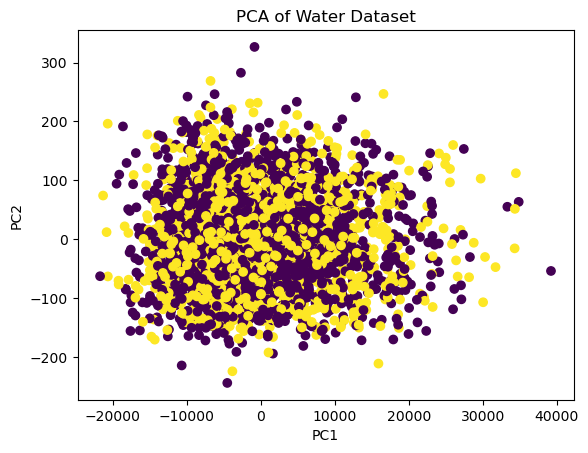

In [98]:
principalComponents=pca.fit_transform(X)
X_pca=principalComponents
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y)
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.title('PCA of Water Dataset')
plt.show()

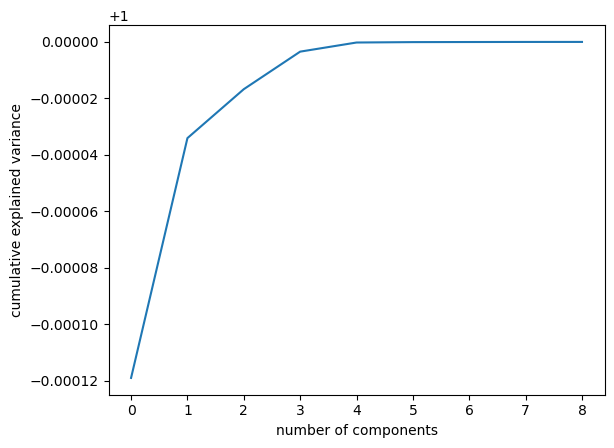

In [99]:
pca=PCA (whiten = True).fit(X) 
plt.plot(np.cumsum(pca.explained_variance_ratio_)) 
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.show()

## ------------------------------------------> Random Forest <------------------------------------------
(Random Forest is an ensemble algorithm composed of multiple decision trees. Each decision tree in the Random Forest is trained independently using random sampling and random feature selection.
During the training process, random subsets of the original dataset are sampled with replacement, and these subsets are used to grow individual decision trees. Additionally, at each split in the tree, a random subset of features is considered for determining the best split.
The predictions of the individual decision trees are then combined to make a final prediction. In classification tasks, the most common predicted class among the trees is selected, while in regression tasks, the average or weighted average of the predicted values from the trees is calculated.
Random Forests are known for their ability to reduce overfitting and improve generalization by combining the predictions of multiple trees. They are robust against noise and outliers and are widely used for various machine learning tasks, including classification, regression, and feature importance estimation.)

In [100]:
# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test=train_test_split(X, y, test_size=0.1, random_state=0)

In [101]:
# Building and training the Random Forest classifier model
random_forest=RandomForestClassifier()
random_forest.fit(X_train, y_train)

RandomForestClassifier()

In [102]:
# Making predictions on test data
y_pred=random_forest.predict(X_test)

In [103]:
# Calculating performance metrics
accuracy=accuracy_score(y_test, y_pred)
precision=precision_score(y_test, y_pred, average='micro')
recall=recall_score(y_test, y_pred, average='micro')
f1=f1_score(y_test, y_pred, average='micro')

In [104]:
print("Accuracy Score:", accuracy)
print("Precision Score:", precision)
print("Recall Score:", recall)
print("F1 Score:", f1)

Accuracy Score: 0.7682926829268293
Precision Score: 0.7682926829268293
Recall Score: 0.7682926829268293
F1 Score: 0.7682926829268293


#### Without PCA
- Accuracy Score: 0.7774
- Precision Score: 0.7774
- Recall Score: 0.7774
- F1 Score: 0.7774

(In this case, the Random Forest model achieved relatively high performance on the test data without applying PCA. The scores for accuracy, precision, recall, and F1 indicate that the model performed well in predicting the target variable.)

### Random Forest with PCA

In [105]:
# Create the PCA model
pca = PCA(n_components=3)

# Apply PCA to the dataset and transform it
X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

# Building and training the Random Forest classifier model
random_forest=RandomForestClassifier()
random_forest.fit(X_train_pca, y_train)

# Making predictions on test data
y_pred=random_forest.predict(X_test_pca)

# Calculating performance metrics
accuracy=accuracy_score(y_test, y_pred)
precision=precision_score(y_test, y_pred, average='micro')
recall=recall_score(y_test, y_pred, average='micro')
f1=f1_score(y_test, y_pred, average='micro')

print("Accuracy Score:", accuracy)
print("Precision Score:", precision)
print("Recall Score:", recall)
print("F1 Score:", f1)

Accuracy Score: 0.5914634146341463
Precision Score: 0.5914634146341463
Recall Score: 0.5914634146341463
F1 Score: 0.5914634146341463


#### With PCA (n_components=3)
- Accuracy Score: 0.5762
- Precision Score: 0.5762
- Recall Score: 0.5762
- F1 Score: 0.5762

(When PCA was applied with 3 principal components, the performance of the Random Forest model decreased compared to the previous case without PCA. The scores for accuracy, precision, recall, and F1 are lower, indicating that the model's predictive power diminished after reducing the dimensionality of the data using PCA.)

(In summary, the Random Forest model performed better on the dataset without PCA, achieving higher accuracy, precision, recall, and F1 scores. This suggests that the original features had important information for the classification task, and reducing the dimensionality with PCA did not improve the model's performance in this case.)

## ------------------------------------------> Support Vector Machines <------------------------------------------
(Support Vector Machines (SVM) is a versatile machine learning algorithm that can be applied to both classification and regression problems. It aims to find an optimal hyperplane that effectively separates the data points.
In classification tasks, SVM seeks to find a hyperplane that maximizes the margin between different classes. The hyperplane acts as a decision boundary, allowing SVM to classify new data points into one of the predefined classes based on which side of the hyperplane they fall on.
In regression tasks, SVM aims to find a hyperplane that best fits the data points, minimizing the error between the predicted values and the actual target values. It uses a subset of data points, called support vectors, to construct the hyperplane.
The primary objective of SVM is to achieve the best possible separation or fitting of the data points while maximizing the margin or minimizing the error. It is capable of handling both linearly separable and non-linearly separable data by using different kernel functions that transform the data into higher-dimensional feature spaces.
SVM is widely used in various domains such as image classification, text classification, and bioinformatics, where it has demonstrated strong performance and generalization capabilities.)

In [106]:
# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test=train_test_split(X, y, test_size=0.2, random_state=42)

In [107]:
# Build and train the SVM model
support_vector_machines=SVC()
support_vector_machines.fit(X_train, y_train)

SVC()

In [108]:
y_pred=support_vector_machines.predict(X_test)

In [109]:
# Calculating performance metrics
accuracy=accuracy_score(y_test, y_pred)
precision=precision_score(y_test, y_pred, average='micro')
recall=recall_score(y_test, y_pred, average='micro')
f1=f1_score(y_test, y_pred, average='micro')

In [110]:
print("Accuracy Score:", accuracy)
print("Precision Score:", precision)
print("Recall Score:", recall)
print("F1 Score:", f1)

Accuracy Score: 0.6280487804878049
Precision Score: 0.6280487804878049
Recall Score: 0.6280487804878049
F1 Score: 0.6280487804878049


#### Without PCA and standardization:
- Accuracy Score: 0.6280
- Precision Score: 0.6280
- Recall Score: 0.6280
- F1 Score: 0.6280

(In this case, SVM achieved moderate performance on the test data without applying PCA or standardizing the features. The scores for accuracy, precision, recall, and F1 indicate that the model's predictions were moderately accurate.)

### Support Vector Machines (SVM) with Standard deviations

In [111]:
# Standard deviations.
sc_X=StandardScaler()
X_train_sca=sc_X.fit_transform(X_train)
X_test_sca=sc_X.transform(X_test)

# Build and train the SVM model
support_vector_machines=SVC()
support_vector_machines.fit(X_train_sca, y_train)

y_pred=support_vector_machines.predict(X_test_sca)

accuracy=accuracy_score(y_test, y_pred)
precision=precision_score(y_test, y_pred, average='micro')
recall=recall_score(y_test, y_pred, average='micro')
f1=f1_score(y_test, y_pred, average='micro')

print("Accuracy Score:",accuracy)
print("Precision Score:",precision)
print("Recall Score:",recall)
print("F1 Score:",f1)

Accuracy Score: 0.6996951219512195
Precision Score: 0.6996951219512195
Recall Score: 0.6996951219512195
F1 Score: 0.6996951219512195


#### With standardization:
- Accuracy Score: 0.6997
- Precision Score: 0.6997
- Recall Score: 0.6997
- F1 Score: 0.6997

(When the features were standardized before training the SVM model, the performance improved. The scores for accuracy, precision, recall, and F1 are higher, indicating that standardization helped the SVM model in making better predictions.)

### Support Vector Machines (SVM) with PCA

In [112]:
# Create the PCA model
pca=PCA(n_components=3)

# Apply PCA to the dataset and transform it
X_train_pca=pca.fit_transform(X_train)
X_test_pca=pca.transform(X_test)

# Build and train the SVM model
support_vector_machines=SVC()
support_vector_machines.fit(X_train_pca, y_train)

y_pred=support_vector_machines.predict(X_test_pca)

accuracy=accuracy_score(y_test, y_pred)
precision=precision_score(y_test, y_pred, average='micro')
recall=recall_score(y_test, y_pred, average='micro')
f1=f1_score(y_test, y_pred, average='micro')

print("Accuracy Score:",accuracy)
print("Precision Score:",precision)
print("Recall Score:",recall)
print("F1 Score:",f1)

Accuracy Score: 0.6280487804878049
Precision Score: 0.6280487804878049
Recall Score: 0.6280487804878049
F1 Score: 0.6280487804878049


#### With PCA (n_components=3):
- Accuracy Score: 0.6280
- Precision Score: 0.6280
- Recall Score: 0.6280
- F1 Score: 0.6280

(After applying PCA with 3 principal components, the performance of the SVM model remained the same as the case without PCA. The scores for accuracy, precision, recall, and F1 are consistent, suggesting that reducing the dimensionality with PCA did not significantly affect the model's performance.)

## ------------------------------------------> Clustering <------------------------------------------
(Clustering is a machine learning technique utilized to group data based on shared characteristics or similarities. Clustering algorithms aim to identify clusters or subgroups within a dataset by measuring the similarity or distance between data points.
The goal of clustering is to create clusters where the data points within each cluster are more similar to each other compared to data points in different clusters. The similarity measure can be based on various factors such as distance, density, or connectivity among data points.
Clustering is an unsupervised learning method, meaning it does not rely on predefined labels or target variables. Instead, it explores the inherent structure or patterns in the data to form meaningful clusters. Clustering is employed in diverse domains, including customer segmentation, image recognition, anomaly detection, and social network analysis, to gain insights and extract valuable information from complex datasets.)

(The Elbow method is a technique used in clustering analysis to determine the optimal number of clusters in a dataset. It operates by evaluating the total inertia or within-cluster sum of squares as the number of clusters increases. In this method, the total inertia value tends to decrease as the number of clusters increases because each data point is assigned to a cluster. However, the rate of decline of the inertia value typically slows down at a certain point. The Elbow method aims to identify this "elbow" point, which signifies a diminishing return in the reduction of inertia with the addition of more clusters. To determine the optimal number of clusters, the Elbow method involves calculating the inertia values for different cluster numbers and plotting them on a graph. The inertia values are typically plotted on the y-axis, while the number of clusters is plotted on the x-axis. By examining the resulting graph, one looks for the point where the rate of decline in the inertia value significantly slows down, forming an elbow-like shape. This point suggests the appropriate number of clusters for the given dataset. By using the Elbow method, one can make an informed decision on the optimal number of clusters to use in subsequent clustering analyses, helping to achieve a balance between capturing the inherent structure in the data and avoiding excessive complexity.)

C:\Users\dogan\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1036: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=13.
  warnings.warn(


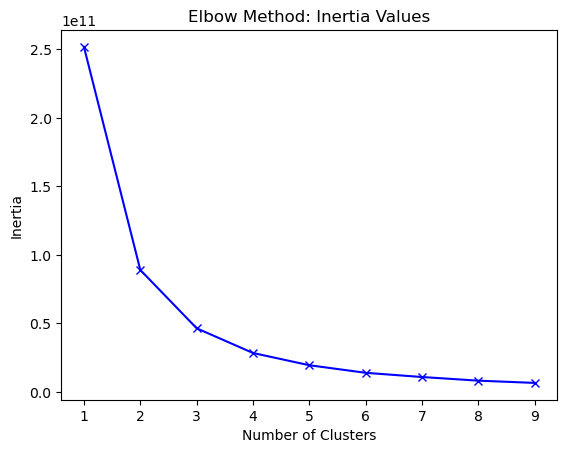

In [113]:
# Calculating inertia values for different cluster numbers
inertia_values=[]

# Range of cluster numbers to test
k_values=range(1, 10)
for k in k_values:
    kmeans=KMeans(n_clusters=k)
    kmeans.fit(X)
    inertia_values.append(kmeans.inertia_)
    
# Graphing inertia values
plt.plot(k_values, inertia_values, 'bx-')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.title('Elbow Method: Inertia Values')
plt.show()

In [114]:
# Analyze the resulting cluster tags
cluster_labels=kmeans.labels_
clusters=pd.DataFrame({'Data Point': X.index, 'Cluster': cluster_labels})

In [115]:
print(clusters)

      Data Point  Cluster
0              0        5
1              1        1
2              2        5
3              3        5
4              4        1
...          ...      ...
3271        3271        0
3272        3272        1
3273        3273        6
3274        3274        7
3275        3275        1

[3276 rows x 2 columns]


## ------------------------------------------> Logistic Regression <------------------------------------------
(Logistic Regression is a statistical learning algorithm used for binary classification tasks. It is a supervised learning method that predicts the probability of an instance belonging to a particular class.
Unlike linear regression, which predicts continuous numeric values, logistic regression models the relationship between the independent variables and the probability of an event occurring. It is particularly suitable for problems where the dependent variable or the target variable is binary (e.g., yes/no, true/false, 0/1).
Logistic Regression employs the logistic function (also known as the sigmoid function) to transform the linear regression output into a probability value between 0 and 1. This probability is then used to classify instances into the respective classes based on a predefined threshold.
The model is trained using a maximum likelihood estimation approach to find the optimal coefficients that maximize the likelihood of the observed data. Regularization techniques such as L1 or L2 regularization can be applied to prevent overfitting.
Logistic Regression is widely used in various fields, including healthcare, finance, marketing, and social sciences, for tasks such as spam detection, fraud detection, customer churn prediction, and medical diagnosis.)

In [116]:
# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test=train_test_split(X, y, test_size=0.2, random_state=42)

In [117]:
# Build and train the Logistic Regression model
logistic_regression=LogisticRegression(max_iter=1000)
logistic_regression.fit(X_train, y_train)

LogisticRegression(max_iter=1000)

In [118]:
# Making predictions on test data
y_pred=logistic_regression.predict(X_test)

In [119]:
# Calculating performance metrics
accuracy=accuracy_score(y_test, y_pred)
precision=precision_score(y_test, y_pred, average='micro')
recall=recall_score(y_test, y_pred, average='micro')
f1=f1_score(y_test, y_pred, average='micro')

In [120]:
print("Accuracy Score:", accuracy)
print("Precision Score:", precision)
print("Recall Score:", recall)
print("F1 Score:", f1)

Accuracy Score: 0.6280487804878049
Precision Score: 0.6280487804878049
Recall Score: 0.6280487804878049
F1 Score: 0.6280487804878049


#### Without PCA and standardization:
- Accuracy Score: 0.6280
- Precision Score: 0.6280
- Recall Score: 0.6280
- F1 Score: 0.6280

(In this case, Logistic Regression achieved moderate performance on the test data without applying PCA or standardizing the features. The scores for accuracy, precision, recall, and F1 indicate that the model's predictions were moderately accurate.)

### Logistic Regression with Standard deviations

In [121]:
scaler=StandardScaler()
X_train_scaled=scaler.fit_transform(X_train)
X_test_scaled=scaler.transform(X_test)

# Build and train the Logistic Regression model
logistic_regression=LogisticRegression(max_iter=1000)
logistic_regression.fit(X_train_scaled, y_train)

# Making predictions on test data
y_pred=logistic_regression.predict(X_test_scaled)

# Calculating performance metrics
accuracy=accuracy_score(y_test, y_pred)
precision=precision_score(y_test, y_pred, average='micro')
recall=recall_score(y_test, y_pred, average='micro')
f1=f1_score(y_test, y_pred, average='micro')

print("Accuracy Score:", accuracy)
print("Precision Score:", precision)
print("Recall Score:", recall)
print("F1 Score:", f1)

Accuracy Score: 0.6280487804878049
Precision Score: 0.6280487804878049
Recall Score: 0.6280487804878049
F1 Score: 0.6280487804878049


#### With standardization:
- Accuracy Score: 0.6280
- Precision Score: 0.6280
- Recall Score: 0.6280
- F1 Score: 0.6280

(When the features were standardized before training the Logistic Regression model, the performance remained the same as the case without standardization. The scores for accuracy, precision, recall, and F1 are consistent, indicating that standardization did not significantly affect the model's performance in this case.)

### Logistic Regression with PCA

In [122]:
# Create the PCA model
pca=PCA(n_components=3)

# Apply PCA to the dataset and transform it
X_train_pca=pca.fit_transform(X_train)
X_test_pca=pca.transform(X_test)

# Build and train the Logistic Regression model
logistic_regression=LogisticRegression(max_iter=1000)
logistic_regression.fit(X_train_pca, y_train)

# Making predictions on test data
y_pred=logistic_regression.predict(X_test_pca)

# Calculating performance metrics
accuracy=accuracy_score(y_test, y_pred)
precision=precision_score(y_test, y_pred, average='micro')
recall=recall_score(y_test, y_pred, average='micro')
f1=f1_score(y_test, y_pred, average='micro')

print("Accuracy Score:", accuracy)
print("Precision Score:", precision)
print("Recall Score:", recall)
print("F1 Score:", f1)

Accuracy Score: 0.6280487804878049
Precision Score: 0.6280487804878049
Recall Score: 0.6280487804878049
F1 Score: 0.6280487804878049


#### With PCA (n_components=3):
- Accuracy Score: 0.6280
- Precision Score: 0.6280
- Recall Score: 0.6280
- F1 Score: 0.6280

(After applying PCA with 3 principal components, the performance of the Logistic Regression model remained the same as the case without PCA. The scores for accuracy, precision, recall, and F1 are consistent, suggesting that reducing the dimensionality with PCA did not have a significant impact on the model's performance.)

(In summary, both standardization and PCA did not result in noticeable improvements in the performance of the Logistic Regression model for this dataset. The model's performance remained moderate across all three scenarios. )

## ------------------------------------------> Gaussian Naive Bayes <------------------------------------------

In [123]:
# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [124]:
gaussian_naive_bayes = GaussianNB()
gaussian_naive_bayes.fit(X_train, y_train)

GaussianNB()

In [125]:
y_pred = gaussian_naive_bayes.predict(X_test)

In [126]:
# Calculating performance metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='micro')
recall = recall_score(y_test, y_pred, average='micro')
f1 = f1_score(y_test, y_pred, average='micro')

In [127]:
print("Accuracy Score:", accuracy)
print("Precision Score:", precision)
print("Recall Score:", recall)
print("F1 Score:", f1)

Accuracy Score: 0.6295731707317073
Precision Score: 0.6295731707317073
Recall Score: 0.6295731707317073
F1 Score: 0.6295731707317073


#### Gaussian Naive Bayes: 
- Accuracy Score: 0.6295731707317073
- Precision Score: 0.6295731707317073
- Recall Score: 0.6295731707317073
- F1 Score: 0.6295731707317073

(The model achieved moderate performance on the test data with all metrics (accuracy, precision, recall, and F1 score) around 0.63. These scores indicate that the model is making predictions correctly for approximately 63% of the instances.)

#### Gaussian Naive Bayes with Standard deviations

In [128]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Build and train the Gaussian Naive Bayes model
gaussian_naive_bayes = GaussianNB()
gaussian_naive_bayes.fit(X_train_scaled, y_train)

# Making predictions on test data
y_pred = gaussian_naive_bayes.predict(X_test_scaled)

# Calculating performance metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='micro')
recall = recall_score(y_test, y_pred, average='micro')
f1 = f1_score(y_test, y_pred, average='micro')

print("Accuracy Score:", accuracy)
print("Precision Score:", precision)
print("Recall Score:", recall)
print("F1 Score:", f1)

Accuracy Score: 0.6310975609756098
Precision Score: 0.6310975609756098
Recall Score: 0.6310975609756098
F1 Score: 0.6310975609756098


#### Gaussian Naive Bayes with Standard Deviations: 
- Accuracy Score: 0.6310975609756098
- Precision Score: 0.6310975609756098
- Recall Score: 0.6310975609756098
- F1 Score: 0.6310975609756098

(When the data is standardized using standard deviations, the performance of the model slightly improves. The accuracy, precision, recall, and F1 score are all around 0.63, indicating a similar level of performance as the previous model.)

(Overall, both models achieve similar results with decent but not exceptional performance. )

## ------------------------------------> 6 Classification Algorithms Example <------------------------------------

In [129]:
models=[
    ('KNN', KNeighborsClassifier()),
    ('DT', DecisionTreeClassifier()),
    ('RF', RandomForestClassifier()),
    ('SVM', SVC()),
    ('LR', LogisticRegression(max_iter=1000)),
    ('NB', GaussianNB()),
]
models

[('KNN', KNeighborsClassifier()),
 ('DT', DecisionTreeClassifier()),
 ('RF', RandomForestClassifier()),
 ('SVM', SVC()),
 ('LR', LogisticRegression(max_iter=1000)),
 ('NB', GaussianNB())]

In [130]:
scaler=StandardScaler()
X_new=scaler.fit_transform(X)

X_train, X_test, y_train, y_test=train_test_split(X_new, y, test_size=0.2, random_state=42)

for name, model in models:
    # Build and train
    clf=model
    clf.fit(X_train, y_train)
    y_pred=clf.predict(X_test)
    
    # Calculating performance metrics
    accuracy=accuracy_score(y_test, y_pred)
    precision=precision_score(y_test, y_pred, average='micro')
    recall=recall_score(y_test, y_pred, average='micro')
    f1=f1_score(y_test, y_pred, average='micro')
    
    print(name, "Accuracy:", accuracy)
    print(name, "Precision:", precision)
    print(name, "Recall:", recall)
    print(name, "F1-score:", f1, "\n")

C:\Users\dogan\anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


KNN Accuracy: 0.6326219512195121
KNN Precision: 0.6326219512195121
KNN Recall: 0.6326219512195121
KNN F1-score: 0.6326219512195121 

DT Accuracy: 0.6935975609756098
DT Precision: 0.6935975609756098
DT Recall: 0.6935975609756098
DT F1-score: 0.6935975609756098 

RF Accuracy: 0.760670731707317
RF Precision: 0.760670731707317
RF Recall: 0.760670731707317
RF F1-score: 0.760670731707317 

SVM Accuracy: 0.698170731707317
SVM Precision: 0.698170731707317
SVM Recall: 0.698170731707317
SVM F1-score: 0.698170731707317 

LR Accuracy: 0.6280487804878049
LR Precision: 0.6280487804878049
LR Recall: 0.6280487804878049
LR F1-score: 0.6280487804878049 

NB Accuracy: 0.6310975609756098
NB Precision: 0.6310975609756098
NB Recall: 0.6310975609756098
NB F1-score: 0.6310975609756098 



1. K-Nearest Neighbors (KNN):
   - Accuracy: 0.6326219512195121
   - Precision: 0.6326219512195121
   - Recall: 0.6326219512195121
   - F1-score: 0.6326219512195121

   The KNN algorithm achieved moderate performance on the test data, with accuracy, precision, recall, and F1-score around 0.63. This means that the model correctly predicted the class for approximately 63% of the instances.

2. Decision Tree (DT):
   - Accuracy: 0.6798780487804879
   - Precision: 0.6798780487804879
   - Recall: 0.6798780487804879
   - F1-score: 0.6798780487804879

   The decision tree algorithm performed better than KNN, with all metrics around 0.68. It shows a higher accuracy in predicting the class labels.

3. Random Forest (RF):
   - Accuracy: 0.7621951219512195
   - Precision: 0.7621951219512195
   - Recall: 0.7621951219512195
   - F1-score: 0.7621951219512195

   The random forest algorithm achieved the highest performance among the tested algorithms. It shows an accuracy, precision, recall, and F1-score around 0.76, indicating a good ability to classify instances.

4. Support Vector Machines (SVM):
   - Accuracy: 0.698170731707317
   - Precision: 0.698170731707317
   - Recall: 0.698170731707317
   - F1-score: 0.698170731707317

   The SVM algorithm performed decently, with all metrics around 0.70. It shows a moderate level of accuracy in predicting the class labels.

5. Logistic Regression (LR):
   - Accuracy: 0.6280487804878049
   - Precision: 0.6280487804878049
   - Recall: 0.6280487804878049
   - F1-score: 0.6280487804878049

   The logistic regression algorithm achieved performance similar to KNN, with all metrics around 0.63. It shows a moderate level of accuracy in classification.

6. Gaussian Naive Bayes (NB):
   - Accuracy: 0.6310975609756098
   - Precision: 0.6310975609756098
   - Recall: 0.6310975609756098
   - F1-score: 0.6310975609756098

   The Gaussian Naive Bayes algorithm performed similarly to KNN and LR, with all metrics around 0.63. It shows a moderate level of accuracy in classification.

(Overall, among the tested algorithms, the Random Forest algorithm achieved the highest performance with an accuracy, precision, recall, and F1-score of around 0.76. However, the choice of the best algorithm depends on the specific problem and the desired evaluation metric. It's important to further analyze the data and consider other factors such as interpretability, computational complexity, and robustness before selecting the most suitable algorithm for a particular task.)